In [6]:
import pandas as pd
import os
import matplotlib.pyplot as plt

In [7]:
base_path = r"C:\Users\Yinghao Meng\OneDrive - University of Tennessee\DSE511\final project"

files = {
    "2020": "2020_complaints.csv",
    "2021": "2021_complaints.csv",
    "2022": "2022_complaints.csv",
    "2023": "2023_complaints.csv",
    "2024": "2024_complaints.csv",
}

results = {}
model_year_data = []

In [8]:
brand_year_data = []

for year, filename in files.items():
    filepath = os.path.join(base_path, filename)
    print(f"===== Data Analysis for {year} =====")
    
    df = pd.read_csv(filepath, encoding='latin1', low_memory=False)

    top_make = df['make'].value_counts().idxmax()
    top_make_count = df['make'].value_counts().max()

    top_model = df['model'].value_counts().idxmax()
    top_model_count = df['model'].value_counts().max()
    
    top_prod_type = df['products_type'].value_counts().idxmax()
    top_prod_type_count = df['products_type'].value_counts().max()
    
    top_component = df['components'].value_counts().idxmax()
    top_component_count = df['components'].value_counts().max()
    
    results[year] = {
        "Top Make": (top_make, top_make_count),
        "Top Model": (top_model, top_model_count),
        "Top Product Type": (top_prod_type, top_prod_type_count),
        "Top Component": (top_component, top_component_count),
    }

    print(f"The most frequently complained brand: {top_make}  ({top_make_count} times)")
    print(f"The most frequently complained model: {top_model}  ({top_model_count} times)")
    print(f"The most frequently complained product type: {top_prod_type}  ({top_prod_type_count} times)")
    print(f"The most frequently complained component: {top_component}  ({top_component_count} times)")
    print()
    brand_counts = df['make'].value_counts()
    for make, count in brand_counts.items():
        brand_year_data.append([int(year), make, count])
    model_counts_year = (
        df.groupby(["make", "model"])
          .size()
          .reset_index(name="count")
    )
    for _, row in model_counts_year.iterrows():
        model_year_data.append([int(year), row["make"], row["model"], row["count"]])

===== Data Analysis for 2020 =====
The most frequently complained brand: FORD  (17570 times)
The most frequently complained model: ESCAPE  (3454 times)
The most frequently complained product type: Vehicle  (61455 times)
The most frequently complained component: POWER TRAIN  (7043 times)

===== Data Analysis for 2021 =====
The most frequently complained brand: FORD  (19779 times)
The most frequently complained model: MODEL Y 7-SEAT  (3888 times)
The most frequently complained product type: Vehicle  (71653 times)
The most frequently complained component: POWER TRAIN  (7114 times)

===== Data Analysis for 2022 =====
The most frequently complained brand: FORD  (16345 times)
The most frequently complained model: SIERRA 1500  (2394 times)
The most frequently complained product type: Vehicle  (64145 times)
The most frequently complained component: ENGINE  (6062 times)

===== Data Analysis for 2023 =====
The most frequently complained brand: FORD  (6282 times)
The most frequently complained mo

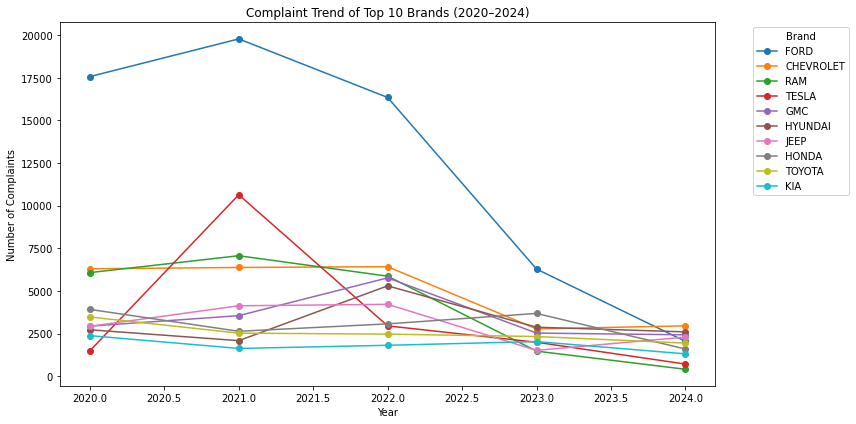

In [4]:
trend_df = pd.DataFrame(brand_year_data, columns=["year", "make", "count"])
top_brands_overall = (
    trend_df.groupby("make")["count"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index
)

plt.figure(figsize=(12, 6))

for make in top_brands_overall:
    temp = trend_df[trend_df["make"] == make]
    plt.plot(temp["year"], temp["count"], marker="o", label=make)

plt.title("Complaint Trend of Top 10 Brands (2020–2024)")
plt.xlabel("Year")
plt.ylabel("Number of Complaints")
plt.legend(title="Brand", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


===================== Data Analysis for 2020 =====================


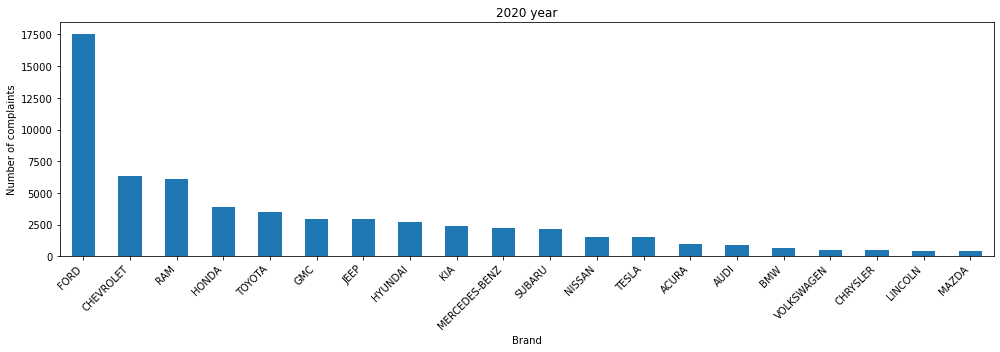

Top 5 Brands with the Most Complaints in 2020:
FORD         17570
CHEVROLET     6299
RAM           6076
HONDA         3918
TOYOTA        3474
Name: make, dtype: int64


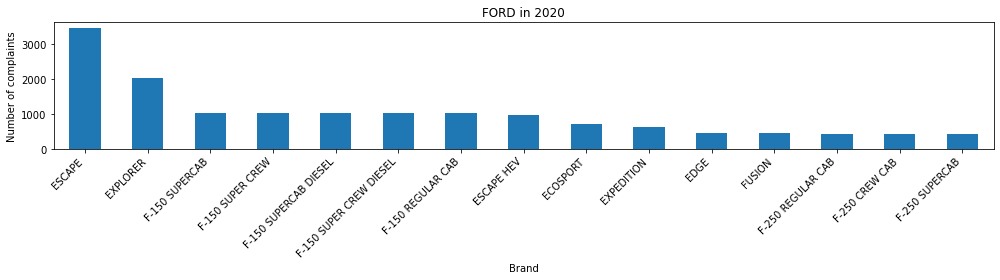

Top 10 models of FORD by number of complaints:
ESCAPE                     3454
EXPLORER                   2048
F-150 SUPERCAB             1032
F-150 SUPER CREW           1032
F-150 SUPERCAB DIESEL      1032
F-150 SUPER CREW DIESEL    1032
F-150 REGULAR CAB          1032
ESCAPE HEV                  982
ECOSPORT                    702
EXPEDITION                  624
Name: model, dtype: int64

Top products that complainted in 2020 FORD ESCAPE
Vehicle       3446
Tire             4
Equipment        2
Child Seat       2
Name: products_type, dtype: int64



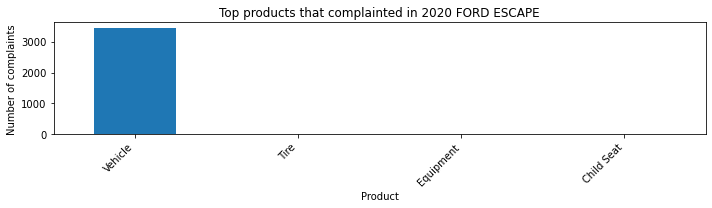

Top components that complainted in 2020 FORD ESCAPE
STRUCTURE                1188
UNKNOWN OR OTHER          468
POWER TRAIN               268
ENGINE                    200
FUEL SYSTEM, GASOLINE     128
Name: components, dtype: int64



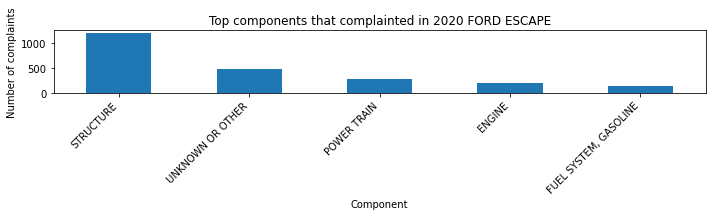

Top products that complainted in 2020 FORD EXPLORER
Vehicle    2046
Tire          2
Name: products_type, dtype: int64



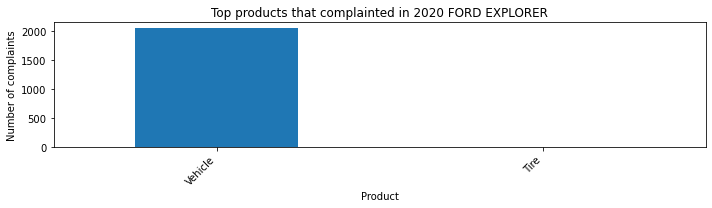

Top components that complainted in 2020 FORD EXPLORER
POWER TRAIN             538
UNKNOWN OR OTHER        194
BACK OVER PREVENTION    112
ELECTRICAL SYSTEM        82
ENGINE                   78
Name: components, dtype: int64



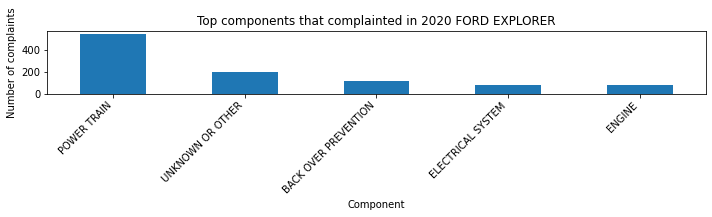

Top products that complainted in 2020 FORD F-150 SUPERCAB
Vehicle       1028
Child Seat       2
Tire             2
Name: products_type, dtype: int64



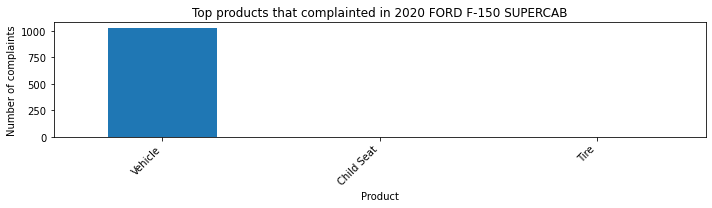

Top components that complainted in 2020 FORD F-150 SUPERCAB
POWER TRAIN          324
ENGINE               112
UNKNOWN OR OTHER      70
VISIBILITY            64
ELECTRICAL SYSTEM     60
Name: components, dtype: int64



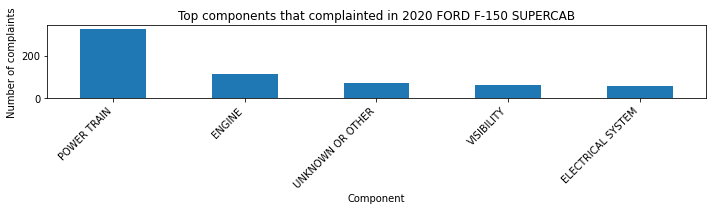

Top products that complainted in 2020 FORD F-150 SUPER CREW
Vehicle       1028
Child Seat       2
Tire             2
Name: products_type, dtype: int64



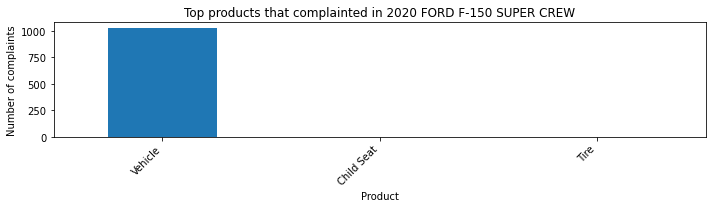

Top components that complainted in 2020 FORD F-150 SUPER CREW
POWER TRAIN          324
ENGINE               112
UNKNOWN OR OTHER      70
VISIBILITY            64
ELECTRICAL SYSTEM     60
Name: components, dtype: int64



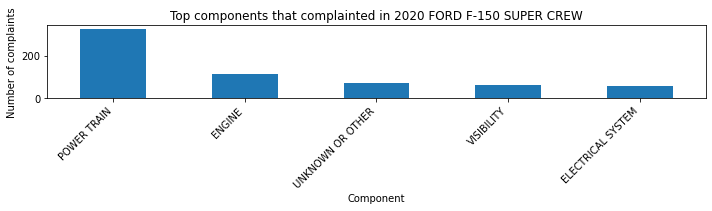

Top products that complainted in 2020 FORD F-150 SUPERCAB DIESEL
Vehicle       1028
Child Seat       2
Tire             2
Name: products_type, dtype: int64



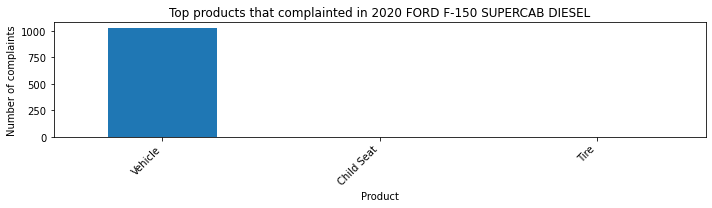

Top components that complainted in 2020 FORD F-150 SUPERCAB DIESEL
POWER TRAIN          324
ENGINE               112
UNKNOWN OR OTHER      70
VISIBILITY            64
ELECTRICAL SYSTEM     60
Name: components, dtype: int64



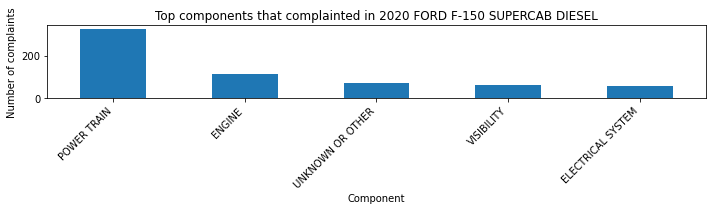

Top products that complainted in 2020 FORD F-150 SUPER CREW DIESEL
Vehicle       1028
Child Seat       2
Tire             2
Name: products_type, dtype: int64



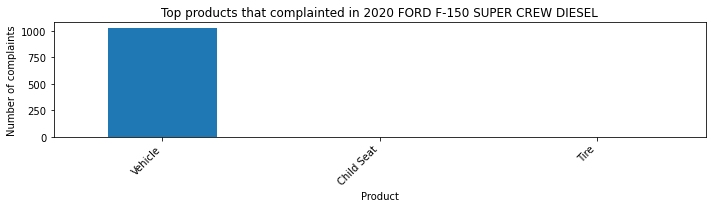

Top components that complainted in 2020 FORD F-150 SUPER CREW DIESEL
POWER TRAIN          324
ENGINE               112
UNKNOWN OR OTHER      70
VISIBILITY            64
ELECTRICAL SYSTEM     60
Name: components, dtype: int64



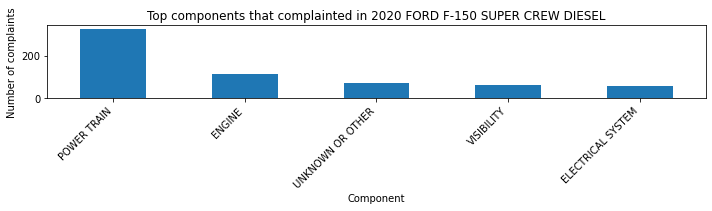

Top products that complainted in 2020 FORD F-150 REGULAR CAB
Vehicle       1028
Child Seat       2
Tire             2
Name: products_type, dtype: int64



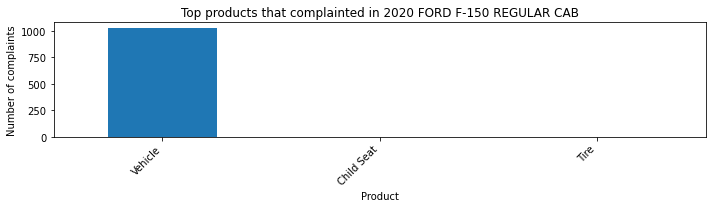

Top components that complainted in 2020 FORD F-150 REGULAR CAB
POWER TRAIN          324
ENGINE               112
UNKNOWN OR OTHER      70
VISIBILITY            64
ELECTRICAL SYSTEM     60
Name: components, dtype: int64



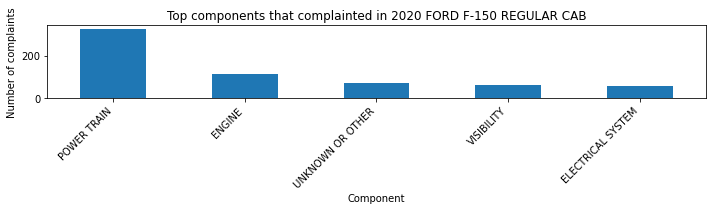

Top products that complainted in 2020 FORD ESCAPE HEV
Vehicle    980
Tire         2
Name: products_type, dtype: int64



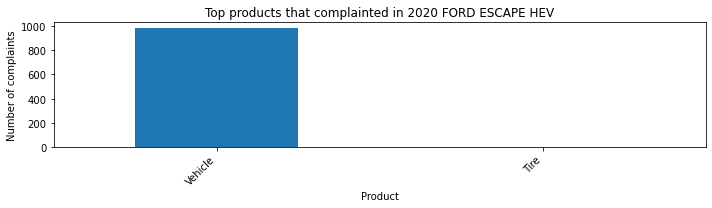

Top components that complainted in 2020 FORD ESCAPE HEV
STRUCTURE            284
ENGINE               164
UNKNOWN OR OTHER     144
POWER TRAIN           68
ELECTRICAL SYSTEM     42
Name: components, dtype: int64



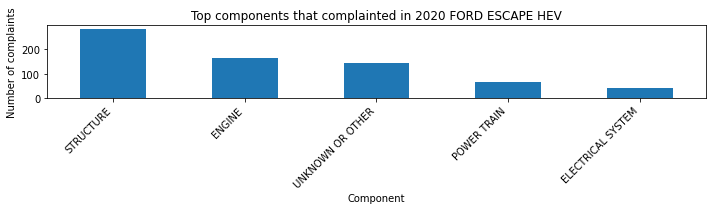

Top products that complainted in 2020 FORD ECOSPORT
Vehicle      698
Equipment      2
Tire           2
Name: products_type, dtype: int64



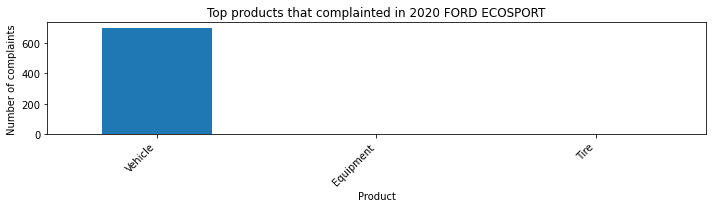

Top components that complainted in 2020 FORD ECOSPORT
ENGINE AND ENGINE COOLING        322
ENGINE                           164
POWER TRAIN,ENGINE                24
UNKNOWN OR OTHER                  22
ENGINE,FUEL/PROPULSION SYSTEM     18
Name: components, dtype: int64



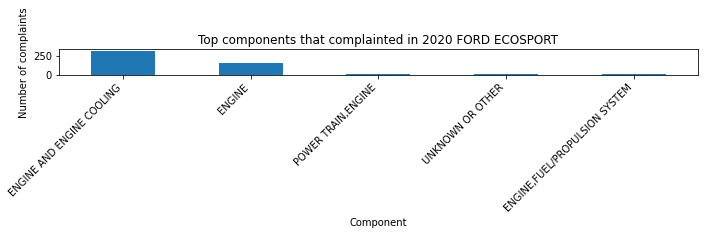

Top products that complainted in 2020 FORD EXPEDITION
Vehicle       620
Child Seat      2
Equipment       2
Name: products_type, dtype: int64



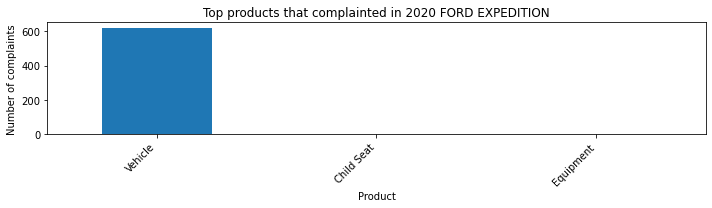

Top components that complainted in 2020 FORD EXPEDITION
POWER TRAIN           292
UNKNOWN OR OTHER       46
POWER TRAIN,ENGINE     32
SEAT BELTS             28
ENGINE                 22
Name: components, dtype: int64



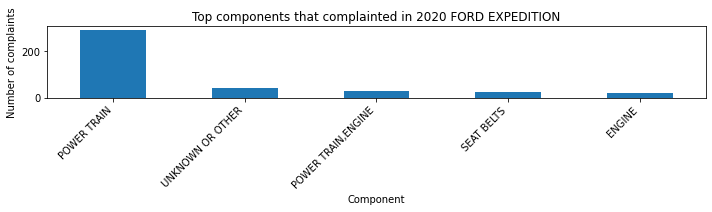

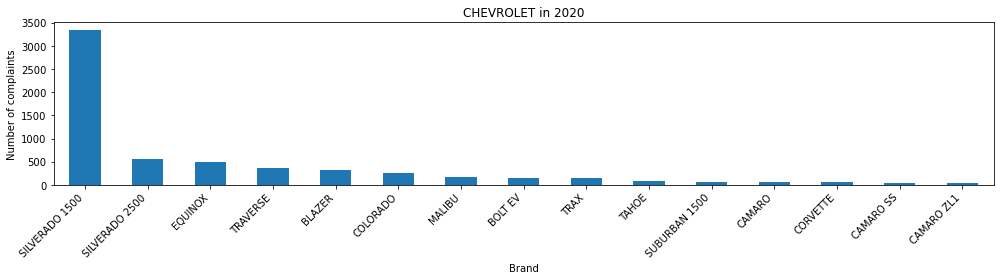

Top 10 models of CHEVROLET by number of complaints:
SILVERADO 1500    3336
SILVERADO 2500     558
EQUINOX            490
TRAVERSE           362
BLAZER             326
COLORADO           264
MALIBU             161
BOLT EV            159
TRAX               150
TAHOE               86
Name: model, dtype: int64

Top products that complainted in 2020 CHEVROLET SILVERADO 1500
Vehicle    3324
Tire         12
Name: products_type, dtype: int64



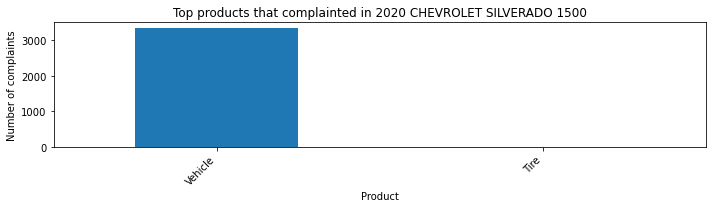

Top components that complainted in 2020 CHEVROLET SILVERADO 1500
POWER TRAIN         570
ENGINE              552
SERVICE BRAKES      216
STEERING            174
UNKNOWN OR OTHER    168
Name: components, dtype: int64



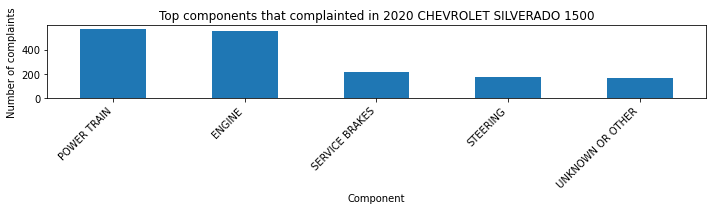

Top products that complainted in 2020 CHEVROLET SILVERADO 2500
Vehicle    504
Tire        54
Name: products_type, dtype: int64



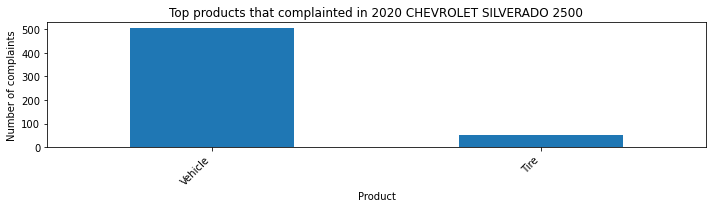

Top components that complainted in 2020 CHEVROLET SILVERADO 2500
TIRES             108
POWER TRAIN        96
STEERING           42
SERVICE BRAKES     36
STRUCTURE          30
Name: components, dtype: int64



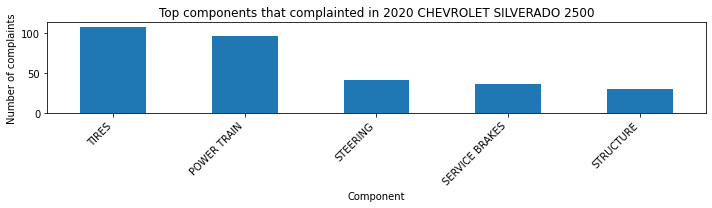

Top products that complainted in 2020 CHEVROLET EQUINOX
Vehicle       482
Child Seat      4
Equipment       2
Tire            2
Name: products_type, dtype: int64



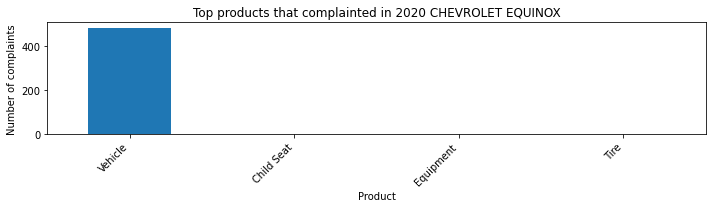

Top components that complainted in 2020 CHEVROLET EQUINOX
SERVICE BRAKES            72
FUEL/PROPULSION SYSTEM    46
ENGINE                    38
SERVICE BRAKES,ENGINE     22
UNKNOWN OR OTHER          22
Name: components, dtype: int64



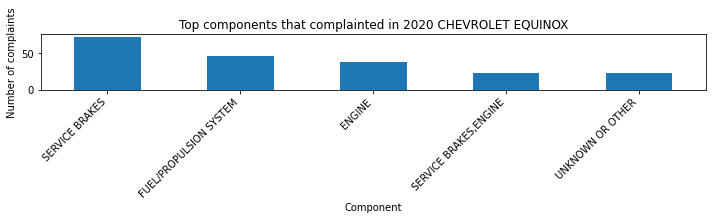

Top products that complainted in 2020 CHEVROLET TRAVERSE
Vehicle       358
Tire            2
Child Seat      2
Name: products_type, dtype: int64



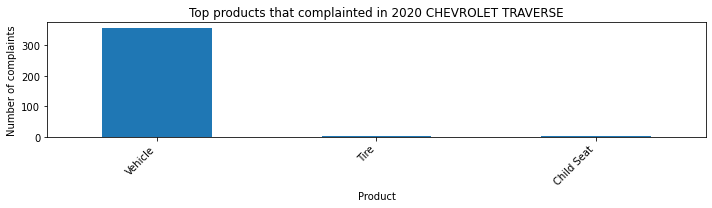

Top components that complainted in 2020 CHEVROLET TRAVERSE
ENGINE                       60
UNKNOWN OR OTHER             42
ENGINE AND ENGINE COOLING    36
POWER TRAIN                  34
ELECTRICAL SYSTEM            22
Name: components, dtype: int64



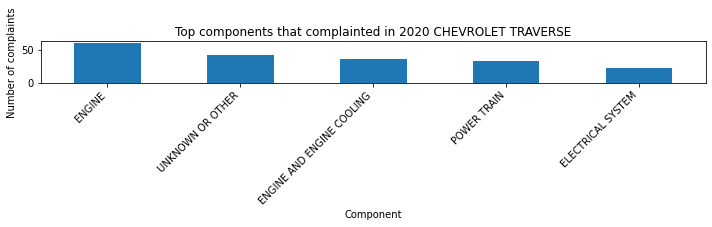

Top products that complainted in 2020 CHEVROLET BLAZER
Vehicle    320
Tire         6
Name: products_type, dtype: int64



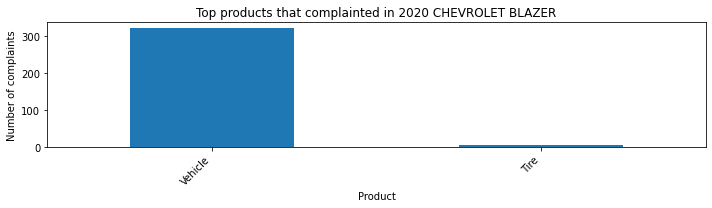

Top components that complainted in 2020 CHEVROLET BLAZER
POWER TRAIN                      50
UNKNOWN OR OTHER                 50
ENGINE                           40
ELECTRICAL SYSTEM                28
POWER TRAIN,ELECTRICAL SYSTEM    20
Name: components, dtype: int64



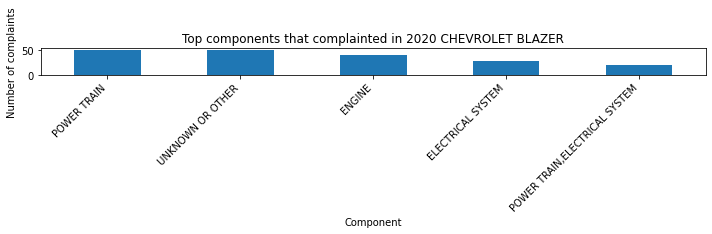

Top products that complainted in 2020 CHEVROLET COLORADO
Vehicle    264
Name: products_type, dtype: int64



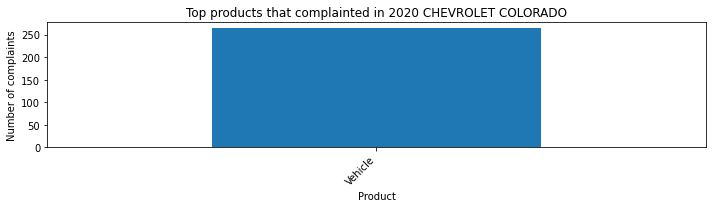

Top components that complainted in 2020 CHEVROLET COLORADO
POWER TRAIN           88
UNKNOWN OR OTHER      44
ENGINE                24
STEERING              20
POWER TRAIN,ENGINE    12
Name: components, dtype: int64



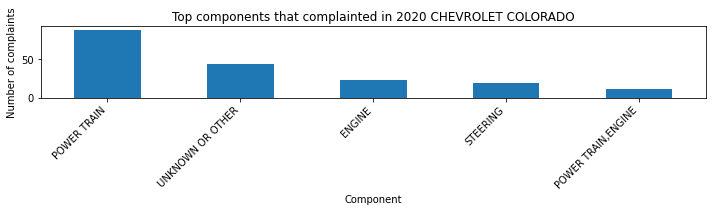

Top products that complainted in 2020 CHEVROLET MALIBU
Vehicle    161
Name: products_type, dtype: int64



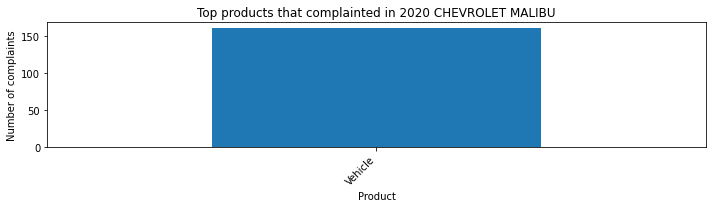

Top components that complainted in 2020 CHEVROLET MALIBU
POWER TRAIN              23
ELECTRICAL SYSTEM        19
UNKNOWN OR OTHER         15
ENGINE                   12
SERVICE BRAKES,ENGINE     7
Name: components, dtype: int64



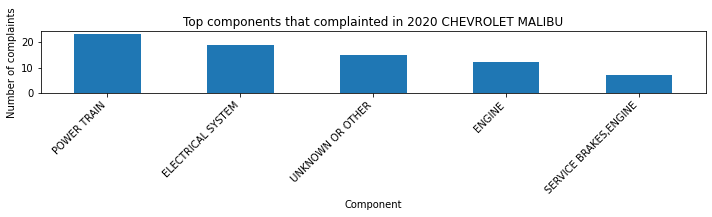

Top products that complainted in 2020 CHEVROLET BOLT EV
Vehicle      158
Equipment      1
Name: products_type, dtype: int64



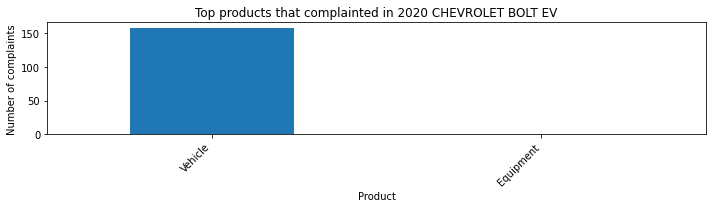

Top components that complainted in 2020 CHEVROLET BOLT EV
ELECTRICAL SYSTEM                           55
STEERING                                    18
UNKNOWN OR OTHER                            14
FUEL/PROPULSION SYSTEM                       7
ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM     6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


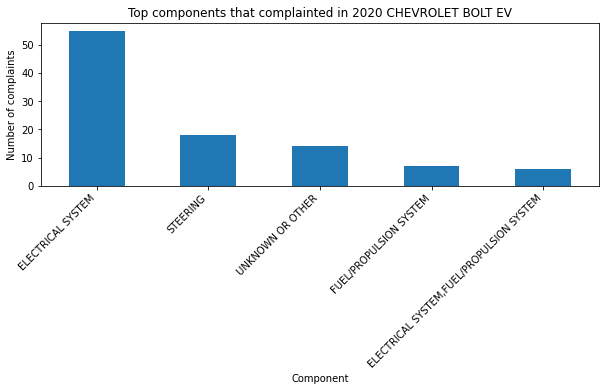

Top products that complainted in 2020 CHEVROLET TRAX
Vehicle       144
Tire            4
Child Seat      2
Name: products_type, dtype: int64



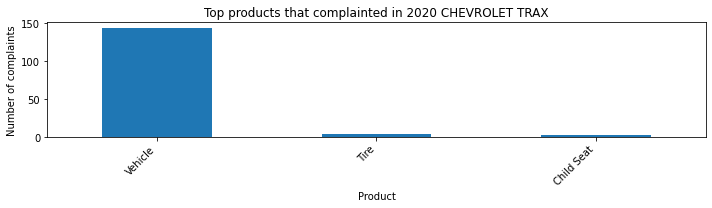

Top components that complainted in 2020 CHEVROLET TRAX
ENGINE               16
UNKNOWN OR OTHER     12
ELECTRICAL SYSTEM    10
POWER TRAIN          10
VISIBILITY/WIPER      8
Name: components, dtype: int64



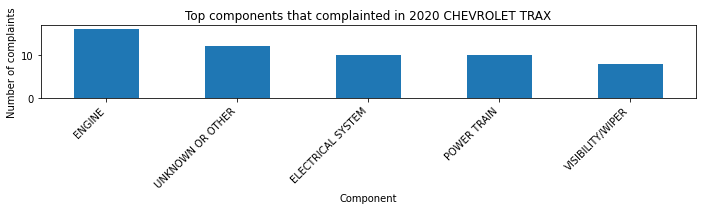

Top products that complainted in 2020 CHEVROLET TAHOE
Vehicle       80
Tire           4
Child Seat     2
Name: products_type, dtype: int64



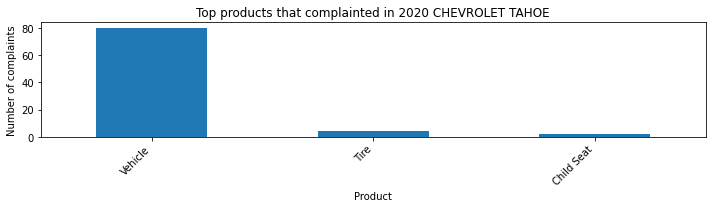

Top components that complainted in 2020 CHEVROLET TAHOE
ELECTRICAL SYSTEM         12
ENGINE                    12
POWER TRAIN               10
TIRES                      8
FUEL/PROPULSION SYSTEM     6
Name: components, dtype: int64



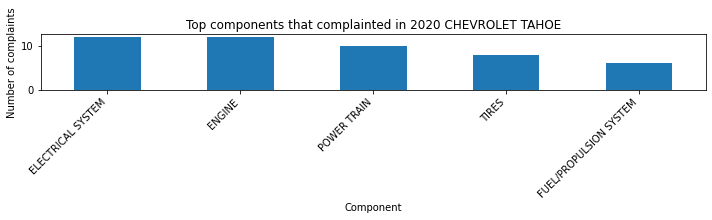

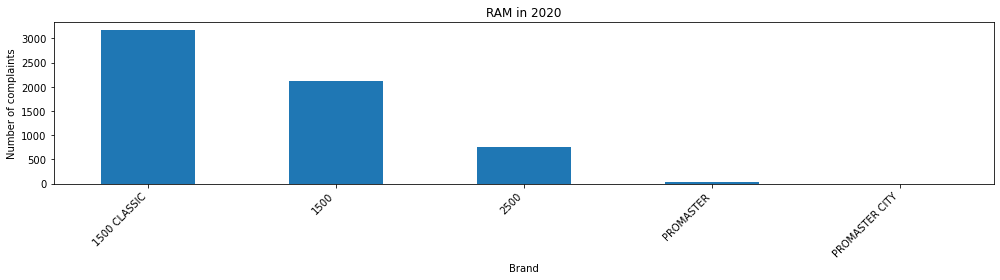

Top 10 models of RAM by number of complaints:
1500 CLASSIC      3174
1500              2116
2500               760
PROMASTER           25
PROMASTER CITY       1
Name: model, dtype: int64

Top products that complainted in 2020 RAM 1500 CLASSIC
Vehicle    3168
Tire          6
Name: products_type, dtype: int64



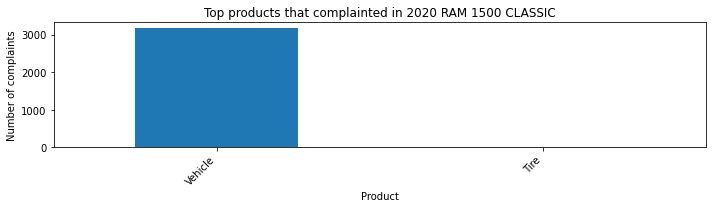

Top components that complainted in 2020 RAM 1500 CLASSIC
UNKNOWN OR OTHER     366
ENGINE               288
ELECTRICAL SYSTEM    234
VISIBILITY/WIPER     204
STEERING             186
Name: components, dtype: int64



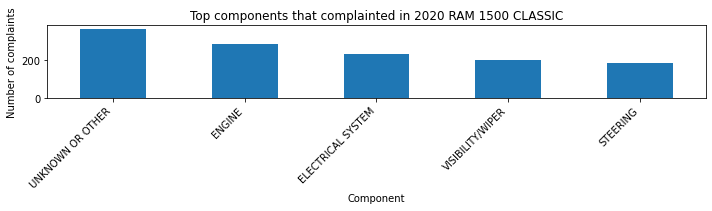

Top products that complainted in 2020 RAM 1500
Vehicle    2112
Tire          4
Name: products_type, dtype: int64



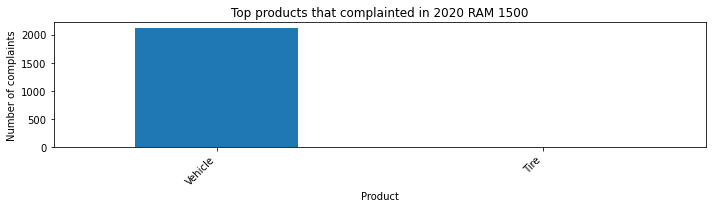

Top components that complainted in 2020 RAM 1500
UNKNOWN OR OTHER     244
ENGINE               192
ELECTRICAL SYSTEM    156
VISIBILITY/WIPER     136
STEERING             124
Name: components, dtype: int64



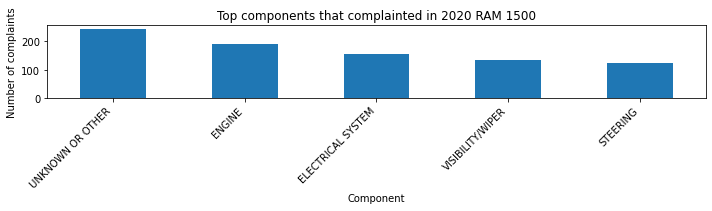

Top products that complainted in 2020 RAM 2500
Vehicle    755
Tire         5
Name: products_type, dtype: int64



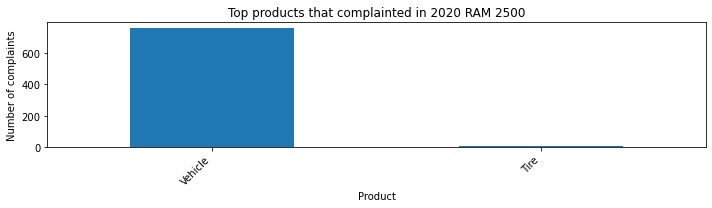

Top components that complainted in 2020 RAM 2500
FUEL SYSTEM, DIESEL              125
FUEL/PROPULSION SYSTEM            85
UNKNOWN OR OTHER                  60
ENGINE,FUEL/PROPULSION SYSTEM     50
POWER TRAIN                       45
Name: components, dtype: int64



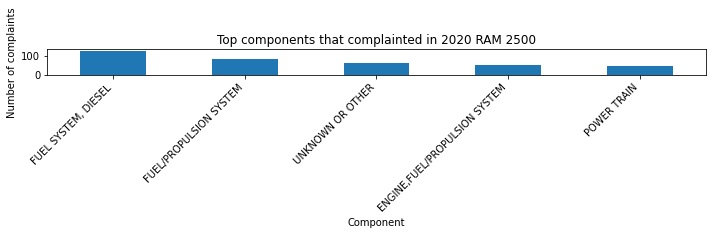

Top products that complainted in 2020 RAM PROMASTER
Vehicle    24
Tire        1
Name: products_type, dtype: int64



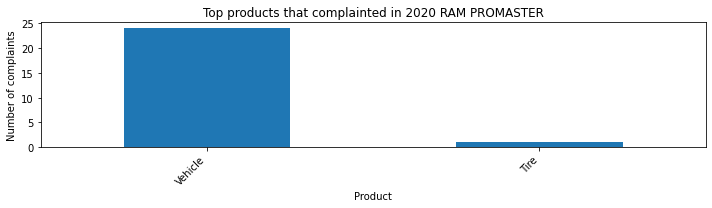

Top components that complainted in 2020 RAM PROMASTER
POWER TRAIN                6
UNKNOWN OR OTHER           4
TIRES                      2
UNKNOWN OR OTHER,ENGINE    1
BACK OVER PREVENTION       1
Name: components, dtype: int64



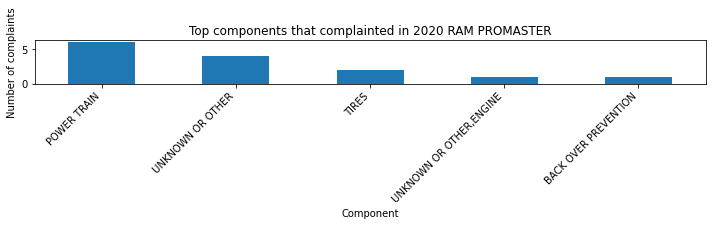

Top products that complainted in 2020 RAM PROMASTER CITY
Vehicle    1
Name: products_type, dtype: int64



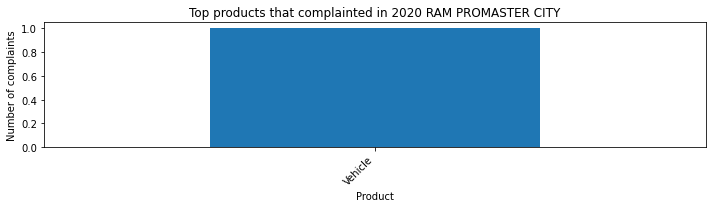

Top components that complainted in 2020 RAM PROMASTER CITY
STRUCTURE    1
Name: components, dtype: int64



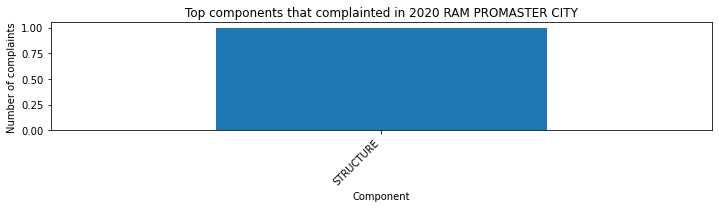

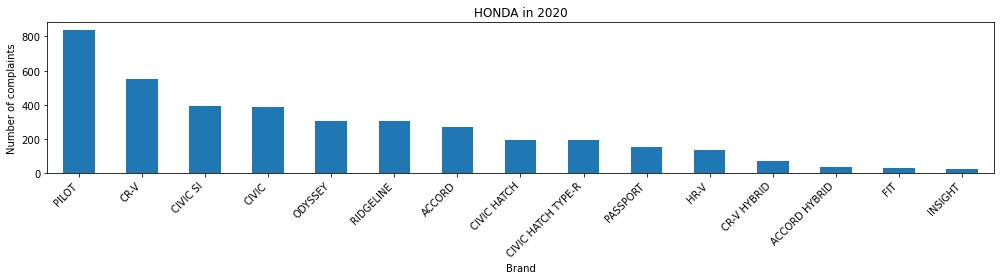

Top 10 models of HONDA by number of complaints:
PILOT                 840
CR-V                  552
CIVIC SI              396
CIVIC                 390
ODYSSEY               308
RIDGELINE             304
ACCORD                273
CIVIC HATCH           195
CIVIC HATCH TYPE-R    195
PASSPORT              156
Name: model, dtype: int64

Top products that complainted in 2020 HONDA PILOT
Vehicle    834
Tire         6
Name: products_type, dtype: int64



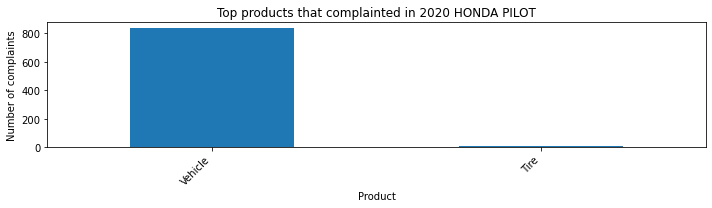

Top components that complainted in 2020 HONDA PILOT
ELECTRICAL SYSTEM                     170
ENGINE                                 70
UNKNOWN OR OTHER                       70
FORWARD COLLISION AVOIDANCE            42
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     40
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


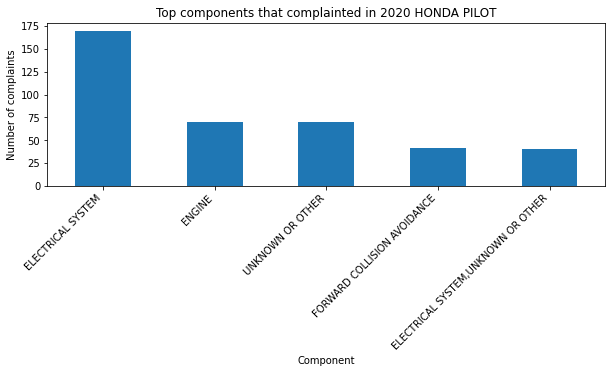

Top products that complainted in 2020 HONDA CR-V
Vehicle    546
Tire         6
Name: products_type, dtype: int64



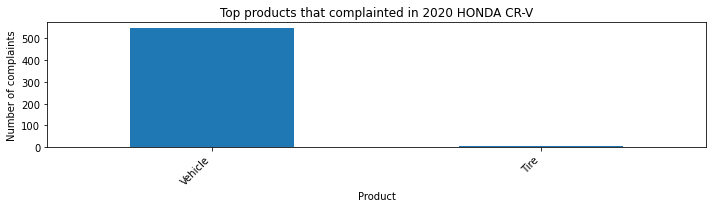

Top components that complainted in 2020 HONDA CR-V
FORWARD COLLISION AVOIDANCE    100
AIR BAGS                        76
STEERING                        44
UNKNOWN OR OTHER                42
ELECTRICAL SYSTEM               34
Name: components, dtype: int64



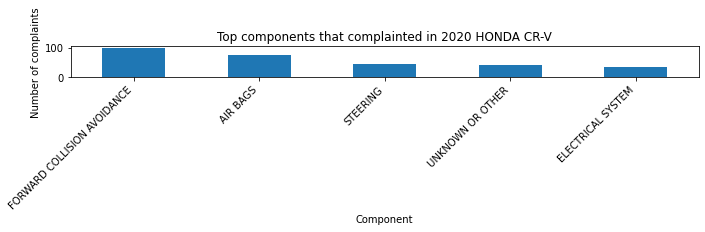

Top products that complainted in 2020 HONDA CIVIC SI
Vehicle      390
Tire           4
Equipment      2
Name: products_type, dtype: int64



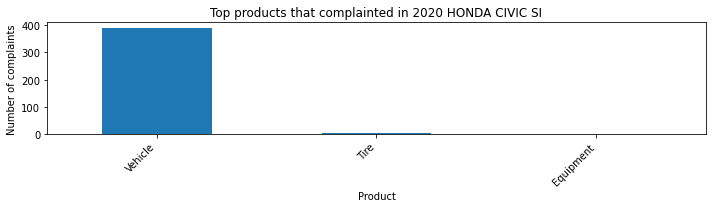

Top components that complainted in 2020 HONDA CIVIC SI
AIR BAGS             42
POWER TRAIN          40
STEERING             38
UNKNOWN OR OTHER     36
ELECTRICAL SYSTEM    30
Name: components, dtype: int64



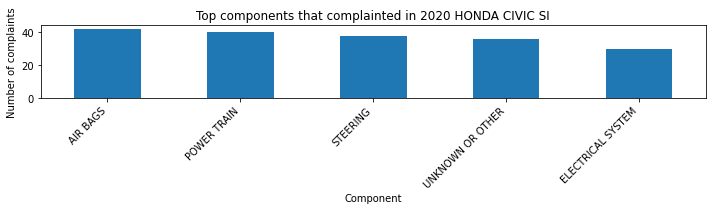

Top products that complainted in 2020 HONDA CIVIC
Vehicle      384
Tire           4
Equipment      2
Name: products_type, dtype: int64



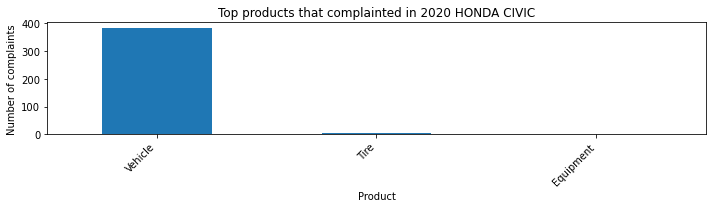

Top components that complainted in 2020 HONDA CIVIC
AIR BAGS             40
STEERING             38
POWER TRAIN          38
UNKNOWN OR OTHER     36
ELECTRICAL SYSTEM    30
Name: components, dtype: int64



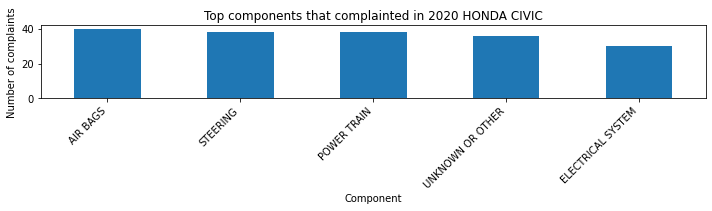

Top products that complainted in 2020 HONDA ODYSSEY
Vehicle    308
Name: products_type, dtype: int64



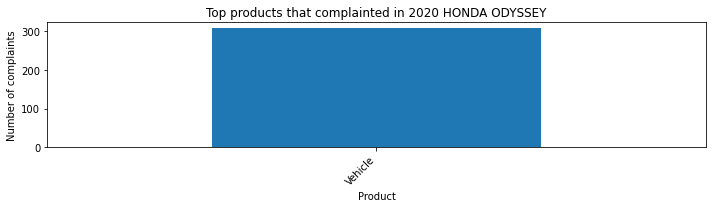

Top components that complainted in 2020 HONDA ODYSSEY
FORWARD COLLISION AVOIDANCE,LANE DEPARTURE    38
ELECTRICAL SYSTEM                             29
UNKNOWN OR OTHER                              25
ENGINE                                        16
LANE DEPARTURE,FORWARD COLLISION AVOIDANCE    15
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


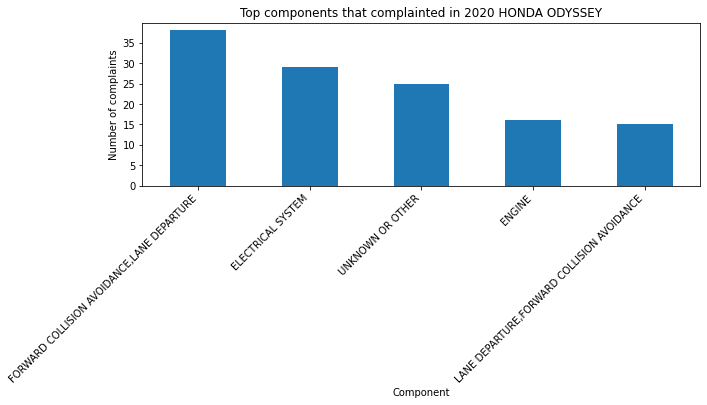

Top products that complainted in 2020 HONDA RIDGELINE
Vehicle    304
Name: products_type, dtype: int64



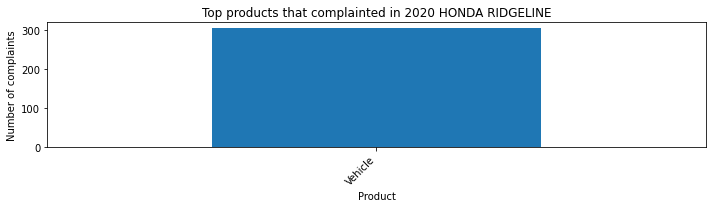

Top components that complainted in 2020 HONDA RIDGELINE
UNKNOWN OR OTHER        54
ELECTRICAL SYSTEM       48
ENGINE                  36
EXTERIOR LIGHTING       20
BACK OVER PREVENTION    12
Name: components, dtype: int64



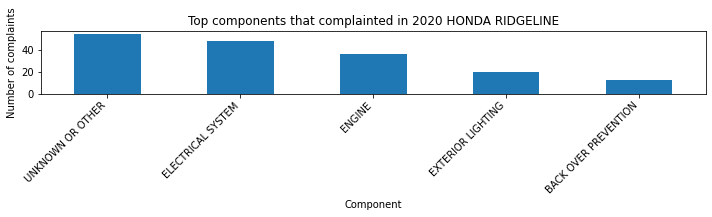

Top products that complainted in 2020 HONDA ACCORD
Vehicle       271
Tire            1
Child Seat      1
Name: products_type, dtype: int64



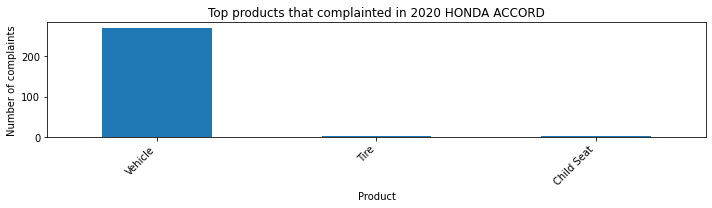

Top components that complainted in 2020 HONDA ACCORD
FORWARD COLLISION AVOIDANCE    46
AIR BAGS                       21
ENGINE                         18
SERVICE BRAKES                 17
UNKNOWN OR OTHER               14
Name: components, dtype: int64



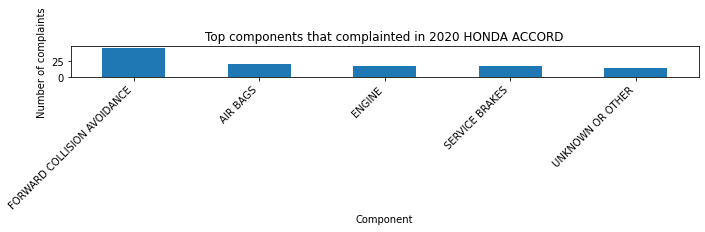

Top products that complainted in 2020 HONDA CIVIC HATCH
Vehicle      192
Tire           2
Equipment      1
Name: products_type, dtype: int64



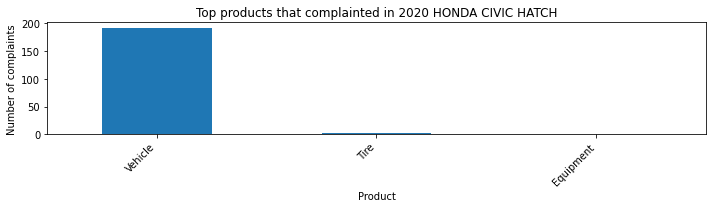

Top components that complainted in 2020 HONDA CIVIC HATCH
AIR BAGS             20
STEERING             19
POWER TRAIN          19
UNKNOWN OR OTHER     18
ELECTRICAL SYSTEM    15
Name: components, dtype: int64



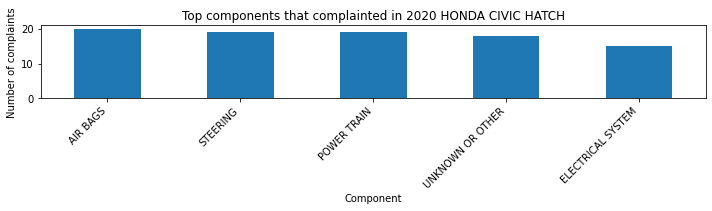

Top products that complainted in 2020 HONDA CIVIC HATCH TYPE-R
Vehicle      192
Tire           2
Equipment      1
Name: products_type, dtype: int64



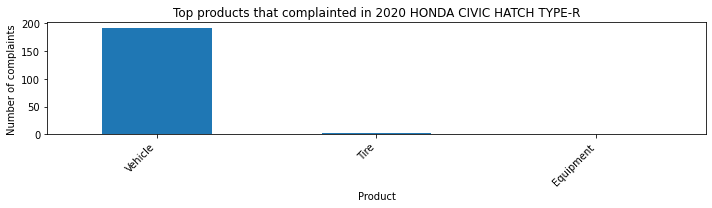

Top components that complainted in 2020 HONDA CIVIC HATCH TYPE-R
AIR BAGS             20
STEERING             19
POWER TRAIN          19
UNKNOWN OR OTHER     18
ELECTRICAL SYSTEM    15
Name: components, dtype: int64



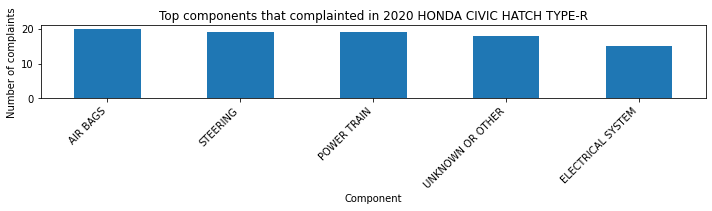

Top products that complainted in 2020 HONDA PASSPORT
Vehicle    154
Tire         2
Name: products_type, dtype: int64



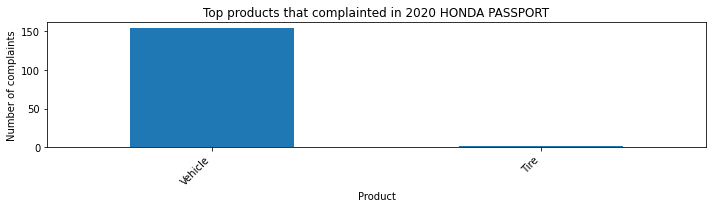

Top components that complainted in 2020 HONDA PASSPORT
FORWARD COLLISION AVOIDANCE    30
ELECTRICAL SYSTEM              24
UNKNOWN OR OTHER               16
ENGINE                         10
ELECTRICAL SYSTEM,ENGINE        8
Name: components, dtype: int64



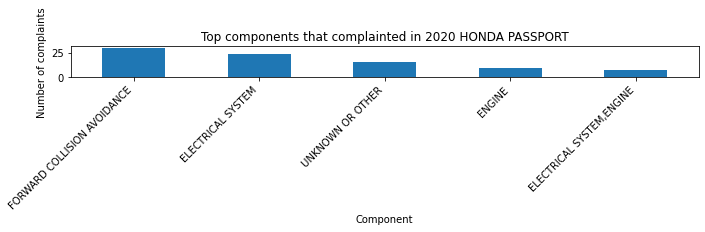

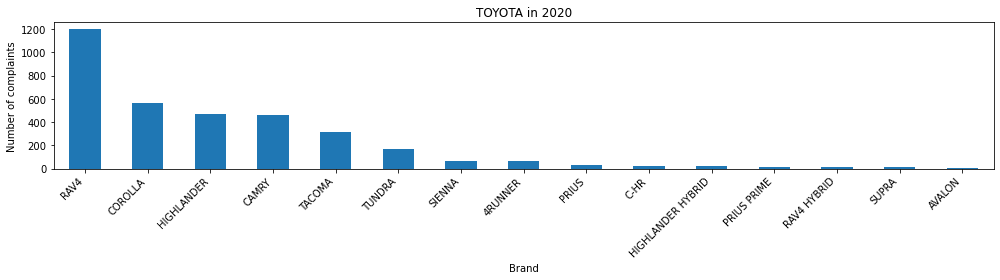

Top 10 models of TOYOTA by number of complaints:
RAV4          1198
COROLLA        568
HIGHLANDER     474
CAMRY          462
TACOMA         312
TUNDRA         168
SIENNA          64
4RUNNER         62
PRIUS           32
C-HR            25
Name: model, dtype: int64

Top products that complainted in 2020 TOYOTA RAV4
Vehicle       1192
Child Seat       2
Equipment        2
Tire             2
Name: products_type, dtype: int64



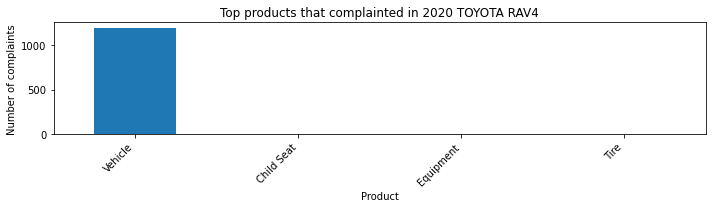

Top components that complainted in 2020 TOYOTA RAV4
ENGINE                    234
FUEL/PROPULSION SYSTEM    156
UNKNOWN OR OTHER          134
ELECTRICAL SYSTEM         120
AIR BAGS                   74
Name: components, dtype: int64



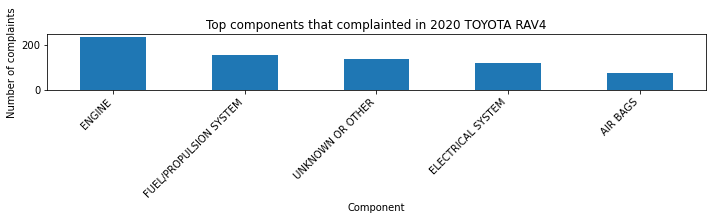

Top products that complainted in 2020 TOYOTA COROLLA
Vehicle       562
Tire            4
Child Seat      2
Name: products_type, dtype: int64



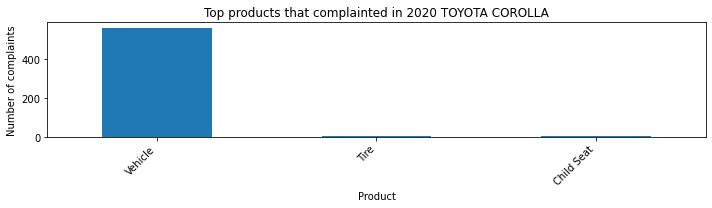

Top components that complainted in 2020 TOYOTA COROLLA
ENGINE              160
UNKNOWN OR OTHER    104
POWER TRAIN          30
AIR BAGS             26
VISIBILITY/WIPER     20
Name: components, dtype: int64



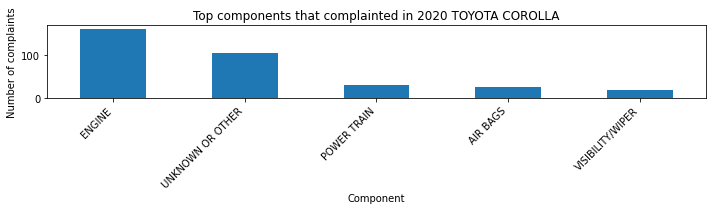

Top products that complainted in 2020 TOYOTA HIGHLANDER
Vehicle      470
Tire           2
Equipment      2
Name: products_type, dtype: int64



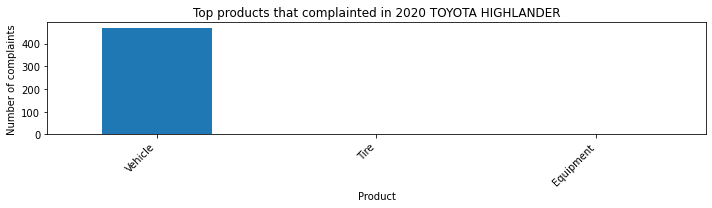

Top components that complainted in 2020 TOYOTA HIGHLANDER
POWER TRAIN         142
AIR BAGS             54
UNKNOWN OR OTHER     42
STRUCTURE            42
SERVICE BRAKES       38
Name: components, dtype: int64



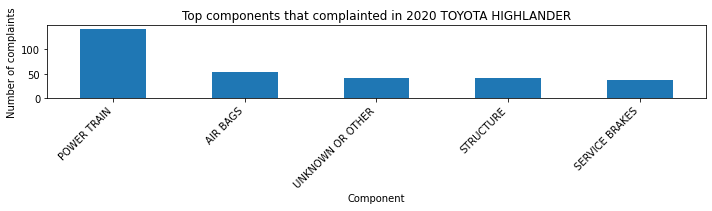

Top products that complainted in 2020 TOYOTA CAMRY
Vehicle       456
Tire            4
Child Seat      2
Name: products_type, dtype: int64



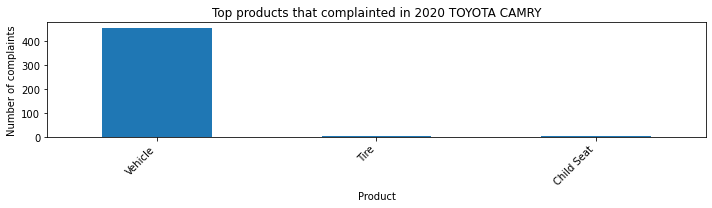

Top components that complainted in 2020 TOYOTA CAMRY
ELECTRICAL SYSTEM         76
AIR BAGS                  70
ENGINE                    38
UNKNOWN OR OTHER          30
FUEL/PROPULSION SYSTEM    30
Name: components, dtype: int64



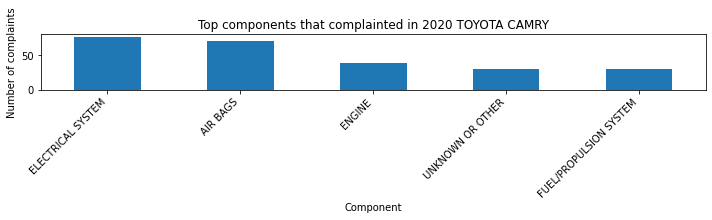

Top products that complainted in 2020 TOYOTA TACOMA
Vehicle    304
Tire         8
Name: products_type, dtype: int64



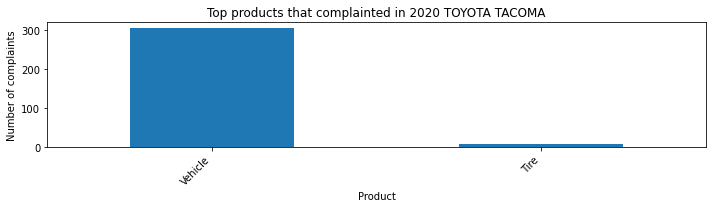

Top components that complainted in 2020 TOYOTA TACOMA
FUEL/PROPULSION SYSTEM    56
SERVICE BRAKES            40
ENGINE                    16
ELECTRICAL SYSTEM         16
UNKNOWN OR OTHER          16
Name: components, dtype: int64



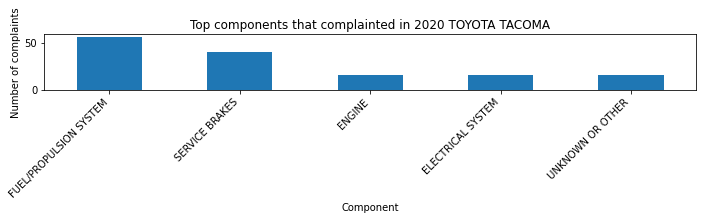

Top products that complainted in 2020 TOYOTA TUNDRA
Vehicle    168
Name: products_type, dtype: int64



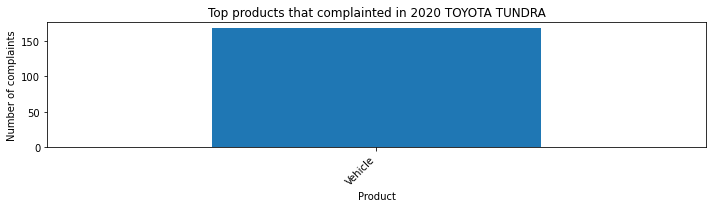

Top components that complainted in 2020 TOYOTA TUNDRA
UNKNOWN OR OTHER          24
FUEL/PROPULSION SYSTEM    20
ENGINE                    16
SERVICE BRAKES            16
STRUCTURE                 12
Name: components, dtype: int64



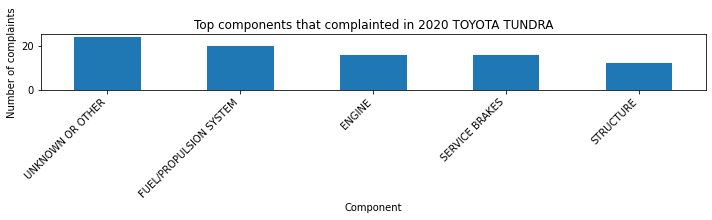

Top products that complainted in 2020 TOYOTA SIENNA
Vehicle    64
Name: products_type, dtype: int64



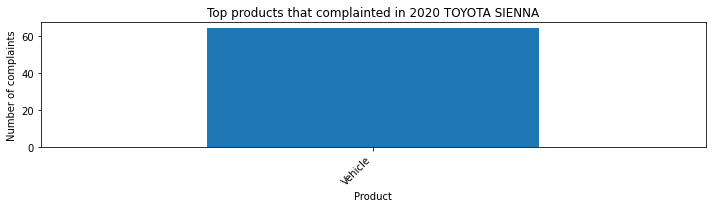

Top components that complainted in 2020 TOYOTA SIENNA
FUEL/PROPULSION SYSTEM    8
POWER TRAIN               8
UNKNOWN OR OTHER          6
STRUCTURE                 6
ELECTRICAL SYSTEM         6
Name: components, dtype: int64



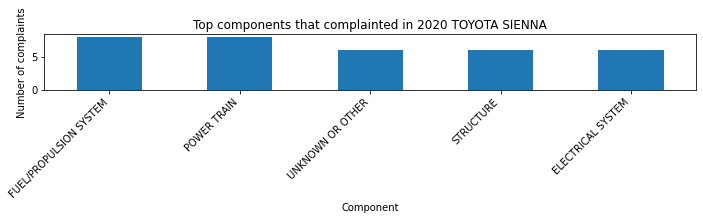

Top products that complainted in 2020 TOYOTA 4RUNNER
Vehicle       60
Child Seat     2
Name: products_type, dtype: int64



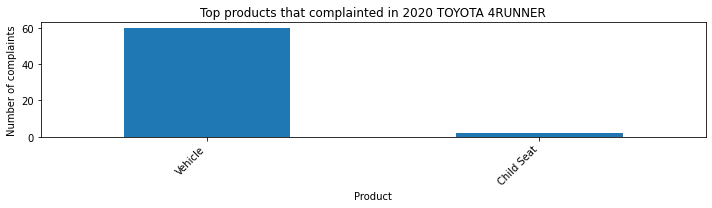

Top components that complainted in 2020 TOYOTA 4RUNNER
UNKNOWN OR OTHER               12
SERVICE BRAKES                  8
SUSPENSION                      6
STEERING                        6
Chest Clip, Buckle, Harness     4
Name: components, dtype: int64



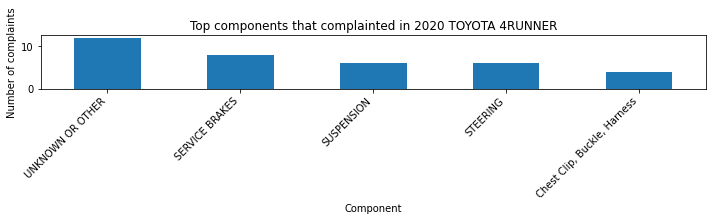

Top products that complainted in 2020 TOYOTA PRIUS
Vehicle    28
Tire        4
Name: products_type, dtype: int64



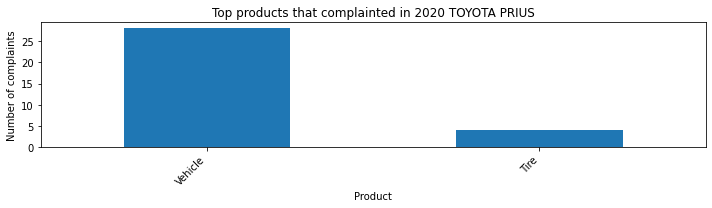

Top components that complainted in 2020 TOYOTA PRIUS
TIRES                                                    8
UNKNOWN OR OTHER                                         4
UNKNOWN OR OTHER,SERVICE BRAKES                          2
AIR BAGS,UNKNOWN OR OTHER,FORWARD COLLISION AVOIDANCE    2
BACK OVER PREVENTION                                     2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


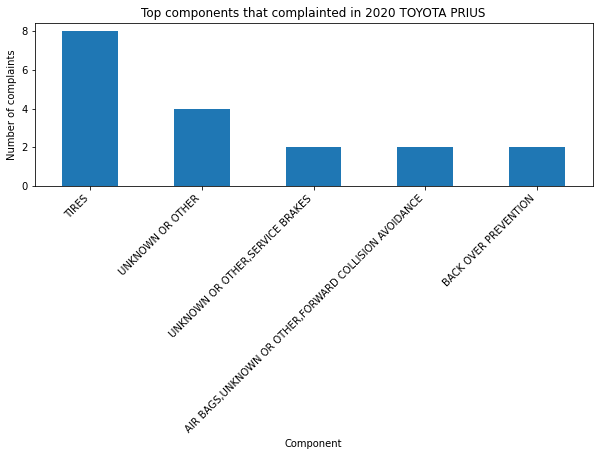

Top products that complainted in 2020 TOYOTA C-HR
Vehicle    24
Tire        1
Name: products_type, dtype: int64



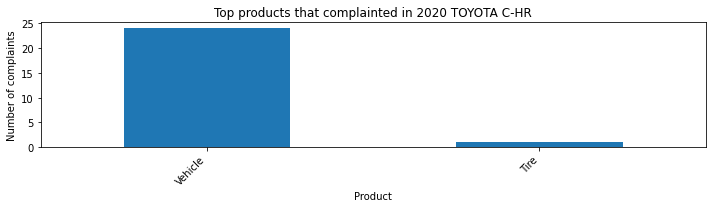

Top components that complainted in 2020 TOYOTA C-HR
POWER TRAIN                                           14
TIRES                                                  2
FUEL/PROPULSION SYSTEM,FORWARD COLLISION AVOIDANCE     1
POWER TRAIN,SERVICE BRAKES                             1
POWER TRAIN,VEHICLE SPEED CONTROL                      1
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


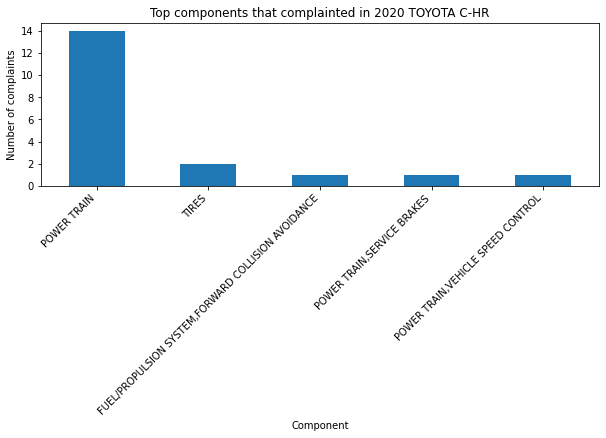


===================== Data Analysis for 2021 =====================


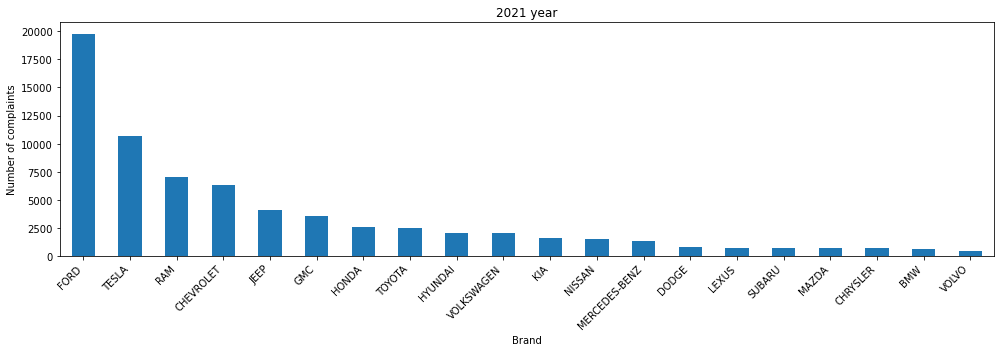

Top 5 Brands with the Most Complaints in 2021:
FORD         19779
TESLA        10641
RAM           7066
CHEVROLET     6378
JEEP          4131
Name: make, dtype: int64


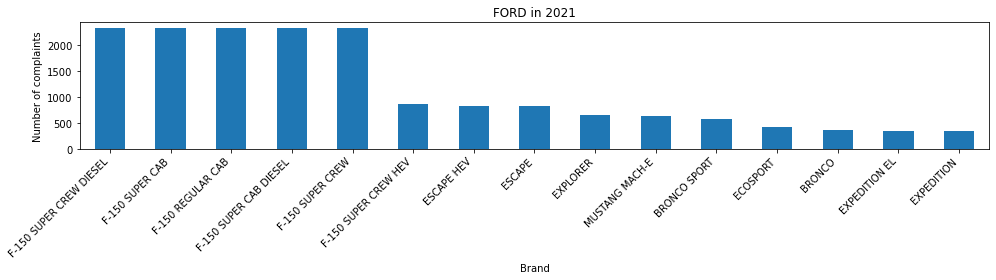

Top 10 models of FORD by number of complaints:
F-150 SUPER CREW DIESEL    2318
F-150 SUPER CAB            2318
F-150 REGULAR CAB          2318
F-150 SUPER CAB DIESEL     2318
F-150 SUPER CREW           2318
F-150 SUPER CREW HEV        874
ESCAPE HEV                  824
ESCAPE                      824
EXPLORER                    656
MUSTANG MACH-E              626
Name: model, dtype: int64

Top products that complainted in 2021 FORD F-150 SUPER CREW DIESEL
Vehicle       2312
Tire             4
Child Seat       2
Name: products_type, dtype: int64



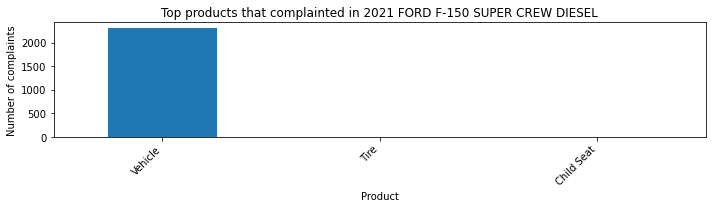

Top components that complainted in 2021 FORD F-150 SUPER CREW DIESEL
POWER TRAIN          562
ELECTRICAL SYSTEM    166
VISIBILITY           146
UNKNOWN OR OTHER     128
EXTERIOR LIGHTING    114
Name: components, dtype: int64



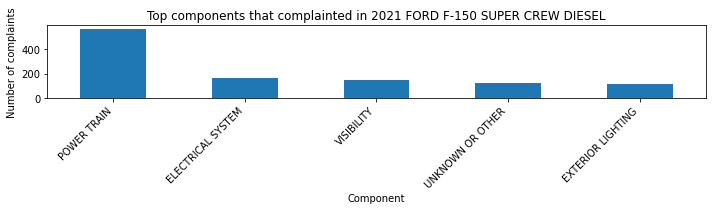

Top products that complainted in 2021 FORD F-150 SUPER CAB
Vehicle       2312
Tire             4
Child Seat       2
Name: products_type, dtype: int64



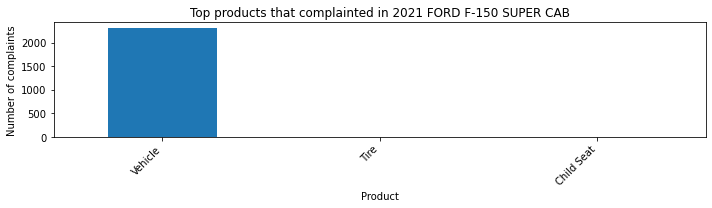

Top components that complainted in 2021 FORD F-150 SUPER CAB
POWER TRAIN          562
ELECTRICAL SYSTEM    166
VISIBILITY           146
UNKNOWN OR OTHER     128
EXTERIOR LIGHTING    114
Name: components, dtype: int64



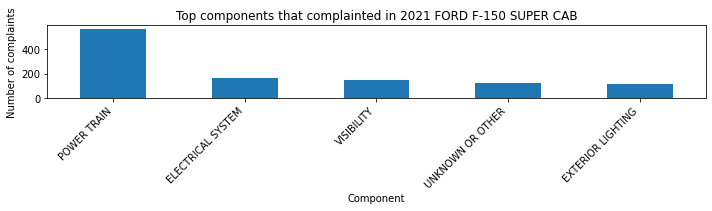

Top products that complainted in 2021 FORD F-150 REGULAR CAB
Vehicle       2312
Tire             4
Child Seat       2
Name: products_type, dtype: int64



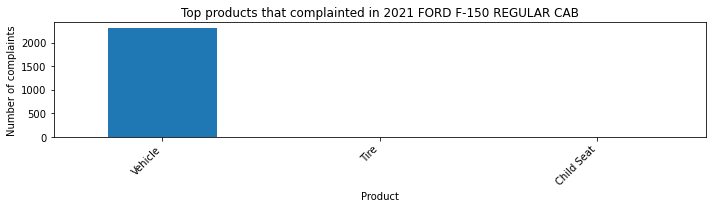

Top components that complainted in 2021 FORD F-150 REGULAR CAB
POWER TRAIN          562
ELECTRICAL SYSTEM    166
VISIBILITY           146
UNKNOWN OR OTHER     128
EXTERIOR LIGHTING    114
Name: components, dtype: int64



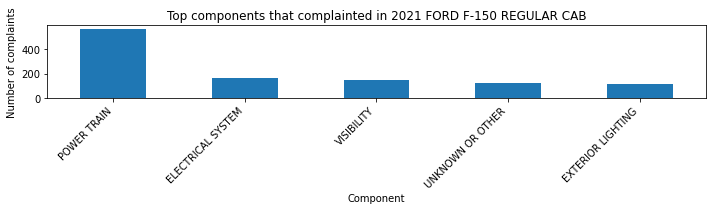

Top products that complainted in 2021 FORD F-150 SUPER CAB DIESEL
Vehicle       2312
Tire             4
Child Seat       2
Name: products_type, dtype: int64



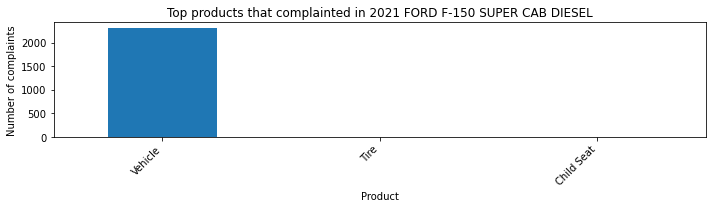

Top components that complainted in 2021 FORD F-150 SUPER CAB DIESEL
POWER TRAIN          562
ELECTRICAL SYSTEM    166
VISIBILITY           146
UNKNOWN OR OTHER     128
EXTERIOR LIGHTING    114
Name: components, dtype: int64



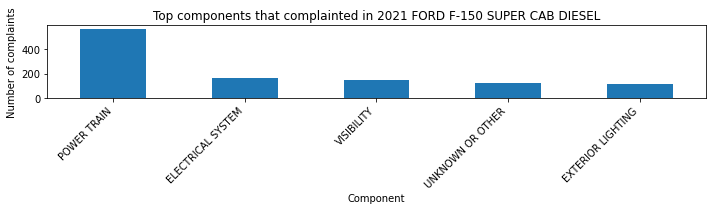

Top products that complainted in 2021 FORD F-150 SUPER CREW
Vehicle       2312
Tire             4
Child Seat       2
Name: products_type, dtype: int64



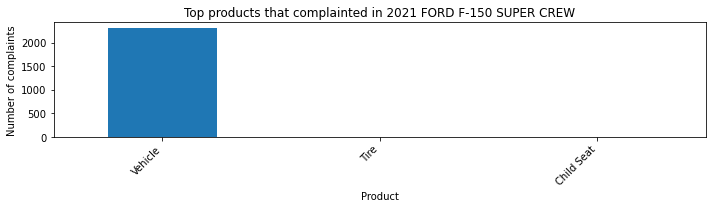

Top components that complainted in 2021 FORD F-150 SUPER CREW
POWER TRAIN          562
ELECTRICAL SYSTEM    166
VISIBILITY           146
UNKNOWN OR OTHER     128
EXTERIOR LIGHTING    114
Name: components, dtype: int64



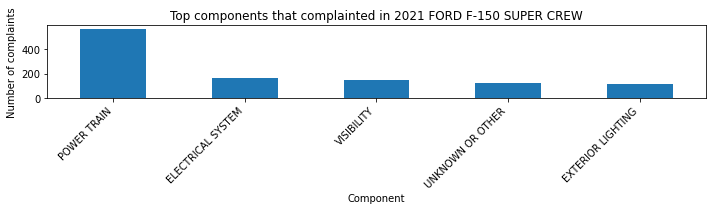

Top products that complainted in 2021 FORD F-150 SUPER CREW HEV
Vehicle    874
Name: products_type, dtype: int64



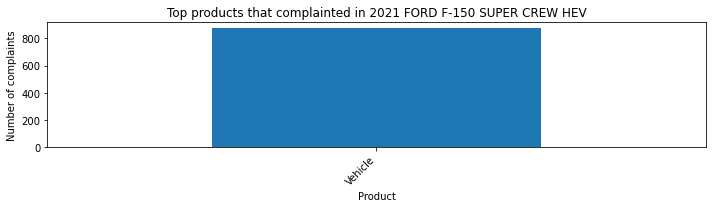

Top components that complainted in 2021 FORD F-150 SUPER CREW HEV
POWER TRAIN           288
ELECTRICAL SYSTEM      74
WHEELS                 52
UNKNOWN OR OTHER       38
POWER TRAIN,WHEELS     30
Name: components, dtype: int64



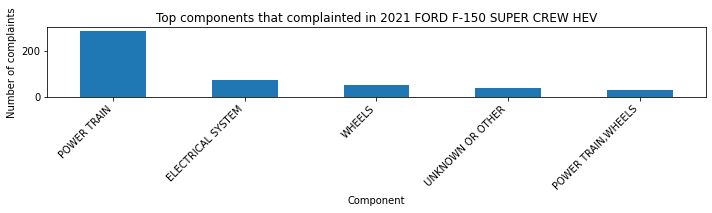

Top products that complainted in 2021 FORD ESCAPE HEV
Vehicle    824
Name: products_type, dtype: int64



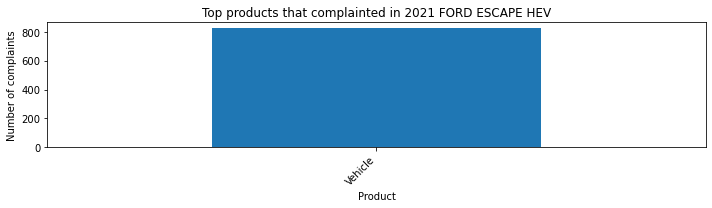

Top components that complainted in 2021 FORD ESCAPE HEV
STRUCTURE                194
ENGINE                   122
UNKNOWN OR OTHER          88
SERVICE BRAKES            62
FUEL SYSTEM, GASOLINE     38
Name: components, dtype: int64



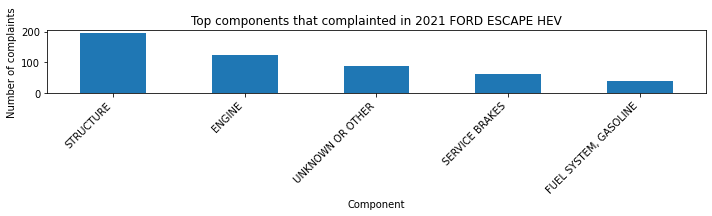

Top products that complainted in 2021 FORD ESCAPE
Vehicle    824
Name: products_type, dtype: int64



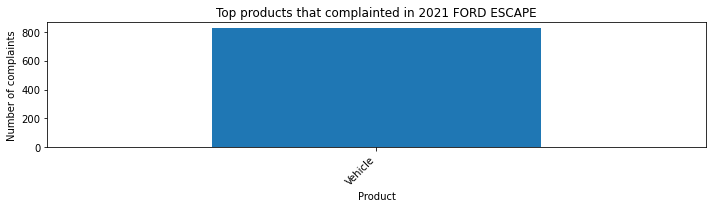

Top components that complainted in 2021 FORD ESCAPE
STRUCTURE                194
ENGINE                   122
UNKNOWN OR OTHER          88
SERVICE BRAKES            62
FUEL SYSTEM, GASOLINE     38
Name: components, dtype: int64



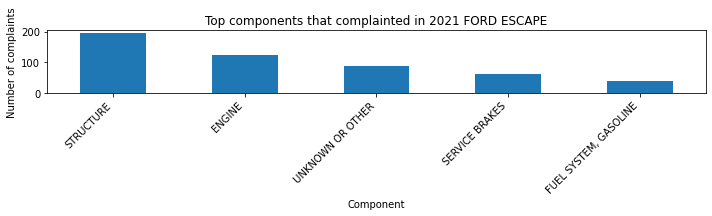

Top products that complainted in 2021 FORD EXPLORER
Vehicle       652
Child Seat      4
Name: products_type, dtype: int64



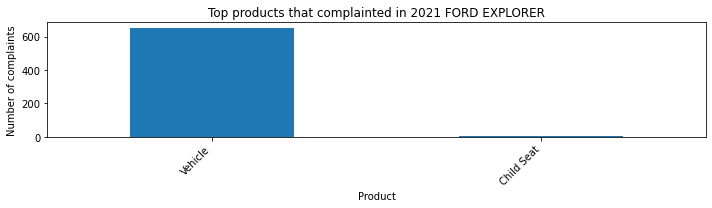

Top components that complainted in 2021 FORD EXPLORER
POWER TRAIN             134
UNKNOWN OR OTHER         82
BACK OVER PREVENTION     44
ELECTRICAL SYSTEM        28
STRUCTURE                28
Name: components, dtype: int64



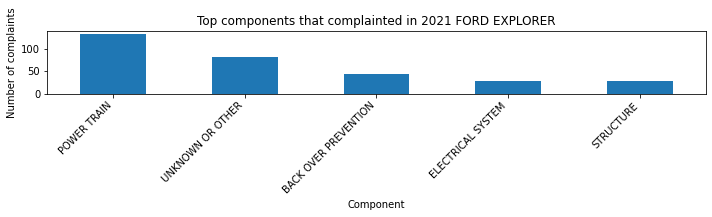

Top products that complainted in 2021 FORD MUSTANG MACH-E
Vehicle    626
Name: products_type, dtype: int64



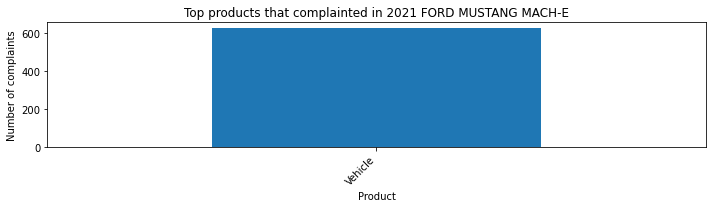

Top components that complainted in 2021 FORD MUSTANG MACH-E
ELECTRICAL SYSTEM                             98
FORWARD COLLISION AVOIDANCE                   62
UNKNOWN OR OTHER                              46
FORWARD COLLISION AVOIDANCE,LANE DEPARTURE    30
SERVICE BRAKES                                26
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


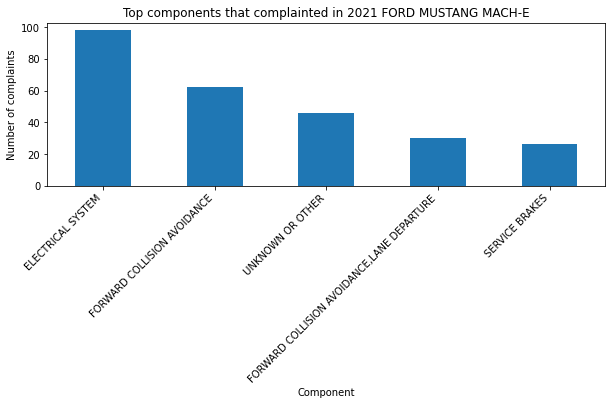

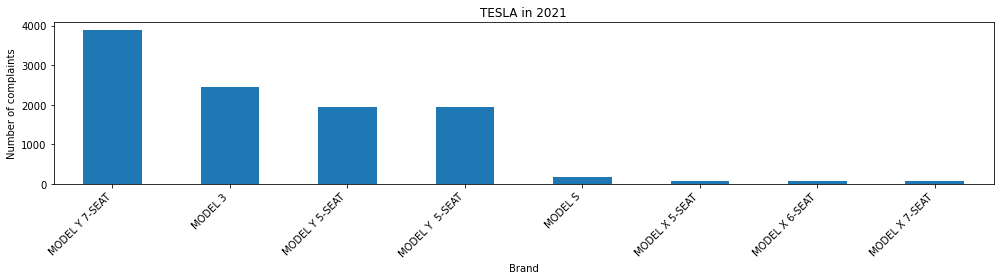

Top 10 models of TESLA by number of complaints:
MODEL Y 7-SEAT     3888
MODEL 3            2460
MODEL Y 5-SEAT     1944
MODEL Y  5-SEAT    1944
MODEL S             177
MODEL X 5-SEAT       76
MODEL X 6-SEAT       76
MODEL X 7-SEAT       76
Name: model, dtype: int64

Top products that complainted in 2021 TESLA MODEL Y 7-SEAT
Vehicle       3864
Tire            16
Child Seat       8
Name: products_type, dtype: int64



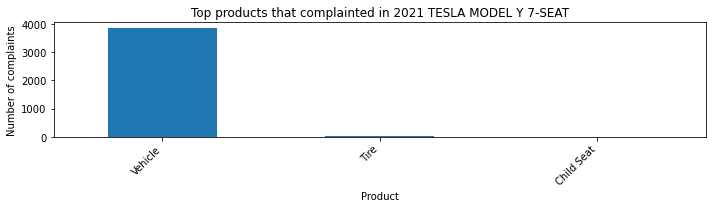

Top components that complainted in 2021 TESLA MODEL Y 7-SEAT
FORWARD COLLISION AVOIDANCE                                         1108
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE                    284
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE                           272
UNKNOWN OR OTHER                                                     236
VEHICLE SPEED CONTROL,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     176
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


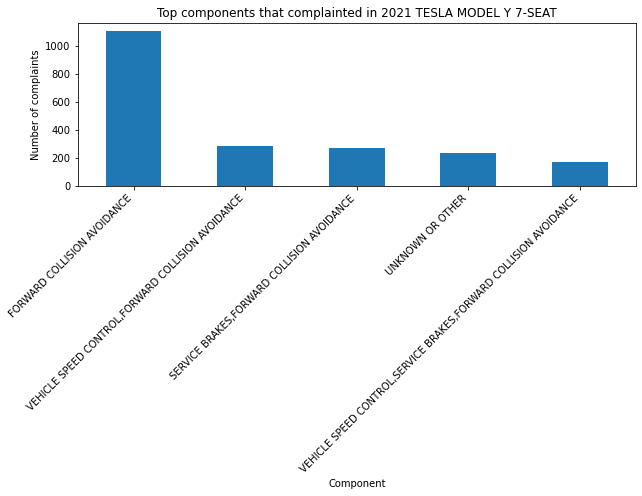

Top products that complainted in 2021 TESLA MODEL 3
Vehicle    2452
Tire          8
Name: products_type, dtype: int64



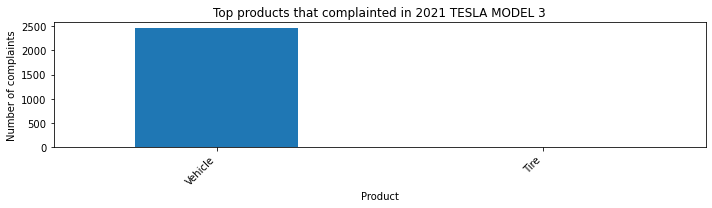

Top components that complainted in 2021 TESLA MODEL 3
FORWARD COLLISION AVOIDANCE                                         788
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE                          228
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE                   208
UNKNOWN OR OTHER                                                    152
VEHICLE SPEED CONTROL,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE    128
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


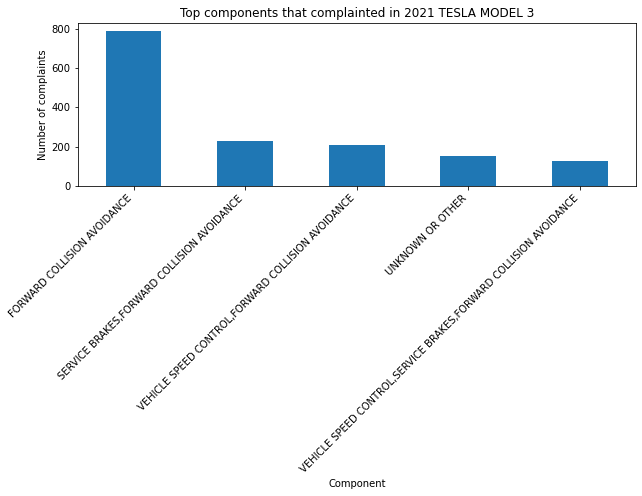

Top products that complainted in 2021 TESLA MODEL Y 5-SEAT
Vehicle       1932
Tire             8
Child Seat       4
Name: products_type, dtype: int64



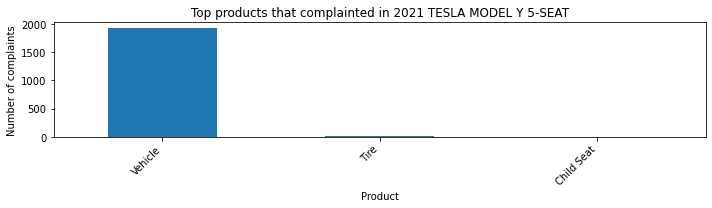

Top components that complainted in 2021 TESLA MODEL Y 5-SEAT
FORWARD COLLISION AVOIDANCE                                         554
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE                   142
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE                          136
UNKNOWN OR OTHER                                                    118
VEHICLE SPEED CONTROL,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     88
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


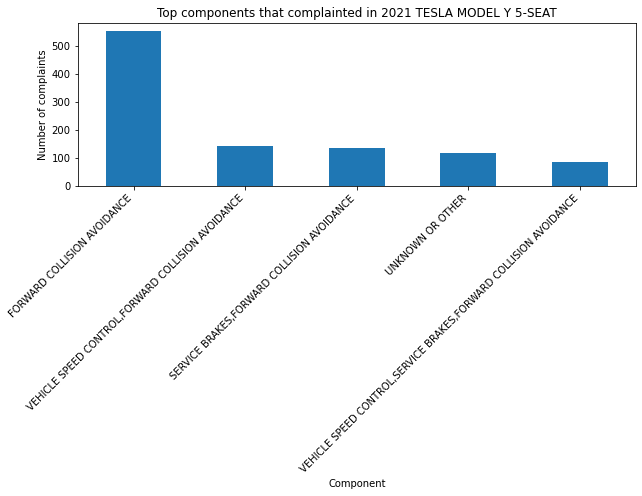

Top products that complainted in 2021 TESLA MODEL Y  5-SEAT
Vehicle       1932
Tire             8
Child Seat       4
Name: products_type, dtype: int64



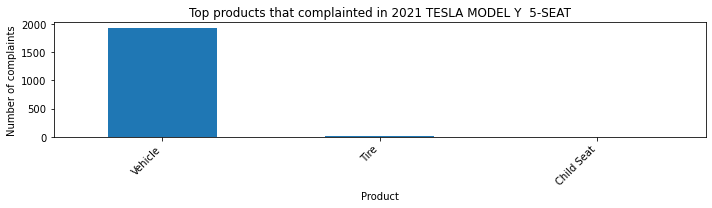

Top components that complainted in 2021 TESLA MODEL Y  5-SEAT
FORWARD COLLISION AVOIDANCE                                         554
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE                   142
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE                          136
UNKNOWN OR OTHER                                                    118
VEHICLE SPEED CONTROL,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     88
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


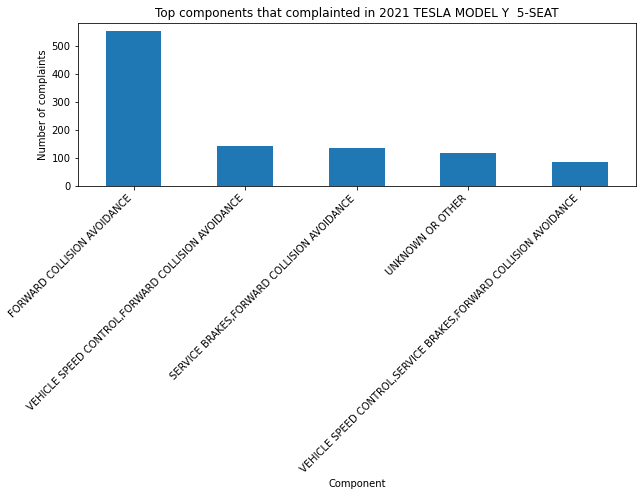

Top products that complainted in 2021 TESLA MODEL S
Vehicle    168
Tire         9
Name: products_type, dtype: int64



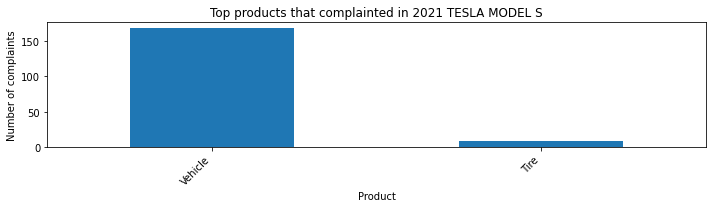

Top components that complainted in 2021 TESLA MODEL S
UNKNOWN OR OTHER               23
TIRES                          18
STEERING                       17
FORWARD COLLISION AVOIDANCE    14
ELECTRICAL SYSTEM               9
Name: components, dtype: int64



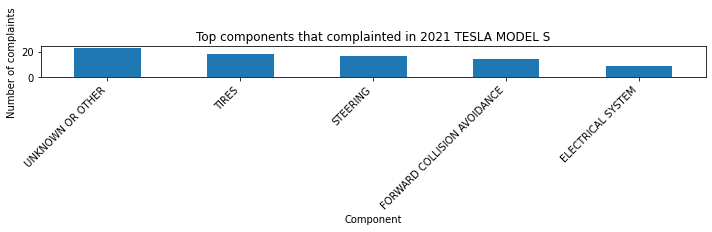

Top products that complainted in 2021 TESLA MODEL X 5-SEAT
Vehicle    76
Name: products_type, dtype: int64



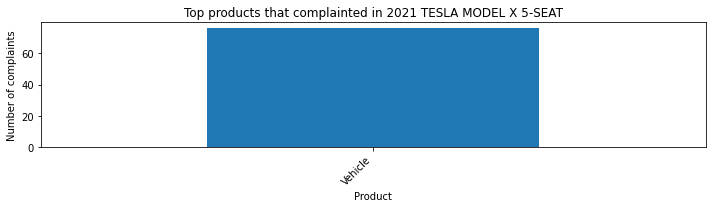

Top components that complainted in 2021 TESLA MODEL X 5-SEAT
STEERING                   16
UNKNOWN OR OTHER           12
SUSPENSION                  8
STEERING,LANE DEPARTURE     6
ELECTRICAL SYSTEM           4
Name: components, dtype: int64



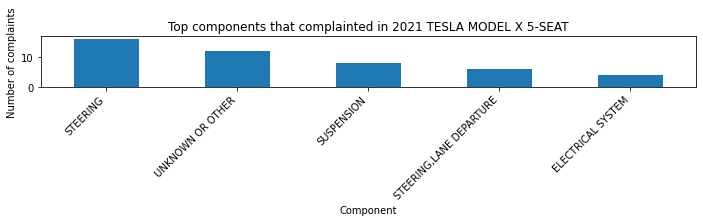

Top products that complainted in 2021 TESLA MODEL X 6-SEAT
Vehicle    76
Name: products_type, dtype: int64



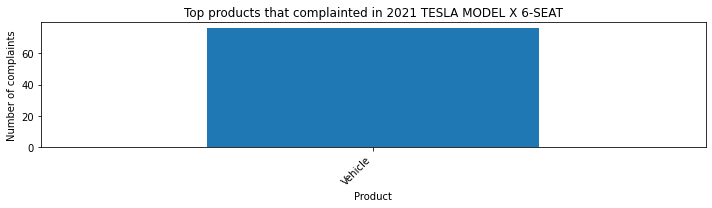

Top components that complainted in 2021 TESLA MODEL X 6-SEAT
STEERING                   16
UNKNOWN OR OTHER           12
SUSPENSION                  8
STEERING,LANE DEPARTURE     6
ELECTRICAL SYSTEM           4
Name: components, dtype: int64



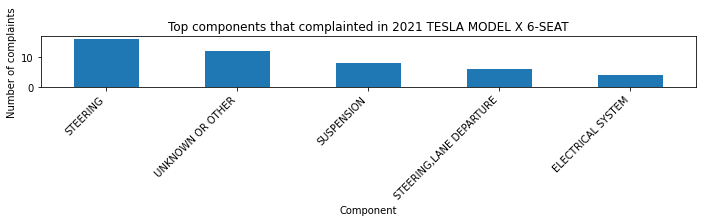

Top products that complainted in 2021 TESLA MODEL X 7-SEAT
Vehicle    76
Name: products_type, dtype: int64



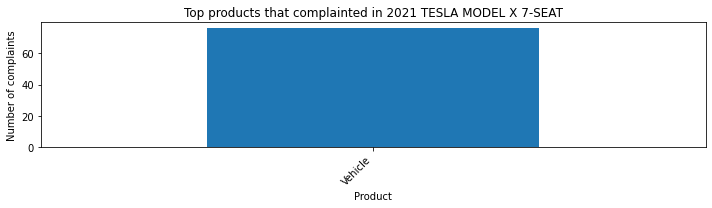

Top components that complainted in 2021 TESLA MODEL X 7-SEAT
STEERING                   16
UNKNOWN OR OTHER           12
SUSPENSION                  8
STEERING,LANE DEPARTURE     6
ELECTRICAL SYSTEM           4
Name: components, dtype: int64



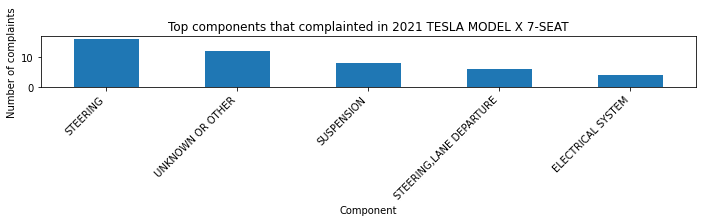

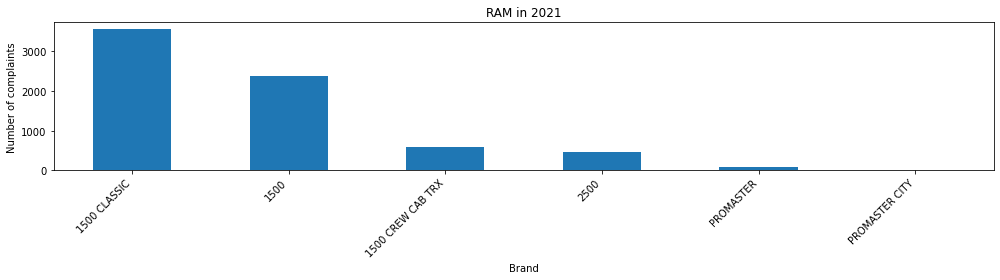

Top 10 models of RAM by number of complaints:
1500 CLASSIC         3552
1500                 2368
1500 CREW CAB TRX     592
2500                  470
PROMASTER              78
PROMASTER CITY          6
Name: model, dtype: int64

Top products that complainted in 2021 RAM 1500 CLASSIC
Vehicle      3540
Equipment       6
Tire            6
Name: products_type, dtype: int64



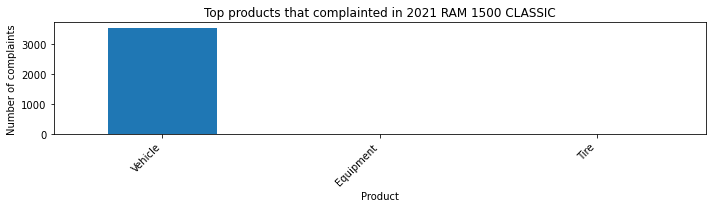

Top components that complainted in 2021 RAM 1500 CLASSIC
ENGINE                      444
UNKNOWN OR OTHER            264
ELECTRICAL SYSTEM           234
POWER TRAIN                 234
ELECTRICAL SYSTEM,ENGINE    192
Name: components, dtype: int64



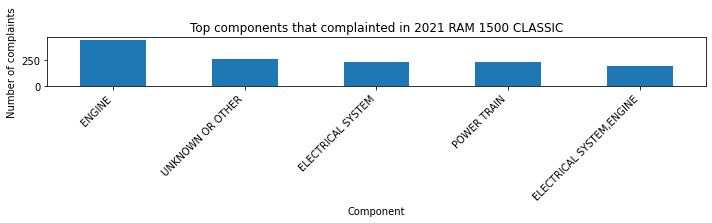

Top products that complainted in 2021 RAM 1500
Vehicle      2360
Equipment       4
Tire            4
Name: products_type, dtype: int64



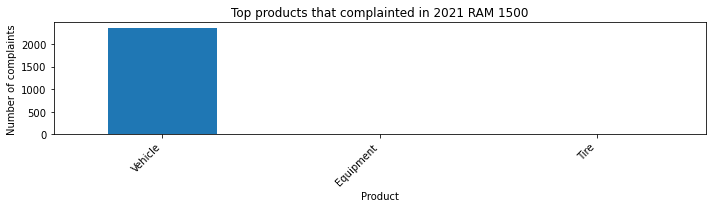

Top components that complainted in 2021 RAM 1500
ENGINE                      296
UNKNOWN OR OTHER            176
ELECTRICAL SYSTEM           156
POWER TRAIN                 156
ELECTRICAL SYSTEM,ENGINE    128
Name: components, dtype: int64



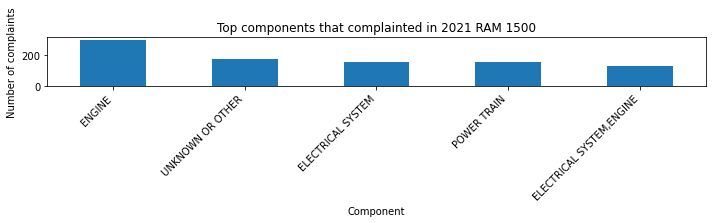

Top products that complainted in 2021 RAM 1500 CREW CAB TRX
Vehicle      590
Equipment      1
Tire           1
Name: products_type, dtype: int64



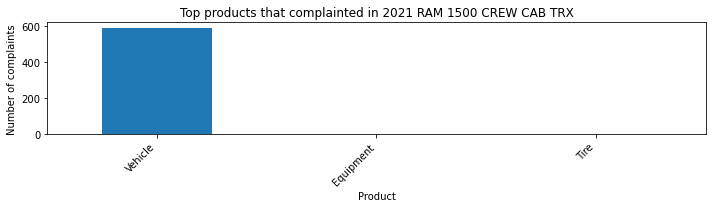

Top components that complainted in 2021 RAM 1500 CREW CAB TRX
ENGINE                      74
UNKNOWN OR OTHER            44
ELECTRICAL SYSTEM           39
POWER TRAIN                 39
ELECTRICAL SYSTEM,ENGINE    32
Name: components, dtype: int64



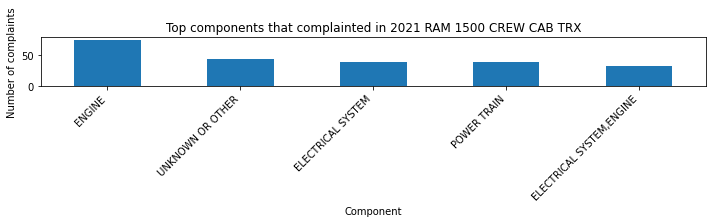

Top products that complainted in 2021 RAM 2500
Vehicle      465
Equipment      5
Name: products_type, dtype: int64



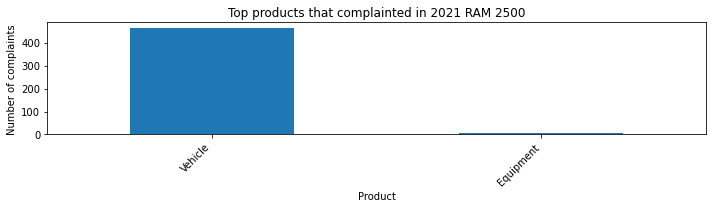

Top components that complainted in 2021 RAM 2500
ELECTRICAL SYSTEM                60
POWER TRAIN,ELECTRICAL SYSTEM    45
ENGINE                           45
STRUCTURE                        35
POWER TRAIN                      30
Name: components, dtype: int64



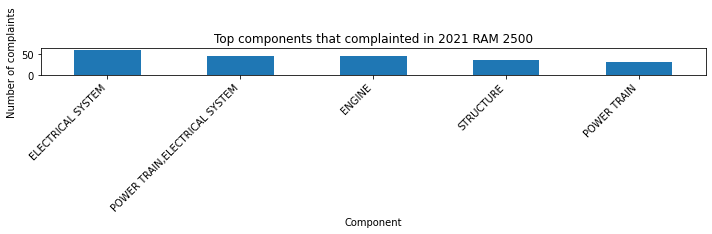

Top products that complainted in 2021 RAM PROMASTER
Vehicle      74
Tire          2
Equipment     2
Name: products_type, dtype: int64



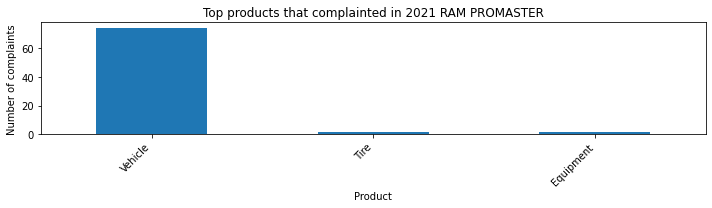

Top components that complainted in 2021 RAM PROMASTER
UNKNOWN OR OTHER    11
LANE DEPARTURE       9
SERVICE BRAKES       7
WHEELS               6
EQUIPMENT            5
Name: components, dtype: int64



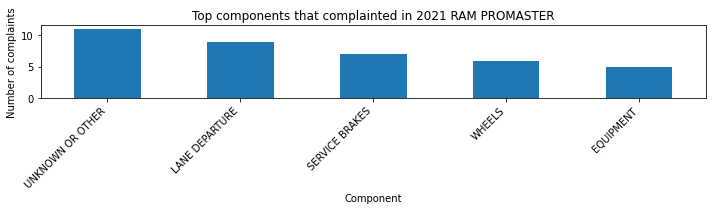

Top products that complainted in 2021 RAM PROMASTER CITY
Vehicle    6
Name: products_type, dtype: int64



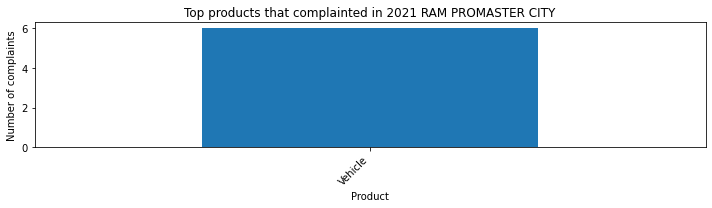

Top components that complainted in 2021 RAM PROMASTER CITY
ENGINE                          3
EQUIPMENT                       2
EXTERIOR LIGHTING,SEAT BELTS    1
Name: components, dtype: int64



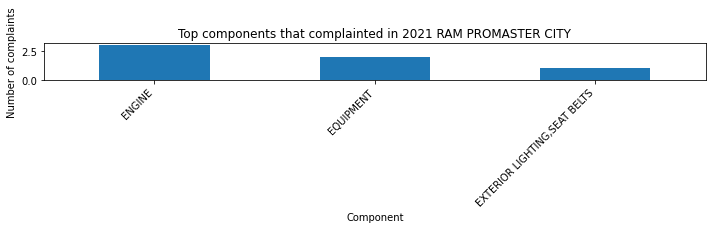

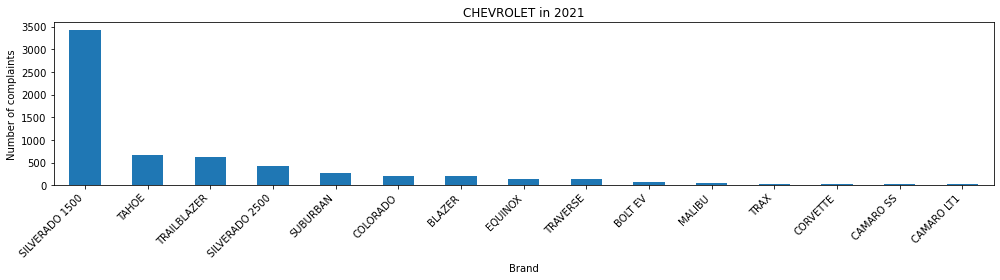

Top 10 models of CHEVROLET by number of complaints:
SILVERADO 1500    3420
TAHOE              656
TRAILBLAZER        616
SILVERADO 2500     420
SUBURBAN           262
COLORADO           212
BLAZER             196
EQUINOX            142
TRAVERSE           140
BOLT EV             64
Name: model, dtype: int64

Top products that complainted in 2021 CHEVROLET SILVERADO 1500
Vehicle      3402
Tire           12
Equipment       6
Name: products_type, dtype: int64



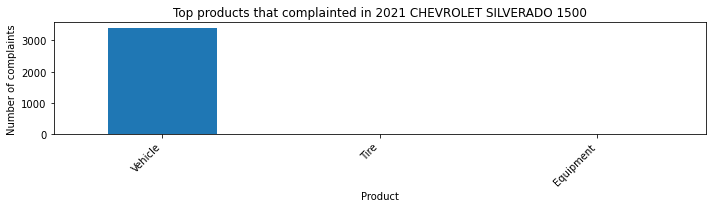

Top components that complainted in 2021 CHEVROLET SILVERADO 1500
ENGINE                       972
POWER TRAIN                  576
ELECTRICAL SYSTEM            180
ENGINE AND ENGINE COOLING    180
POWER TRAIN,ENGINE           162
Name: components, dtype: int64



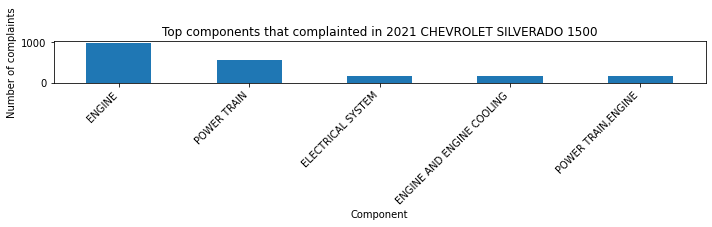

Top products that complainted in 2021 CHEVROLET TAHOE
Vehicle    656
Name: products_type, dtype: int64



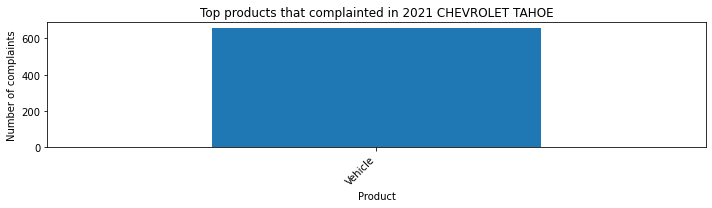

Top components that complainted in 2021 CHEVROLET TAHOE
ENGINE                    110
FUEL/PROPULSION SYSTEM     96
POWER TRAIN                38
UNKNOWN OR OTHER           32
FUEL SYSTEM, GASOLINE      24
Name: components, dtype: int64



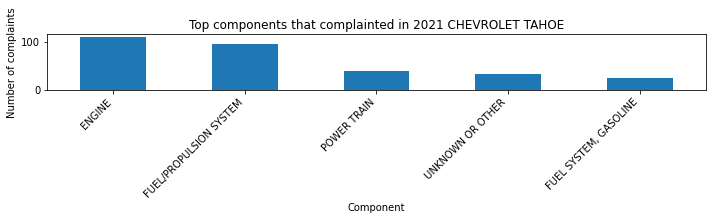

Top products that complainted in 2021 CHEVROLET TRAILBLAZER
Vehicle       600
Child Seat      8
Tire            8
Name: products_type, dtype: int64



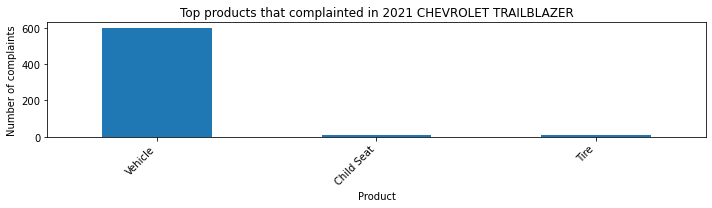

Top components that complainted in 2021 CHEVROLET TRAILBLAZER
UNKNOWN OR OTHER     88
POWER TRAIN          80
SERVICE BRAKES       48
ENGINE               36
ELECTRICAL SYSTEM    36
Name: components, dtype: int64



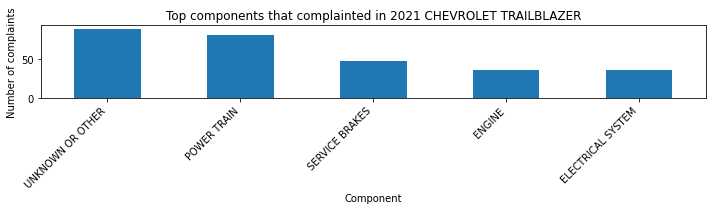

Top products that complainted in 2021 CHEVROLET SILVERADO 2500
Vehicle    414
Tire         6
Name: products_type, dtype: int64



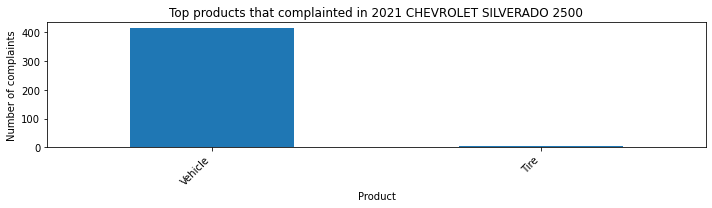

Top components that complainted in 2021 CHEVROLET SILVERADO 2500
POWER TRAIN               102
ELECTRICAL SYSTEM          54
SERVICE BRAKES             48
LATCHES/LOCKS/LINKAGES     36
UNKNOWN OR OTHER           24
Name: components, dtype: int64



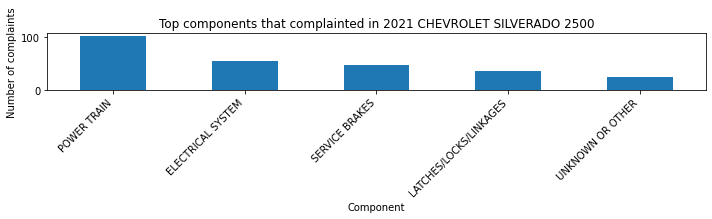

Top products that complainted in 2021 CHEVROLET SUBURBAN
Vehicle    262
Name: products_type, dtype: int64



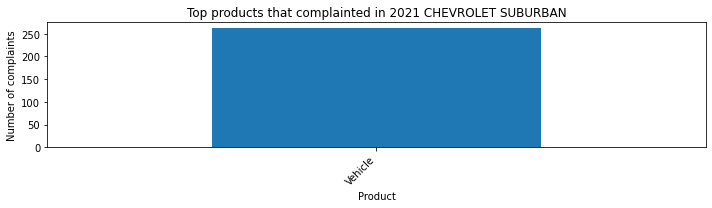

Top components that complainted in 2021 CHEVROLET SUBURBAN
ENGINE                       78
POWER TRAIN                  26
FUEL/PROPULSION SYSTEM       24
EXTERIOR LIGHTING            10
ENGINE AND ENGINE COOLING     8
Name: components, dtype: int64



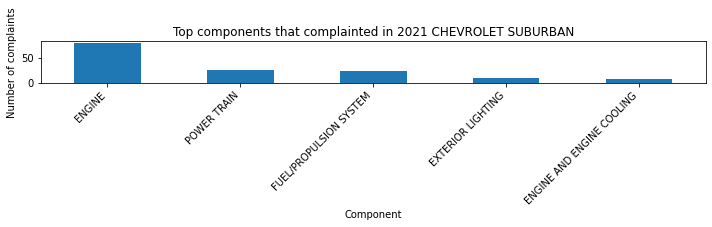

Top products that complainted in 2021 CHEVROLET COLORADO
Vehicle    212
Name: products_type, dtype: int64



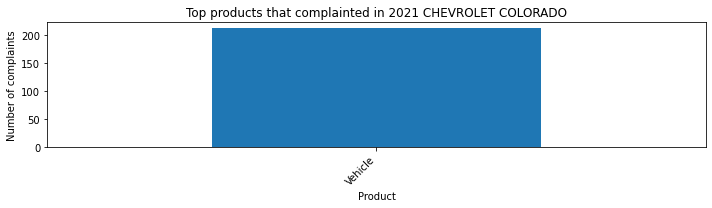

Top components that complainted in 2021 CHEVROLET COLORADO
UNKNOWN OR OTHER     28
STEERING             20
AIR BAGS             16
ENGINE               16
ELECTRICAL SYSTEM    16
Name: components, dtype: int64



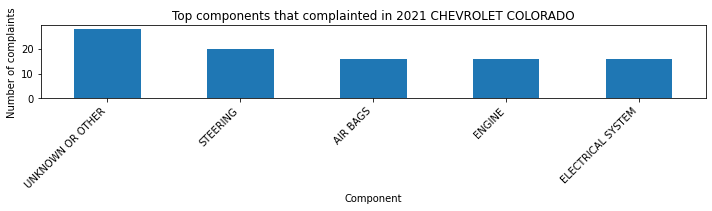

Top products that complainted in 2021 CHEVROLET BLAZER
Vehicle    188
Tire         8
Name: products_type, dtype: int64



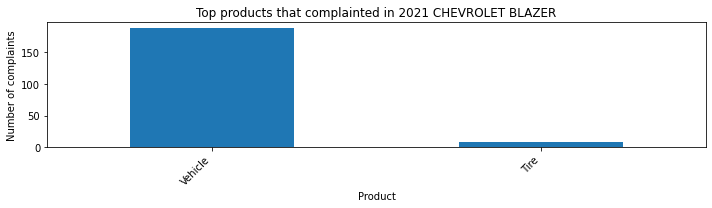

Top components that complainted in 2021 CHEVROLET BLAZER
SERVICE BRAKES            26
ELECTRICAL SYSTEM         20
TIRES                     16
ENGINE                    14
FUEL/PROPULSION SYSTEM    12
Name: components, dtype: int64



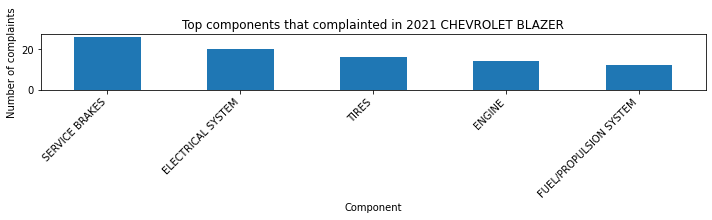

Top products that complainted in 2021 CHEVROLET EQUINOX
Vehicle      134
Tire           6
Equipment      2
Name: products_type, dtype: int64



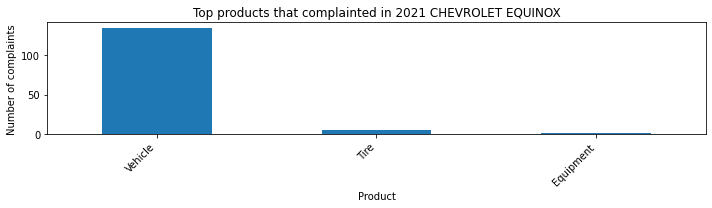

Top components that complainted in 2021 CHEVROLET EQUINOX
UNKNOWN OR OTHER     18
ELECTRICAL SYSTEM    16
POWER TRAIN          14
TIRES                12
ENGINE                8
Name: components, dtype: int64



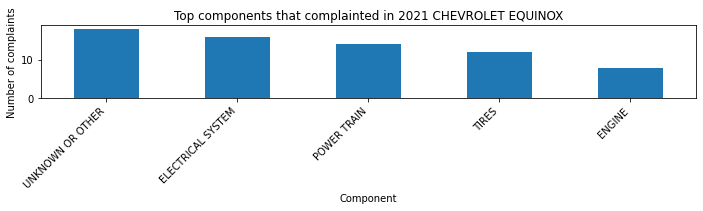

Top products that complainted in 2021 CHEVROLET TRAVERSE
Vehicle       136
Child Seat      4
Name: products_type, dtype: int64



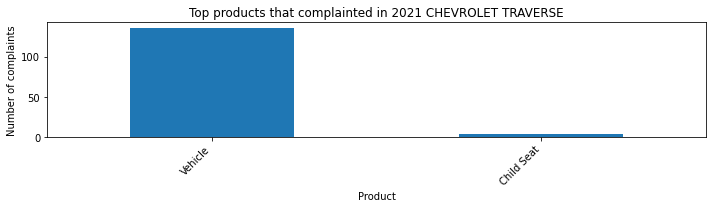

Top components that complainted in 2021 CHEVROLET TRAVERSE
ELECTRICAL SYSTEM            32
UNKNOWN OR OTHER             22
SERVICE BRAKES               12
ENGINE AND ENGINE COOLING    10
POWER TRAIN                   8
Name: components, dtype: int64



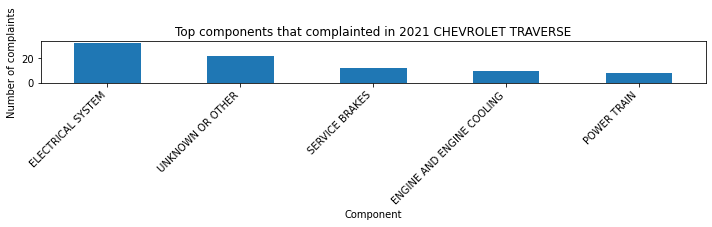

Top products that complainted in 2021 CHEVROLET BOLT EV
Vehicle    63
Tire        1
Name: products_type, dtype: int64



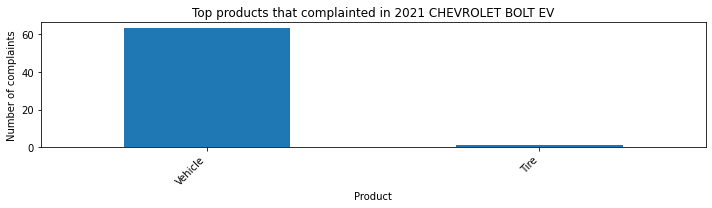

Top components that complainted in 2021 CHEVROLET BOLT EV
ELECTRICAL SYSTEM         20
UNKNOWN OR OTHER           7
FUEL/PROPULSION SYSTEM     7
STEERING                   4
POWER TRAIN                4
Name: components, dtype: int64



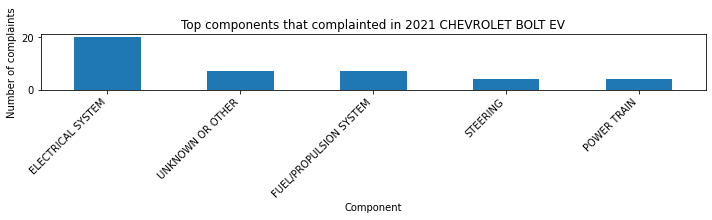

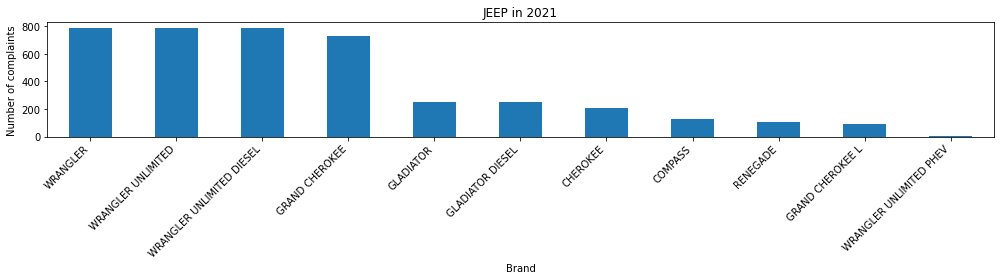

Top 10 models of JEEP by number of complaints:
WRANGLER                     788
WRANGLER UNLIMITED           788
WRANGLER UNLIMITED DIESEL    788
GRAND CHEROKEE               732
GLADIATOR                    248
GLADIATOR DIESEL             248
CHEROKEE                     210
COMPASS                      126
RENEGADE                     108
GRAND CHEROKEE L              94
Name: model, dtype: int64

Top products that complainted in 2021 JEEP WRANGLER
Vehicle      782
Tire           3
Equipment      3
Name: products_type, dtype: int64



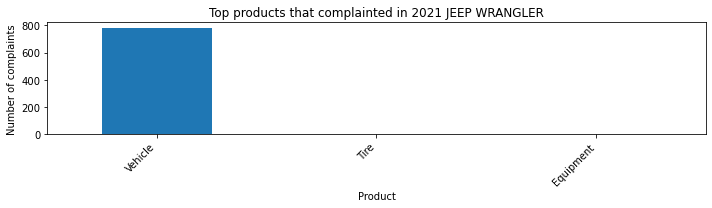

Top components that complainted in 2021 JEEP WRANGLER
ELECTRICAL SYSTEM      108
STEERING                77
STEERING,SUSPENSION     62
POWER TRAIN             56
SUSPENSION              48
Name: components, dtype: int64



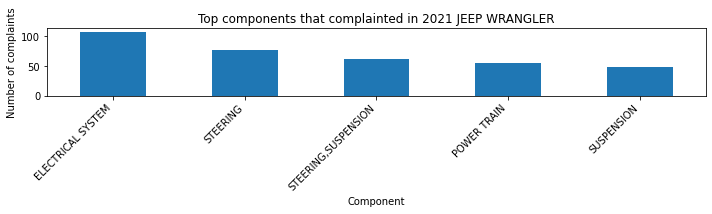

Top products that complainted in 2021 JEEP WRANGLER UNLIMITED
Vehicle      782
Tire           3
Equipment      3
Name: products_type, dtype: int64



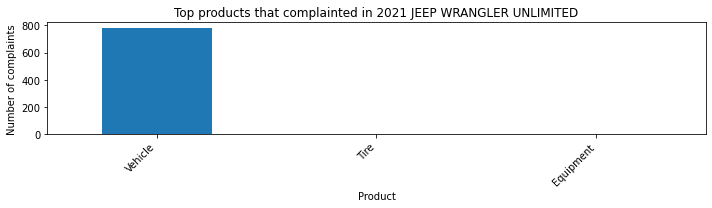

Top components that complainted in 2021 JEEP WRANGLER UNLIMITED
ELECTRICAL SYSTEM      108
STEERING                77
STEERING,SUSPENSION     62
POWER TRAIN             56
SUSPENSION              48
Name: components, dtype: int64



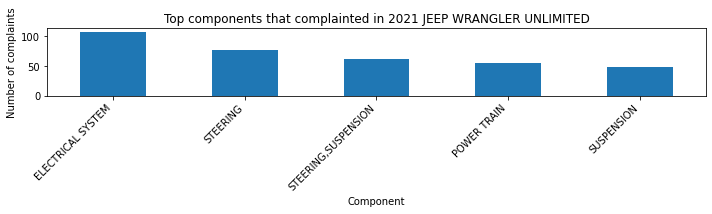

Top products that complainted in 2021 JEEP WRANGLER UNLIMITED DIESEL
Vehicle      782
Tire           3
Equipment      3
Name: products_type, dtype: int64



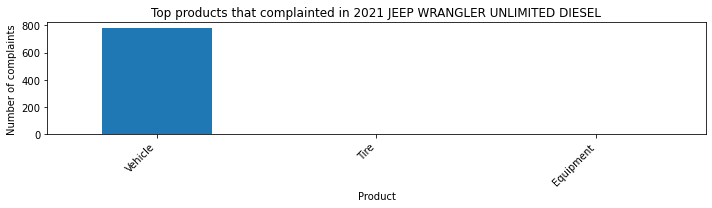

Top components that complainted in 2021 JEEP WRANGLER UNLIMITED DIESEL
ELECTRICAL SYSTEM      108
STEERING                77
STEERING,SUSPENSION     62
POWER TRAIN             56
SUSPENSION              48
Name: components, dtype: int64



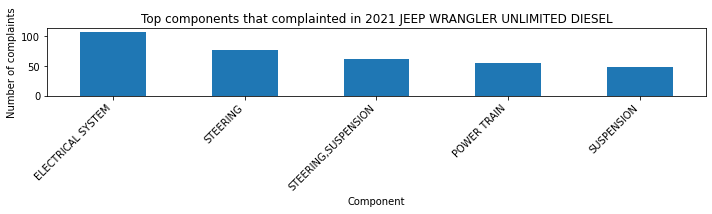

Top products that complainted in 2021 JEEP GRAND CHEROKEE
Vehicle    730
Tire         2
Name: products_type, dtype: int64



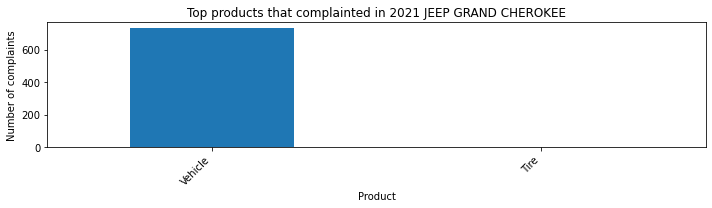

Top components that complainted in 2021 JEEP GRAND CHEROKEE
UNKNOWN OR OTHER     58
EXTERIOR LIGHTING    56
STEERING             54
POWER TRAIN          42
ELECTRICAL SYSTEM    34
Name: components, dtype: int64



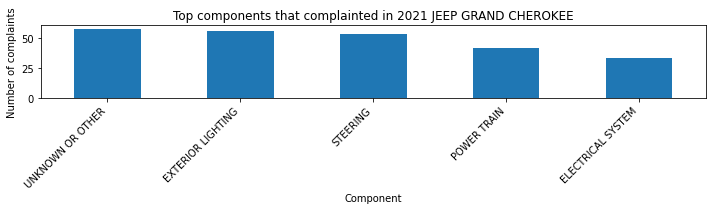

Top products that complainted in 2021 JEEP GLADIATOR
Vehicle      246
Equipment      1
Tire           1
Name: products_type, dtype: int64



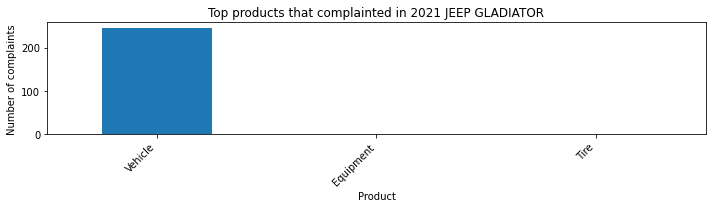

Top components that complainted in 2021 JEEP GLADIATOR
STEERING                        44
POWER TRAIN                     36
STEERING,SUSPENSION             13
SUSPENSION                      11
FUEL SYSTEM, GASOLINE,ENGINE     9
Name: components, dtype: int64



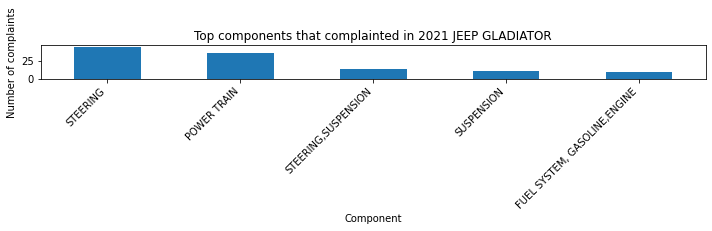

Top products that complainted in 2021 JEEP GLADIATOR DIESEL
Vehicle      246
Equipment      1
Tire           1
Name: products_type, dtype: int64



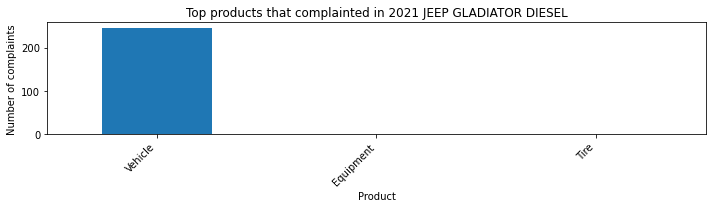

Top components that complainted in 2021 JEEP GLADIATOR DIESEL
STEERING                        44
POWER TRAIN                     36
STEERING,SUSPENSION             13
SUSPENSION                      11
FUEL SYSTEM, GASOLINE,ENGINE     9
Name: components, dtype: int64



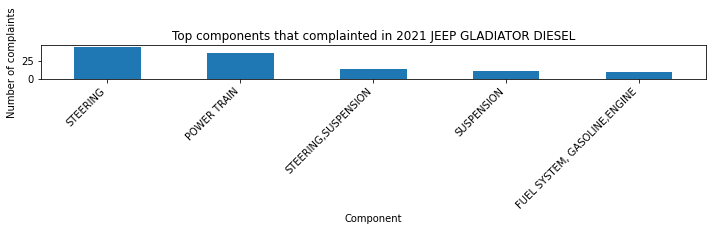

Top products that complainted in 2021 JEEP CHEROKEE
Vehicle       206
Child Seat      2
Tire            2
Name: products_type, dtype: int64



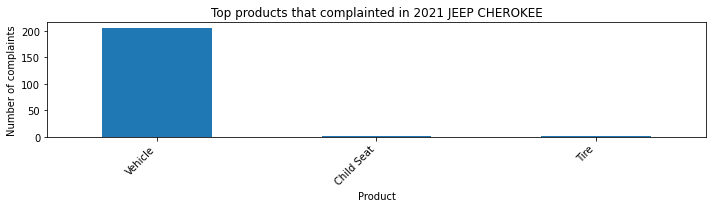

Top components that complainted in 2021 JEEP CHEROKEE
POWER TRAIN         68
UNKNOWN OR OTHER    18
ENGINE              14
SUSPENSION           8
AIR BAGS             6
Name: components, dtype: int64



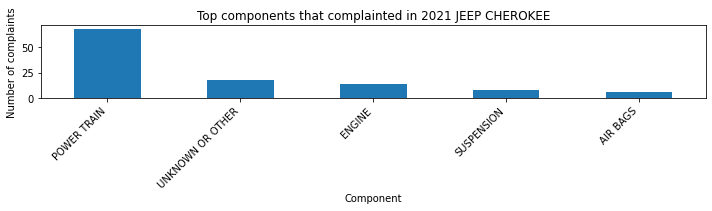

Top products that complainted in 2021 JEEP COMPASS
Vehicle    126
Name: products_type, dtype: int64



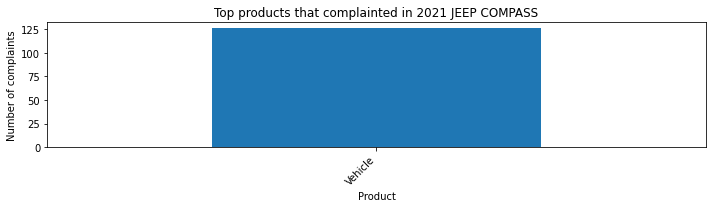

Top components that complainted in 2021 JEEP COMPASS
UNKNOWN OR OTHER                      20
ELECTRICAL SYSTEM                     16
POWER TRAIN                           10
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     6
STEERING                               6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


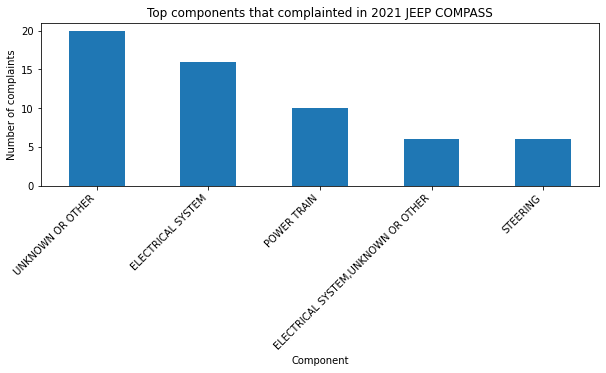

Top products that complainted in 2021 JEEP RENEGADE
Vehicle      104
Equipment      2
Tire           2
Name: products_type, dtype: int64



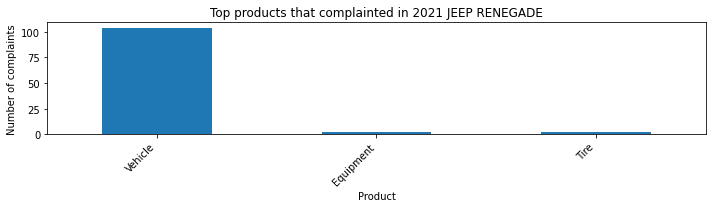

Top components that complainted in 2021 JEEP RENEGADE
ELECTRICAL SYSTEM                             20
UNKNOWN OR OTHER                              16
AIR BAGS                                       6
ELECTRICAL SYSTEM,AIR BAGS,ENGINE              4
LANE DEPARTURE,FORWARD COLLISION AVOIDANCE     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


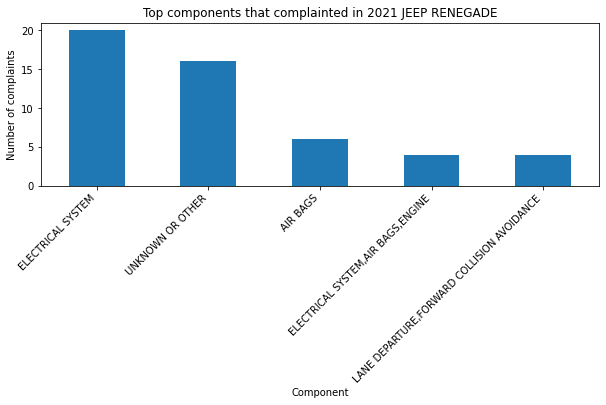

Top products that complainted in 2021 JEEP GRAND CHEROKEE L
Vehicle    94
Name: products_type, dtype: int64



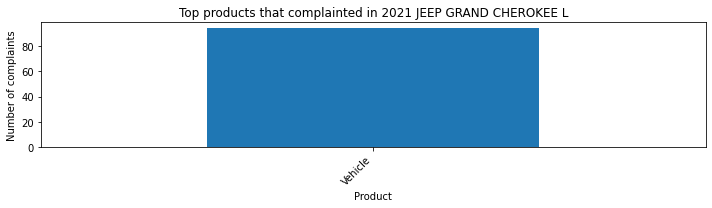

Top components that complainted in 2021 JEEP GRAND CHEROKEE L
ELECTRICAL SYSTEM,FORWARD COLLISION AVOIDANCE    12
ELECTRICAL SYSTEM                                 8
SEATS                                             8
STEERING                                          6
UNKNOWN OR OTHER                                  6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


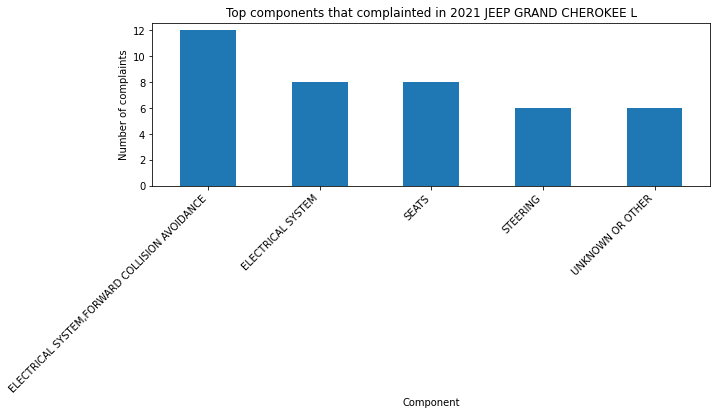


===================== Data Analysis for 2022 =====================


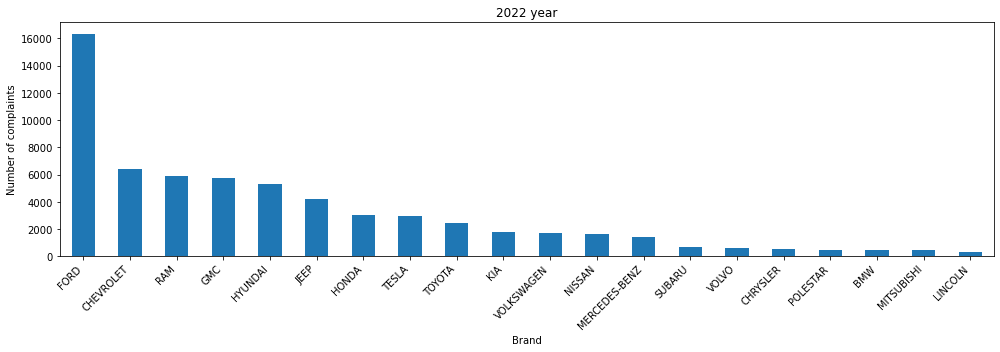

Top 5 Brands with the Most Complaints in 2022:
FORD         16345
CHEVROLET     6422
RAM           5866
GMC           5768
HYUNDAI       5299
Name: make, dtype: int64


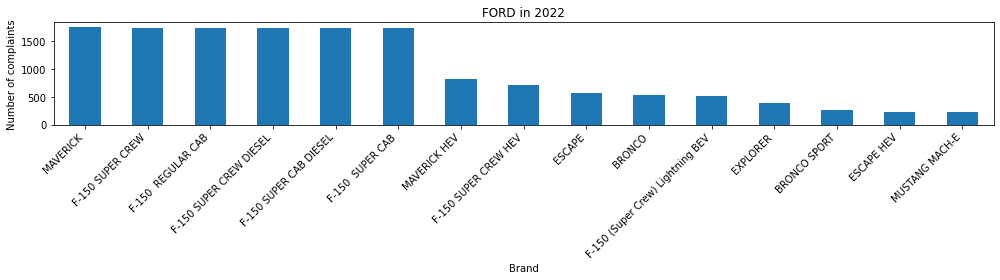

Top 10 models of FORD by number of complaints:
MAVERICK                   1748
F-150 SUPER CREW           1732
F-150  REGULAR CAB         1732
F-150 SUPER CREW DIESEL    1732
F-150 SUPER CAB DIESEL     1732
F-150  SUPER CAB           1732
MAVERICK HEV                820
F-150 SUPER CREW HEV        716
ESCAPE                      566
BRONCO                      538
Name: model, dtype: int64

Top products that complainted in 2022 FORD MAVERICK
Vehicle    1746
Tire          2
Name: products_type, dtype: int64



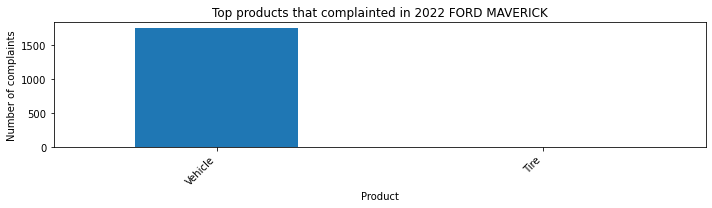

Top components that complainted in 2022 FORD MAVERICK
SERVICE BRAKES       274
ELECTRICAL SYSTEM    226
POWER TRAIN          196
ENGINE               172
UNKNOWN OR OTHER      90
Name: components, dtype: int64



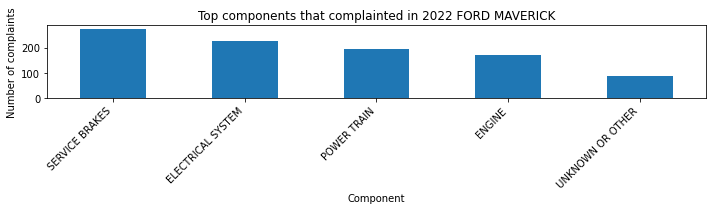

Top products that complainted in 2022 FORD F-150 SUPER CREW
Vehicle    1732
Name: products_type, dtype: int64



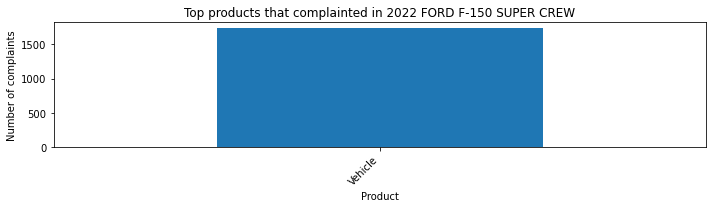

Top components that complainted in 2022 FORD F-150 SUPER CREW
POWER TRAIN                    310
ELECTRICAL SYSTEM              166
UNKNOWN OR OTHER               138
EXTERIOR LIGHTING              124
ELECTRICAL SYSTEM,EQUIPMENT    104
Name: components, dtype: int64



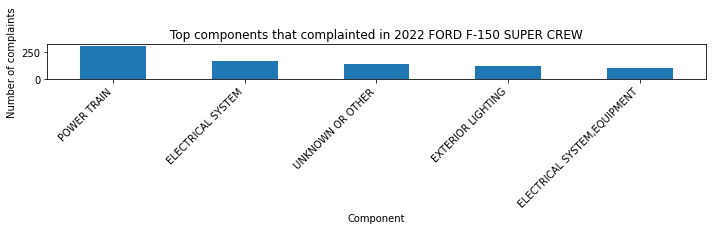

Top products that complainted in 2022 FORD F-150  REGULAR CAB
Vehicle    1732
Name: products_type, dtype: int64



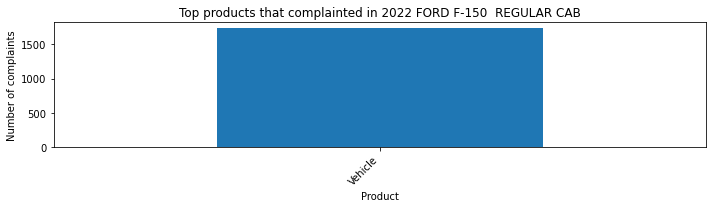

Top components that complainted in 2022 FORD F-150  REGULAR CAB
POWER TRAIN                    310
ELECTRICAL SYSTEM              166
UNKNOWN OR OTHER               138
EXTERIOR LIGHTING              124
ELECTRICAL SYSTEM,EQUIPMENT    104
Name: components, dtype: int64



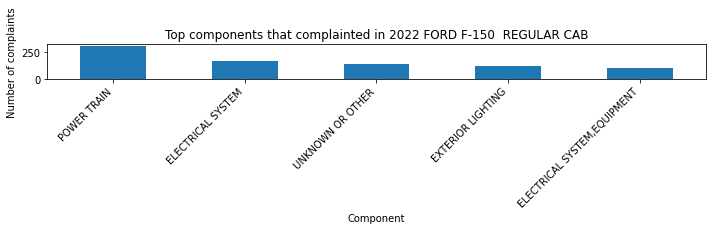

Top products that complainted in 2022 FORD F-150 SUPER CREW DIESEL
Vehicle    1732
Name: products_type, dtype: int64



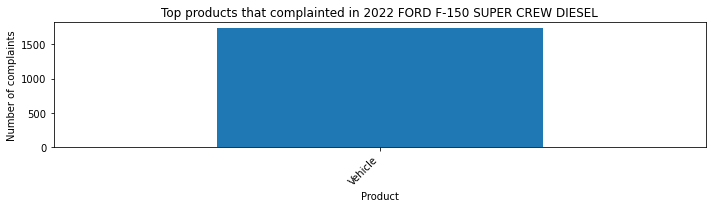

Top components that complainted in 2022 FORD F-150 SUPER CREW DIESEL
POWER TRAIN                    310
ELECTRICAL SYSTEM              166
UNKNOWN OR OTHER               138
EXTERIOR LIGHTING              124
ELECTRICAL SYSTEM,EQUIPMENT    104
Name: components, dtype: int64



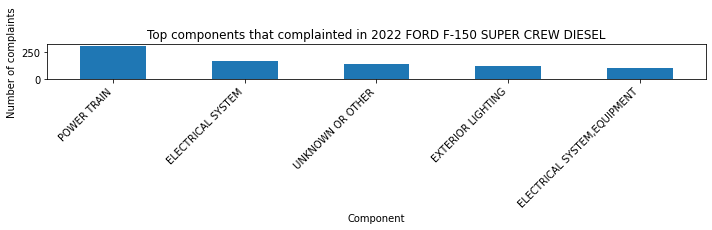

Top products that complainted in 2022 FORD F-150 SUPER CAB DIESEL
Vehicle    1732
Name: products_type, dtype: int64



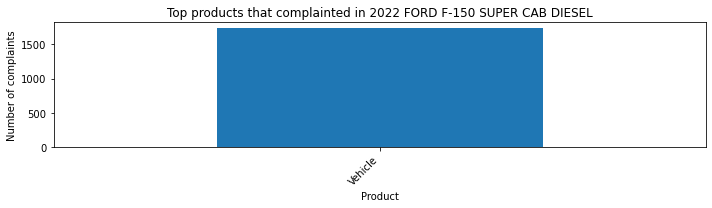

Top components that complainted in 2022 FORD F-150 SUPER CAB DIESEL
POWER TRAIN                    310
ELECTRICAL SYSTEM              166
UNKNOWN OR OTHER               138
EXTERIOR LIGHTING              124
ELECTRICAL SYSTEM,EQUIPMENT    104
Name: components, dtype: int64



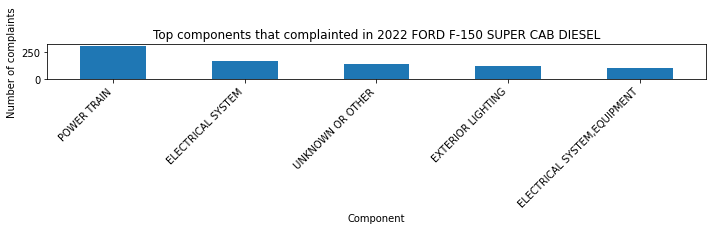

Top products that complainted in 2022 FORD F-150  SUPER CAB
Vehicle    1732
Name: products_type, dtype: int64



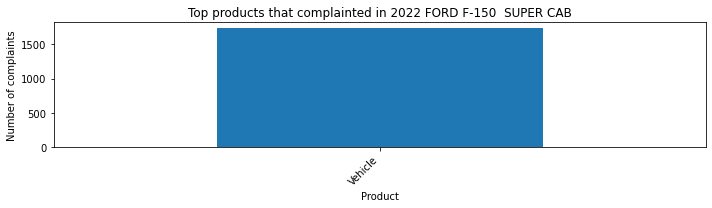

Top components that complainted in 2022 FORD F-150  SUPER CAB
POWER TRAIN                    310
ELECTRICAL SYSTEM              166
UNKNOWN OR OTHER               138
EXTERIOR LIGHTING              124
ELECTRICAL SYSTEM,EQUIPMENT    104
Name: components, dtype: int64



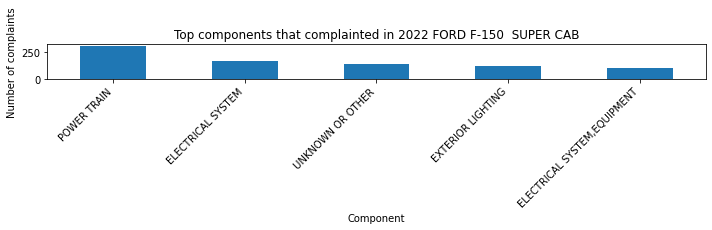

Top products that complainted in 2022 FORD MAVERICK HEV
Vehicle    819
Tire         1
Name: products_type, dtype: int64



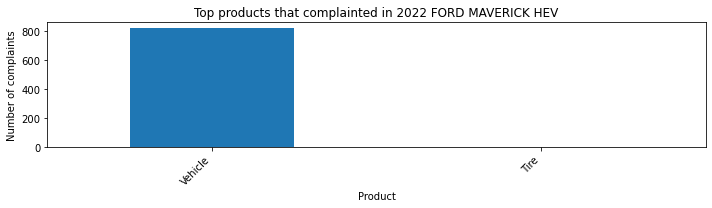

Top components that complainted in 2022 FORD MAVERICK HEV
SERVICE BRAKES                          132
ELECTRICAL SYSTEM                       111
POWER TRAIN                              89
ENGINE                                   84
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     45
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


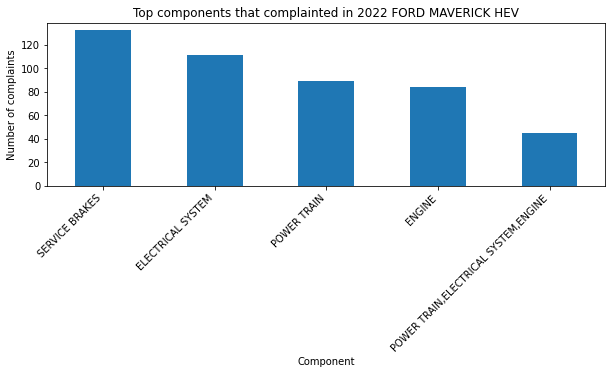

Top products that complainted in 2022 FORD F-150 SUPER CREW HEV
Vehicle    716
Name: products_type, dtype: int64



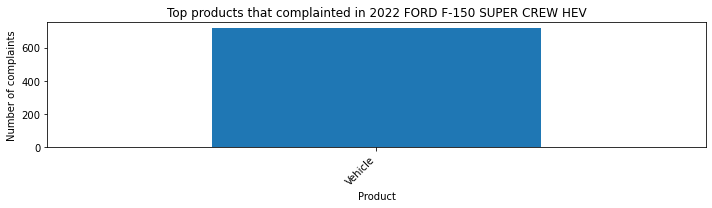

Top components that complainted in 2022 FORD F-150 SUPER CREW HEV
POWER TRAIN                           196
ELECTRICAL SYSTEM                      66
ELECTRICAL SYSTEM,EQUIPMENT            54
UNKNOWN OR OTHER                       54
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


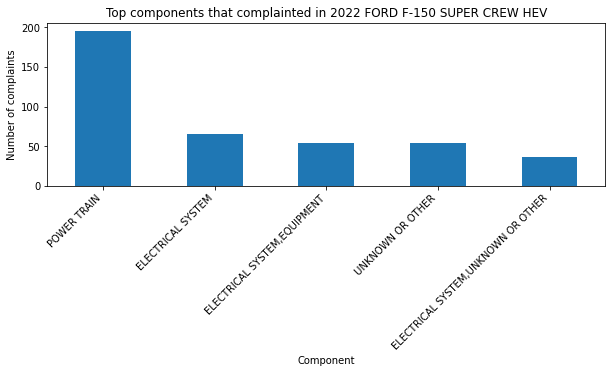

Top products that complainted in 2022 FORD ESCAPE
Vehicle    560
Tire         6
Name: products_type, dtype: int64



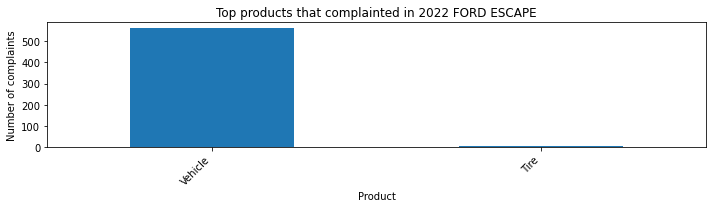

Top components that complainted in 2022 FORD ESCAPE
ENGINE                   118
FUEL SYSTEM, GASOLINE     68
SERVICE BRAKES            64
STRUCTURE                 46
ELECTRICAL SYSTEM         24
Name: components, dtype: int64



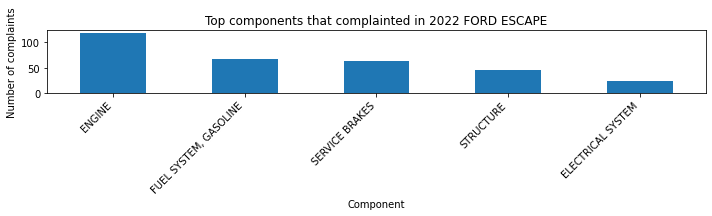

Top products that complainted in 2022 FORD BRONCO
Vehicle      536
Equipment      2
Name: products_type, dtype: int64



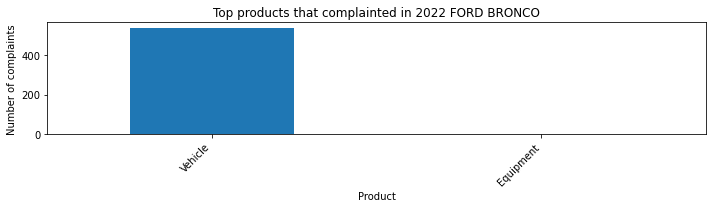

Top components that complainted in 2022 FORD BRONCO
VISIBILITY/WIPER    122
UNKNOWN OR OTHER     34
ENGINE               34
SERVICE BRAKES       34
POWER TRAIN          30
Name: components, dtype: int64



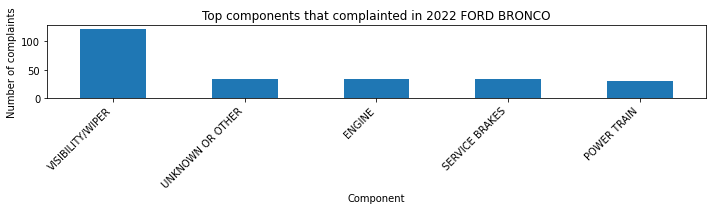

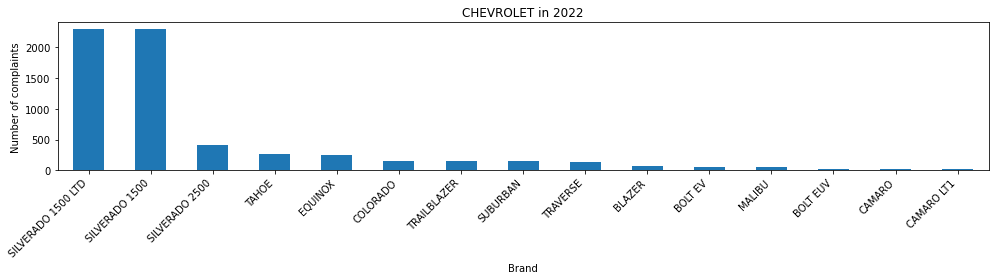

Top 10 models of CHEVROLET by number of complaints:
SILVERADO 1500 LTD    2292
SILVERADO 1500        2292
SILVERADO 2500         420
TAHOE                  272
EQUINOX                256
COLORADO               156
TRAILBLAZER            150
SUBURBAN               148
TRAVERSE               138
BLAZER                  68
Name: model, dtype: int64

Top products that complainted in 2022 CHEVROLET SILVERADO 1500 LTD
Vehicle      2286
Equipment       6
Name: products_type, dtype: int64



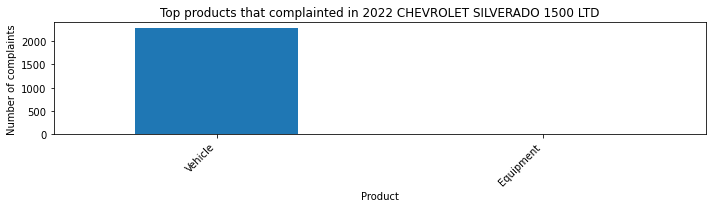

Top components that complainted in 2022 CHEVROLET SILVERADO 1500 LTD
ENGINE                       546
POWER TRAIN                  336
ELECTRICAL SYSTEM            168
SERVICE BRAKES               120
ENGINE AND ENGINE COOLING    102
Name: components, dtype: int64



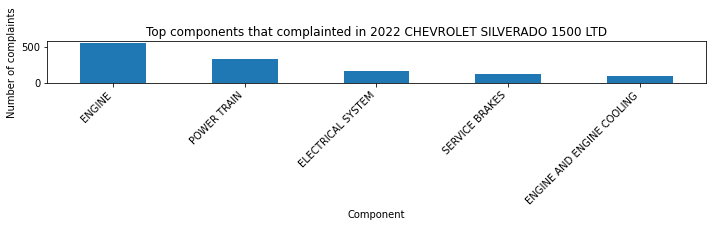

Top products that complainted in 2022 CHEVROLET SILVERADO 1500
Vehicle      2286
Equipment       6
Name: products_type, dtype: int64



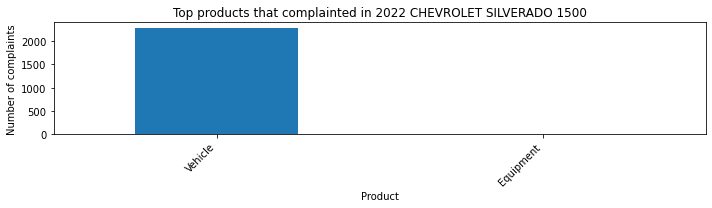

Top components that complainted in 2022 CHEVROLET SILVERADO 1500
ENGINE                       546
POWER TRAIN                  336
ELECTRICAL SYSTEM            168
SERVICE BRAKES               120
ENGINE AND ENGINE COOLING    102
Name: components, dtype: int64



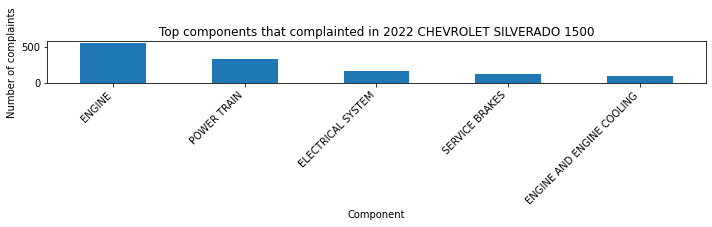

Top products that complainted in 2022 CHEVROLET SILVERADO 2500
Vehicle    402
Tire        18
Name: products_type, dtype: int64



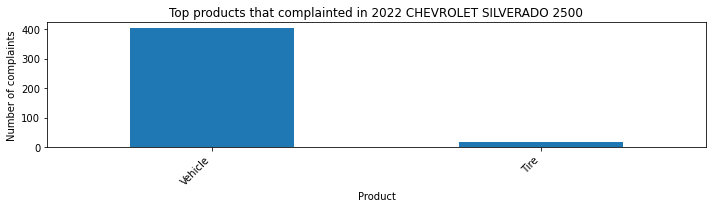

Top components that complainted in 2022 CHEVROLET SILVERADO 2500
UNKNOWN OR OTHER          54
LATCHES/LOCKS/LINKAGES    48
ELECTRICAL SYSTEM         48
TIRES                     36
POWER TRAIN               24
Name: components, dtype: int64



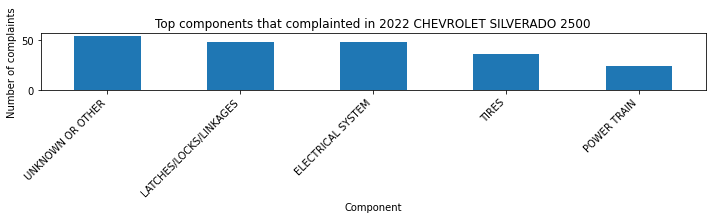

Top products that complainted in 2022 CHEVROLET TAHOE
Vehicle       268
Tire            2
Child Seat      2
Name: products_type, dtype: int64



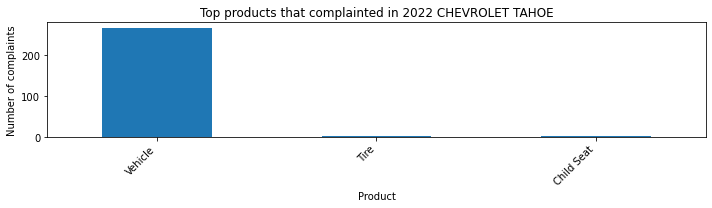

Top components that complainted in 2022 CHEVROLET TAHOE
ENGINE               74
POWER TRAIN          24
ELECTRICAL SYSTEM    22
UNKNOWN OR OTHER     18
SERVICE BRAKES       12
Name: components, dtype: int64



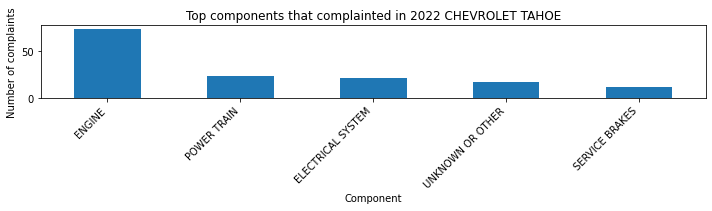

Top products that complainted in 2022 CHEVROLET EQUINOX
Vehicle    256
Name: products_type, dtype: int64



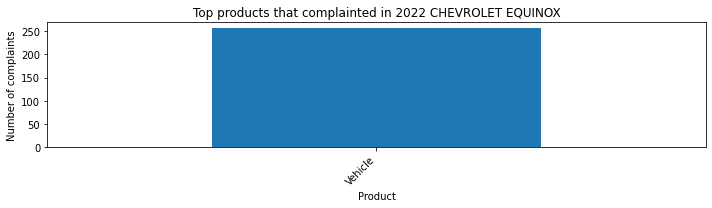

Top components that complainted in 2022 CHEVROLET EQUINOX
FUEL/PROPULSION SYSTEM    86
FUEL SYSTEM, GASOLINE     38
UNKNOWN OR OTHER          12
ENGINE                     8
ELECTRICAL SYSTEM          6
Name: components, dtype: int64



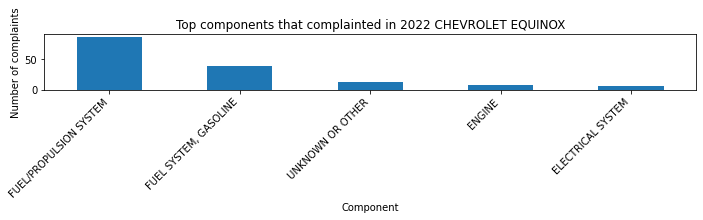

Top products that complainted in 2022 CHEVROLET COLORADO
Vehicle    152
Tire         4
Name: products_type, dtype: int64



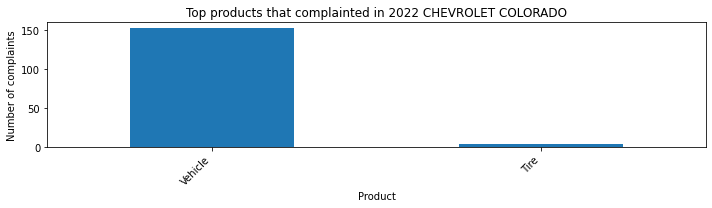

Top components that complainted in 2022 CHEVROLET COLORADO
ELECTRICAL SYSTEM    28
STEERING             24
UNKNOWN OR OTHER     24
SERVICE BRAKES        8
TIRES                 8
Name: components, dtype: int64



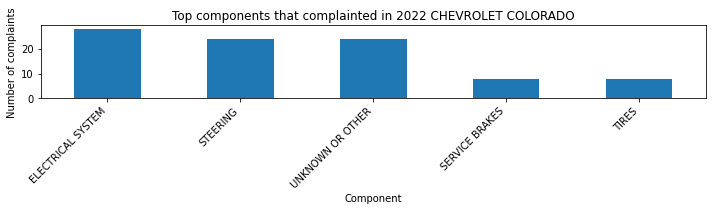

Top products that complainted in 2022 CHEVROLET TRAILBLAZER
Vehicle    148
Tire         2
Name: products_type, dtype: int64



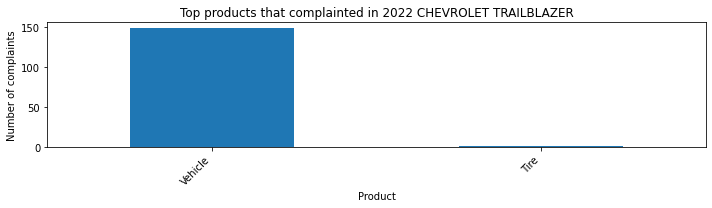

Top components that complainted in 2022 CHEVROLET TRAILBLAZER
UNKNOWN OR OTHER                 32
POWER TRAIN                      16
POWER TRAIN,ELECTRICAL SYSTEM    12
SERVICE BRAKES                   10
ELECTRICAL SYSTEM                 6
Name: components, dtype: int64



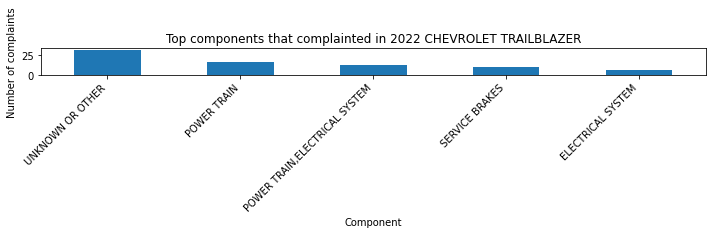

Top products that complainted in 2022 CHEVROLET SUBURBAN
Vehicle    146
Tire         2
Name: products_type, dtype: int64



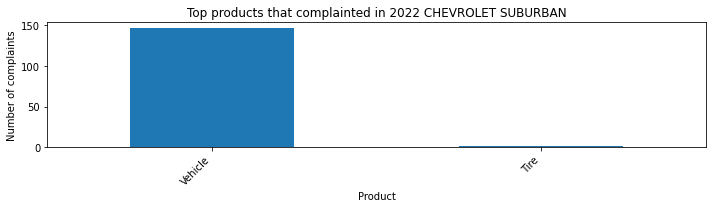

Top components that complainted in 2022 CHEVROLET SUBURBAN
ENGINE                      40
POWER TRAIN                 20
POWER TRAIN,ENGINE          10
UNKNOWN OR OTHER             8
ELECTRICAL SYSTEM,ENGINE     6
Name: components, dtype: int64



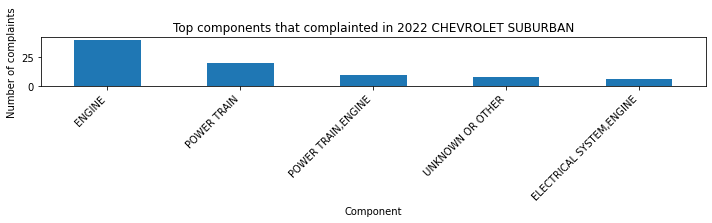

Top products that complainted in 2022 CHEVROLET TRAVERSE
Vehicle    138
Name: products_type, dtype: int64



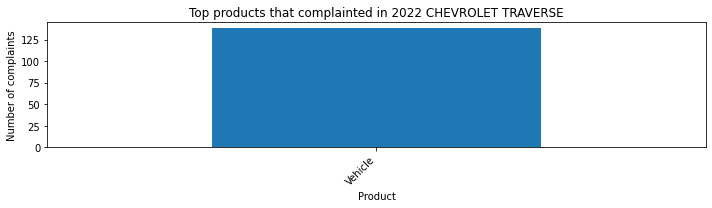

Top components that complainted in 2022 CHEVROLET TRAVERSE
POWER TRAIN                      36
UNKNOWN OR OTHER                 28
ENGINE                           10
POWER TRAIN,ELECTRICAL SYSTEM     8
SERVICE BRAKES                    6
Name: components, dtype: int64



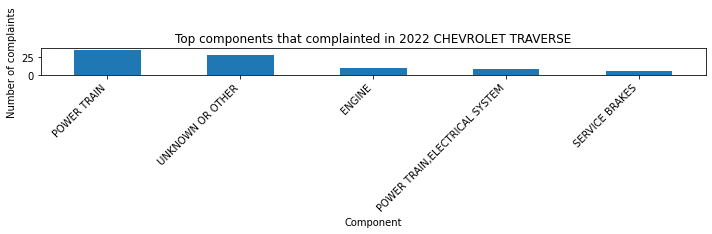

Top products that complainted in 2022 CHEVROLET BLAZER
Vehicle    64
Tire        4
Name: products_type, dtype: int64



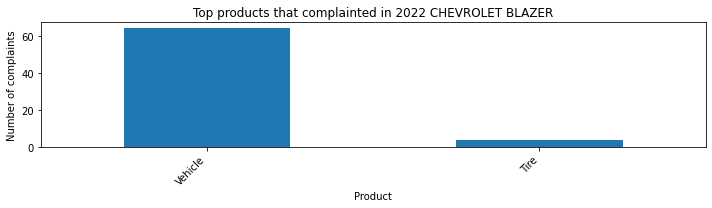

Top components that complainted in 2022 CHEVROLET BLAZER
UNKNOWN OR OTHER     8
TIRES                8
POWER TRAIN          8
ENGINE               6
ELECTRICAL SYSTEM    6
Name: components, dtype: int64



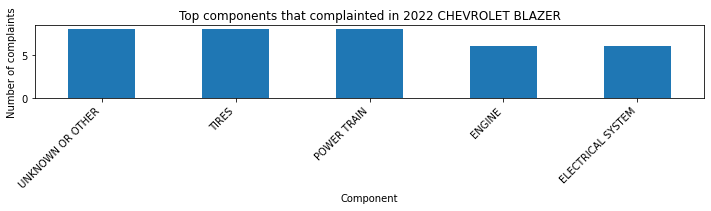

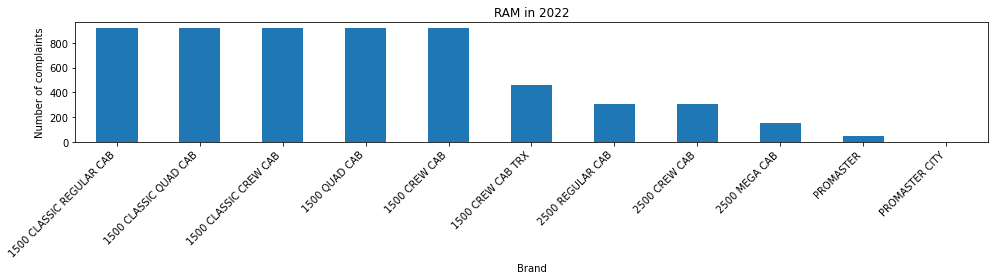

Top 10 models of RAM by number of complaints:
1500 CLASSIC REGULAR CAB    918
1500 CLASSIC QUAD CAB       918
1500 CLASSIC CREW CAB       918
1500 QUAD CAB               918
1500 CREW CAB               918
1500 CREW CAB TRX           459
2500 REGULAR CAB            308
2500 CREW CAB               308
2500 MEGA CAB               154
PROMASTER                    46
Name: model, dtype: int64

Top products that complainted in 2022 RAM 1500 CLASSIC REGULAR CAB
Vehicle      910
Tire           6
Equipment      2
Name: products_type, dtype: int64



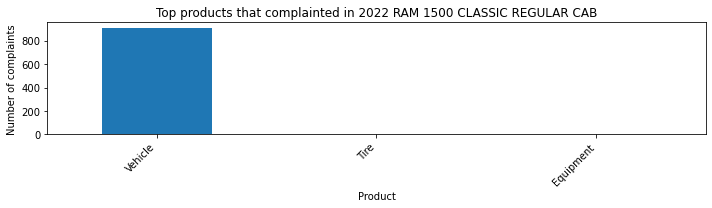

Top components that complainted in 2022 RAM 1500 CLASSIC REGULAR CAB
ENGINE                                  118
UNKNOWN OR OTHER                         68
ELECTRICAL SYSTEM                        46
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     42
ELECTRICAL SYSTEM,ENGINE                 36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


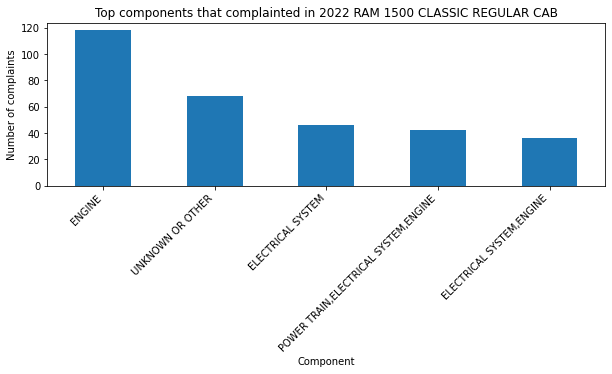

Top products that complainted in 2022 RAM 1500 CLASSIC QUAD CAB
Vehicle      910
Tire           6
Equipment      2
Name: products_type, dtype: int64



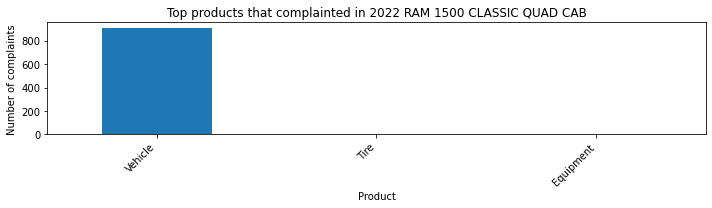

Top components that complainted in 2022 RAM 1500 CLASSIC QUAD CAB
ENGINE                                  118
UNKNOWN OR OTHER                         68
ELECTRICAL SYSTEM                        46
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     42
ELECTRICAL SYSTEM,ENGINE                 36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


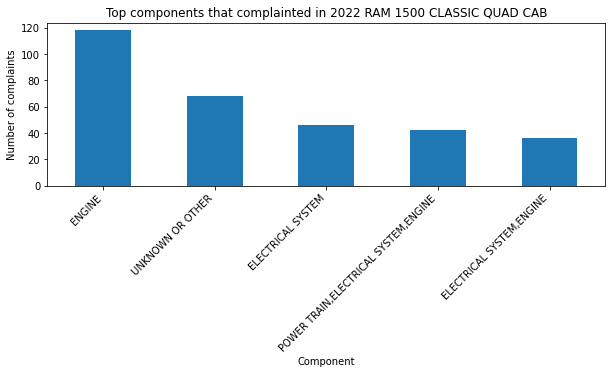

Top products that complainted in 2022 RAM 1500 CLASSIC CREW CAB
Vehicle      910
Tire           6
Equipment      2
Name: products_type, dtype: int64



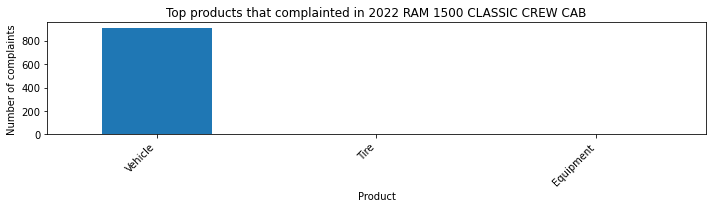

Top components that complainted in 2022 RAM 1500 CLASSIC CREW CAB
ENGINE                                  118
UNKNOWN OR OTHER                         68
ELECTRICAL SYSTEM                        46
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     42
ELECTRICAL SYSTEM,ENGINE                 36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


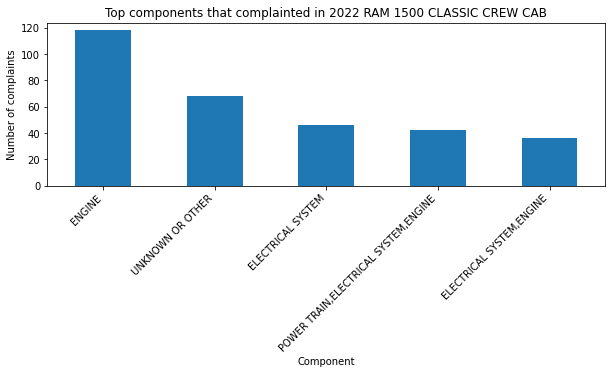

Top products that complainted in 2022 RAM 1500 QUAD CAB
Vehicle      910
Tire           6
Equipment      2
Name: products_type, dtype: int64



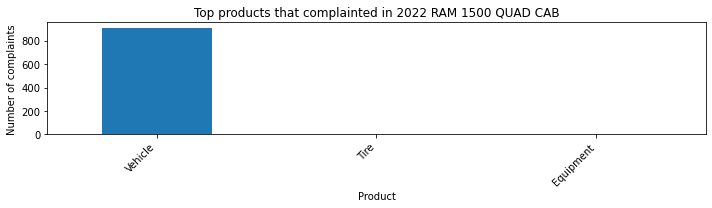

Top components that complainted in 2022 RAM 1500 QUAD CAB
ENGINE                                  118
UNKNOWN OR OTHER                         68
ELECTRICAL SYSTEM                        46
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     42
ELECTRICAL SYSTEM,ENGINE                 36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


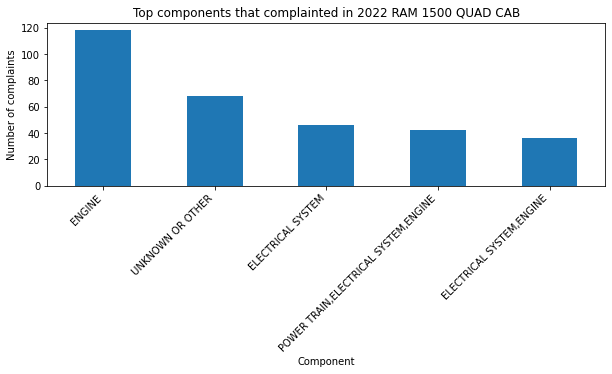

Top products that complainted in 2022 RAM 1500 CREW CAB
Vehicle      910
Tire           6
Equipment      2
Name: products_type, dtype: int64



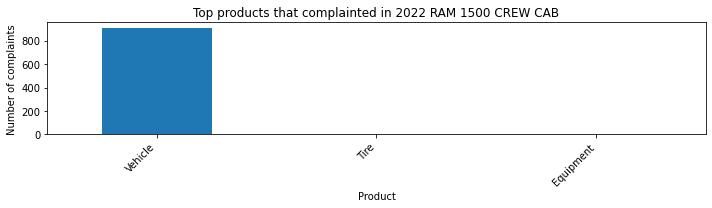

Top components that complainted in 2022 RAM 1500 CREW CAB
ENGINE                                  118
UNKNOWN OR OTHER                         68
ELECTRICAL SYSTEM                        46
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     42
ELECTRICAL SYSTEM,ENGINE                 36
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


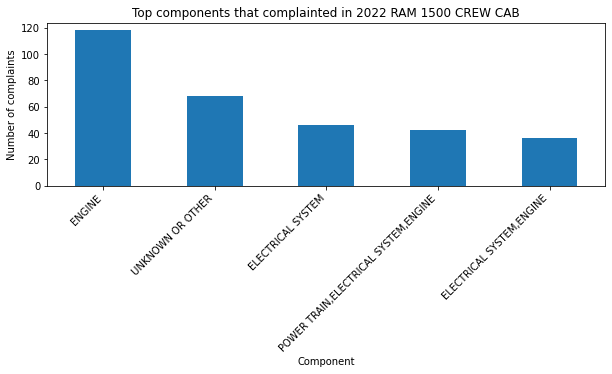

Top products that complainted in 2022 RAM 1500 CREW CAB TRX
Vehicle      455
Tire           3
Equipment      1
Name: products_type, dtype: int64



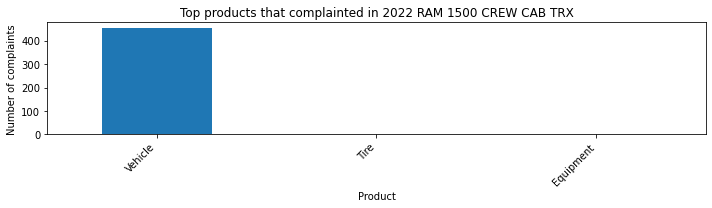

Top components that complainted in 2022 RAM 1500 CREW CAB TRX
ENGINE                                  59
UNKNOWN OR OTHER                        34
ELECTRICAL SYSTEM                       23
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE    21
ELECTRICAL SYSTEM,ENGINE                18
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


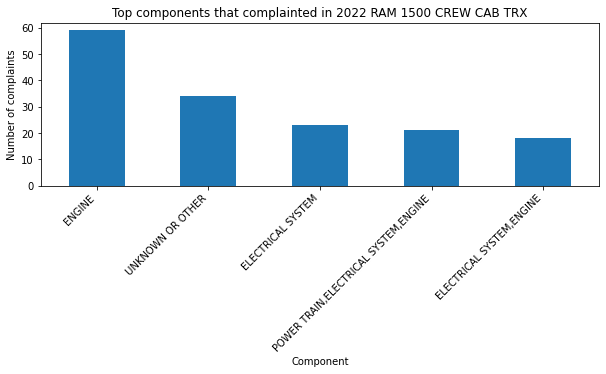

Top products that complainted in 2022 RAM 2500 REGULAR CAB
Vehicle    304
Tire         4
Name: products_type, dtype: int64



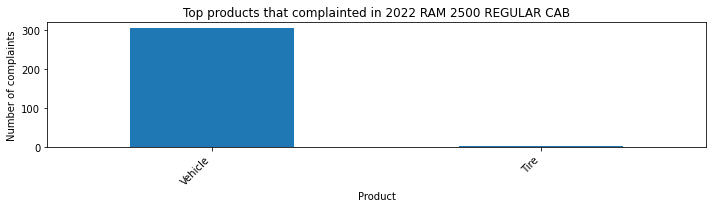

Top components that complainted in 2022 RAM 2500 REGULAR CAB
POWER TRAIN                      40
ELECTRICAL SYSTEM                36
POWER TRAIN,ELECTRICAL SYSTEM    26
ENGINE                           24
UNKNOWN OR OTHER                 22
Name: components, dtype: int64



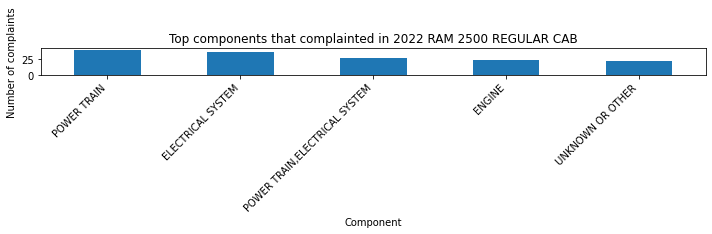

Top products that complainted in 2022 RAM 2500 CREW CAB
Vehicle    304
Tire         4
Name: products_type, dtype: int64



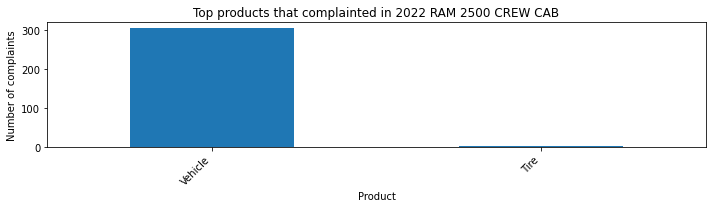

Top components that complainted in 2022 RAM 2500 CREW CAB
POWER TRAIN                      40
ELECTRICAL SYSTEM                36
POWER TRAIN,ELECTRICAL SYSTEM    26
ENGINE                           24
UNKNOWN OR OTHER                 22
Name: components, dtype: int64



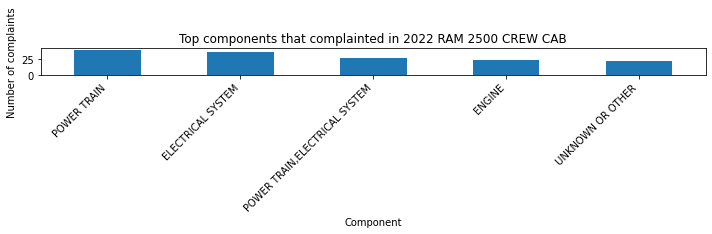

Top products that complainted in 2022 RAM 2500 MEGA CAB
Vehicle    152
Tire         2
Name: products_type, dtype: int64



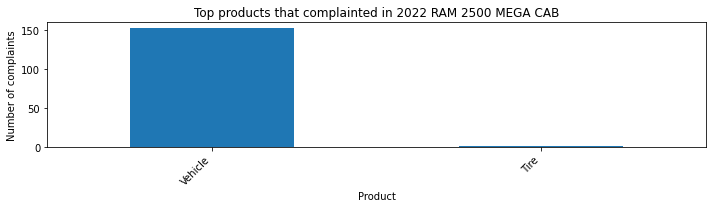

Top components that complainted in 2022 RAM 2500 MEGA CAB
POWER TRAIN                      20
ELECTRICAL SYSTEM                18
POWER TRAIN,ELECTRICAL SYSTEM    13
ENGINE                           12
UNKNOWN OR OTHER                 11
Name: components, dtype: int64



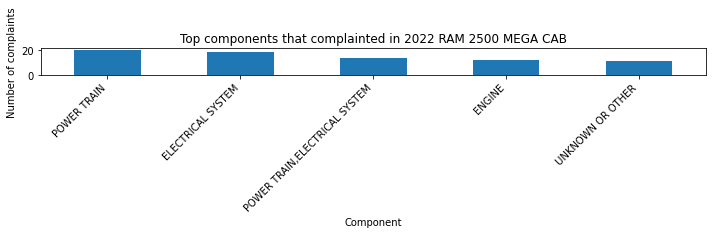

Top products that complainted in 2022 RAM PROMASTER
Vehicle      44
Equipment     1
Tire          1
Name: products_type, dtype: int64



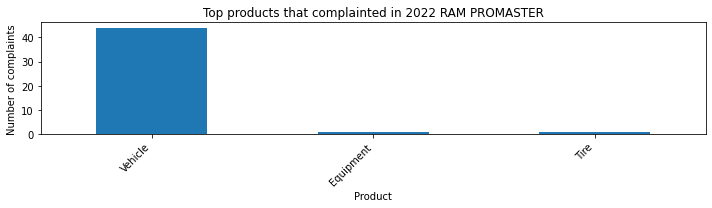

Top components that complainted in 2022 RAM PROMASTER
FORWARD COLLISION AVOIDANCE                          6
SERVICE BRAKES                                       5
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE    5
STEERING                                             5
STRUCTURE                                            3
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


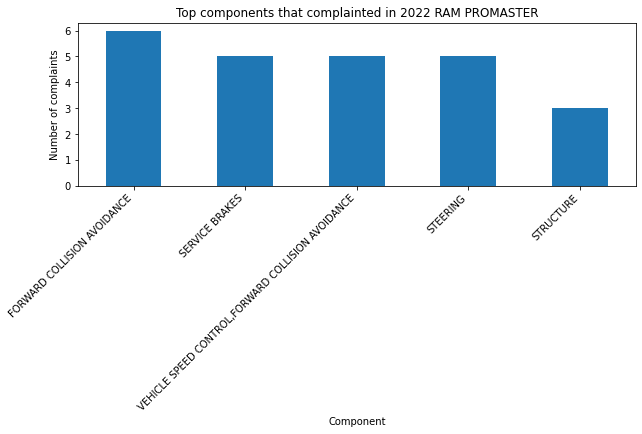

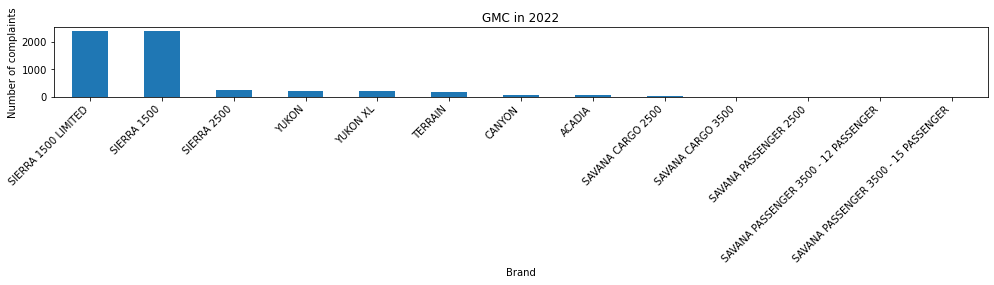

Top 10 models of GMC by number of complaints:
SIERRA 1500 LIMITED    2394
SIERRA 1500            2394
SIERRA 2500             234
YUKON                   212
YUKON XL                206
TERRAIN                 176
CANYON                   68
ACADIA                   62
SAVANA CARGO 2500        18
SAVANA CARGO 3500         1
Name: model, dtype: int64

Top products that complainted in 2022 GMC SIERRA 1500 LIMITED
Vehicle      2388
Equipment       6
Name: products_type, dtype: int64



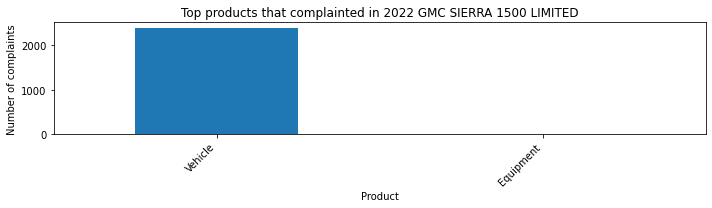

Top components that complainted in 2022 GMC SIERRA 1500 LIMITED
ENGINE               648
STRUCTURE            366
UNKNOWN OR OTHER     210
POWER TRAIN          204
ELECTRICAL SYSTEM    114
Name: components, dtype: int64



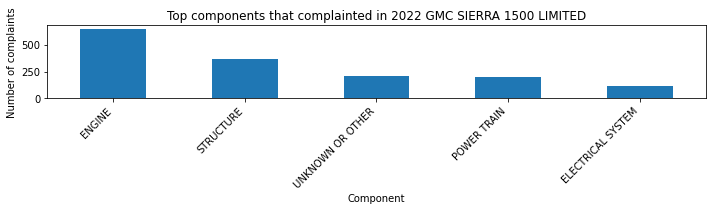

Top products that complainted in 2022 GMC SIERRA 1500
Vehicle      2388
Equipment       6
Name: products_type, dtype: int64



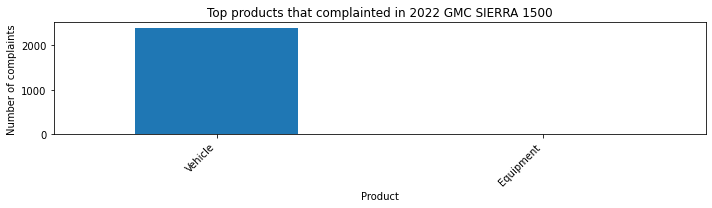

Top components that complainted in 2022 GMC SIERRA 1500
ENGINE               648
STRUCTURE            366
UNKNOWN OR OTHER     210
POWER TRAIN          204
ELECTRICAL SYSTEM    114
Name: components, dtype: int64



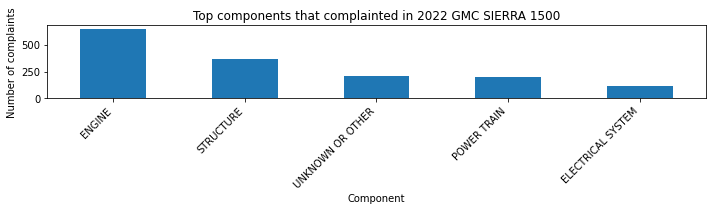

Top products that complainted in 2022 GMC SIERRA 2500
Vehicle    204
Tire        30
Name: products_type, dtype: int64



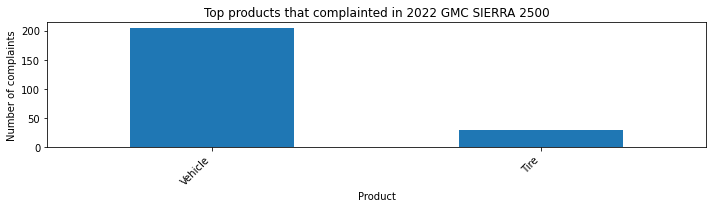

Top components that complainted in 2022 GMC SIERRA 2500
TIRES                60
ELECTRICAL SYSTEM    30
POWER TRAIN          24
STRUCTURE            12
VISIBILITY           12
Name: components, dtype: int64



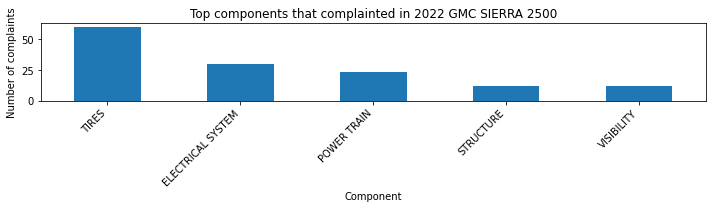

Top products that complainted in 2022 GMC YUKON
Vehicle    212
Name: products_type, dtype: int64



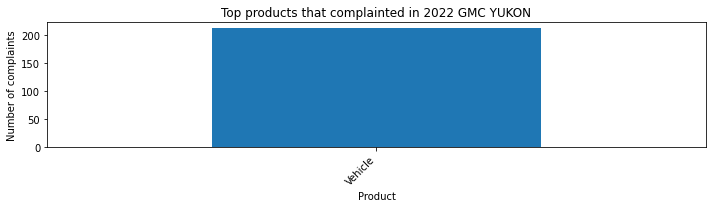

Top components that complainted in 2022 GMC YUKON
ENGINE                       76
ENGINE AND ENGINE COOLING    12
POWER TRAIN                  12
ELECTRICAL SYSTEM            12
ELECTRICAL SYSTEM,ENGINE     12
Name: components, dtype: int64



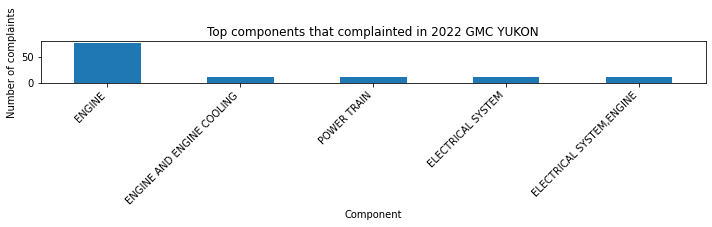

Top products that complainted in 2022 GMC YUKON XL
Vehicle    206
Name: products_type, dtype: int64



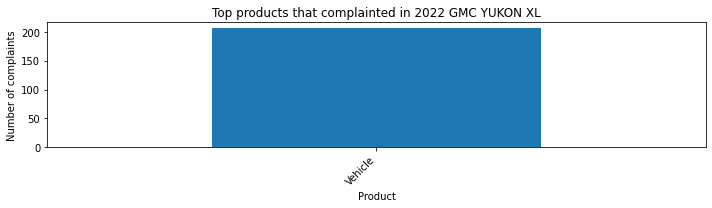

Top components that complainted in 2022 GMC YUKON XL
ENGINE                       98
ENGINE AND ENGINE COOLING    16
ELECTRICAL SYSTEM,ENGINE     14
POWER TRAIN,ENGINE           10
UNKNOWN OR OTHER             10
Name: components, dtype: int64



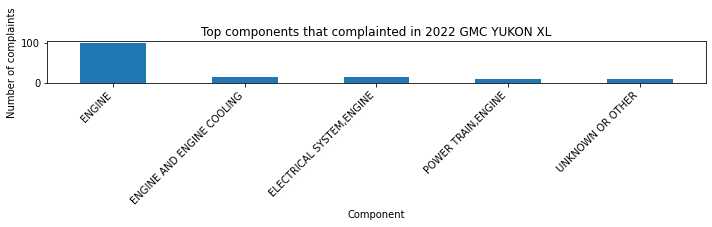

Top products that complainted in 2022 GMC TERRAIN
Vehicle    176
Name: products_type, dtype: int64



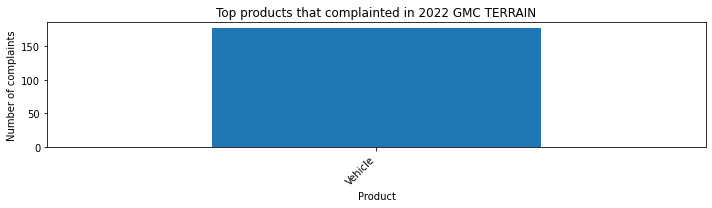

Top components that complainted in 2022 GMC TERRAIN
FUEL/PROPULSION SYSTEM    36
FUEL SYSTEM, GASOLINE     26
UNKNOWN OR OTHER          20
STEERING                   8
ELECTRICAL SYSTEM          8
Name: components, dtype: int64



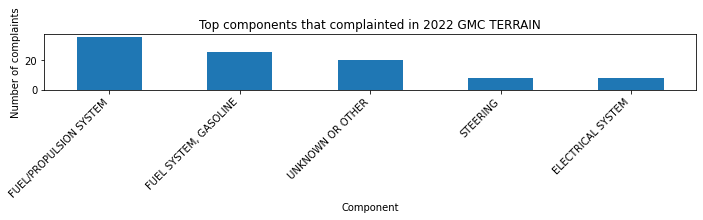

Top products that complainted in 2022 GMC CANYON
Vehicle    68
Name: products_type, dtype: int64



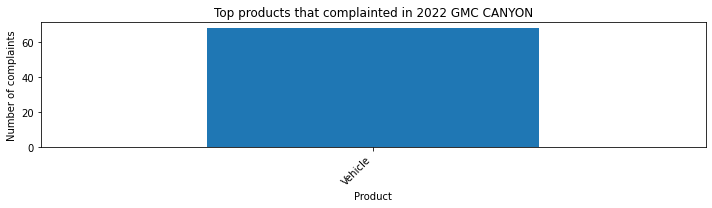

Top components that complainted in 2022 GMC CANYON
STEERING                                    12
POWER TRAIN                                  8
ELECTRICAL SYSTEM                            8
UNKNOWN OR OTHER                             4
ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


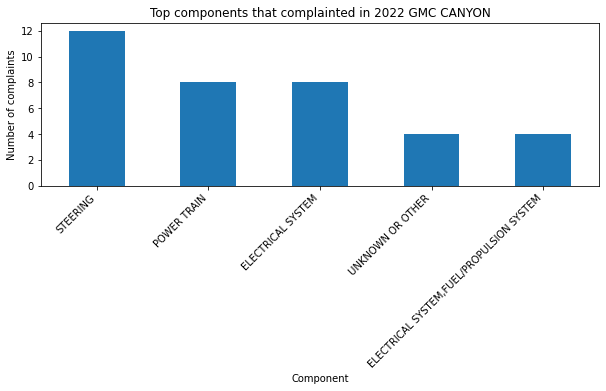

Top products that complainted in 2022 GMC ACADIA
Vehicle    62
Name: products_type, dtype: int64



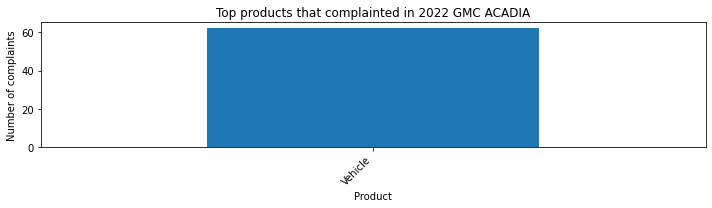

Top components that complainted in 2022 GMC ACADIA
FUEL/PROPULSION SYSTEM           6
SEAT BELTS                       6
ENGINE,FUEL/PROPULSION SYSTEM    4
UNKNOWN OR OTHER                 4
POWER TRAIN                      4
Name: components, dtype: int64



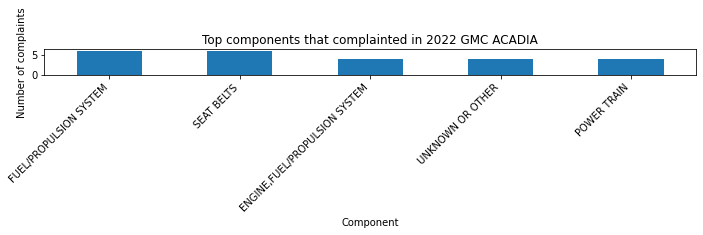

Top products that complainted in 2022 GMC SAVANA CARGO 2500
Vehicle    18
Name: products_type, dtype: int64



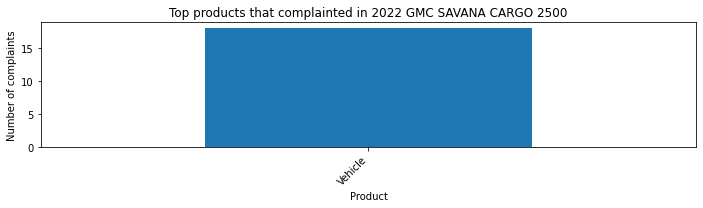

Top components that complainted in 2022 GMC SAVANA CARGO 2500
STEERING             3
STRUCTURE            2
POWER TRAIN          2
ELECTRICAL SYSTEM    2
UNKNOWN OR OTHER     1
Name: components, dtype: int64



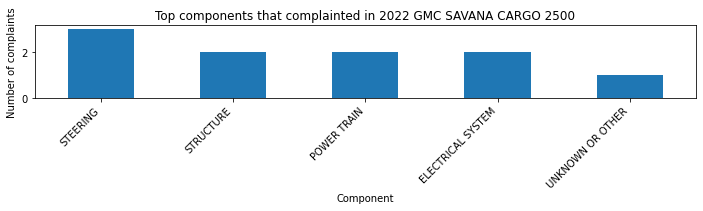

Top products that complainted in 2022 GMC SAVANA CARGO 3500
Vehicle    1
Name: products_type, dtype: int64



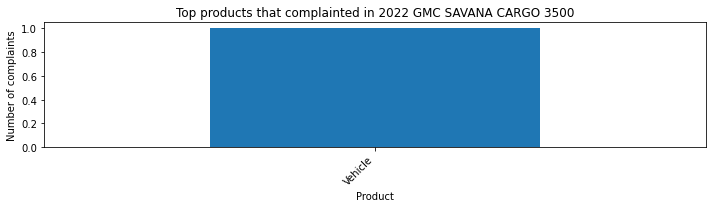

Top components that complainted in 2022 GMC SAVANA CARGO 3500
STRUCTURE    1
Name: components, dtype: int64



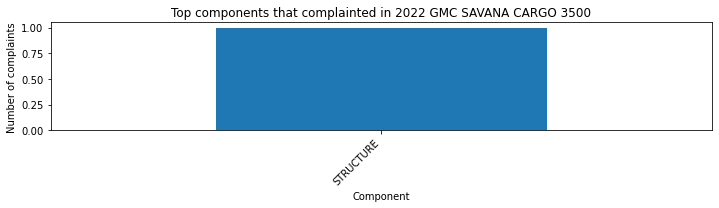

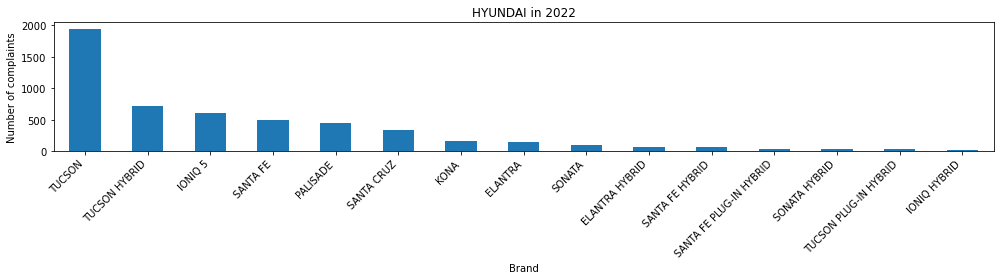

Top 10 models of HYUNDAI by number of complaints:
TUCSON            1948
TUCSON HYBRID      720
IONIQ 5            612
SANTA FE           492
PALISADE           442
SANTA CRUZ         336
KONA               166
ELANTRA            139
SONATA              93
ELANTRA HYBRID      65
Name: model, dtype: int64

Top products that complainted in 2022 HYUNDAI TUCSON
Vehicle    1924
Tire         24
Name: products_type, dtype: int64



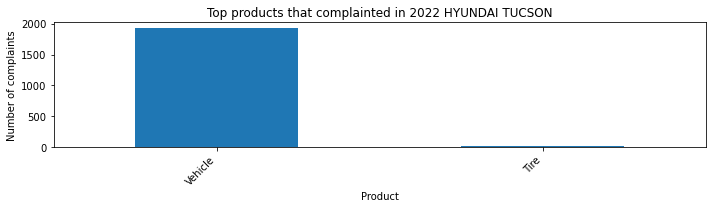

Top components that complainted in 2022 HYUNDAI TUCSON
FUEL/PROPULSION SYSTEM           280
UNKNOWN OR OTHER                 168
ENGINE                           160
POWER TRAIN                      120
ENGINE,FUEL/PROPULSION SYSTEM     84
Name: components, dtype: int64



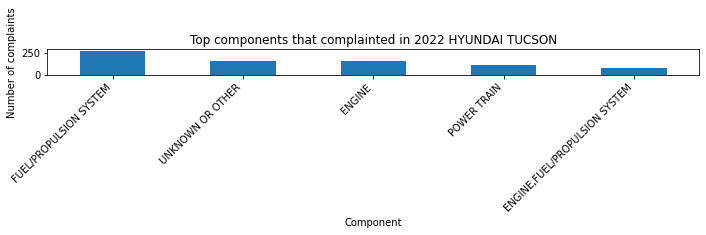

Top products that complainted in 2022 HYUNDAI TUCSON HYBRID
Vehicle    712
Tire         8
Name: products_type, dtype: int64



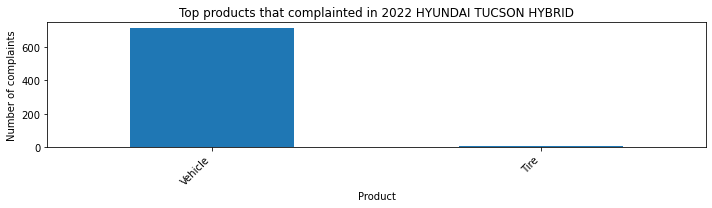

Top components that complainted in 2022 HYUNDAI TUCSON HYBRID
UNKNOWN OR OTHER                        76
ENGINE                                  68
POWER TRAIN,ENGINE                      32
VISIBILITY                              32
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE    32
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


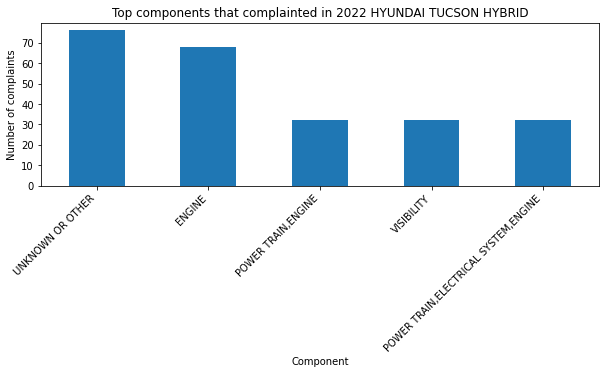

Top products that complainted in 2022 HYUNDAI IONIQ 5
Vehicle       606
Equipment       4
Child Seat      2
Name: products_type, dtype: int64



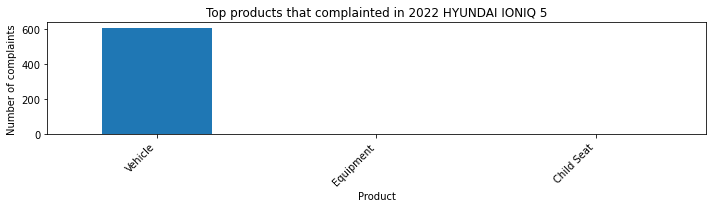

Top components that complainted in 2022 HYUNDAI IONIQ 5
ELECTRICAL SYSTEM                                       244
ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM                 52
POWER TRAIN,ELECTRICAL SYSTEM                            36
POWER TRAIN,ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM     24
FUEL/PROPULSION SYSTEM                                   18
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


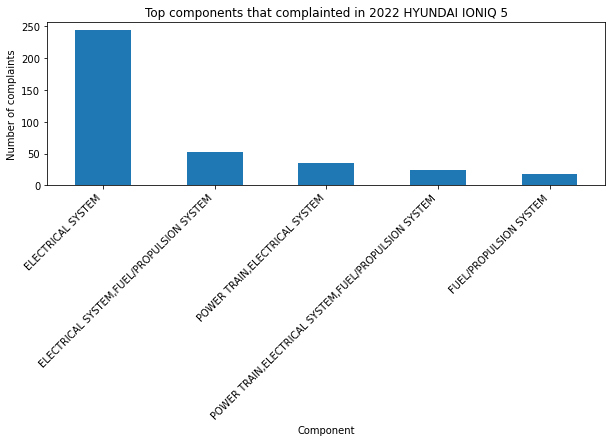

Top products that complainted in 2022 HYUNDAI SANTA FE
Vehicle    490
Tire         2
Name: products_type, dtype: int64



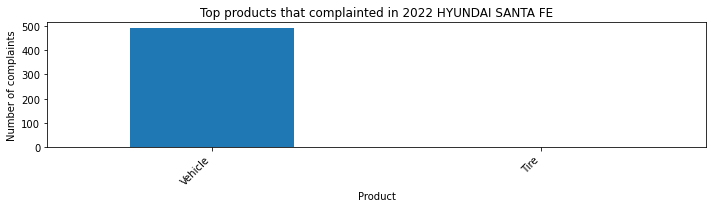

Top components that complainted in 2022 HYUNDAI SANTA FE
POWER TRAIN                    74
ENGINE                         50
UNKNOWN OR OTHER               34
FORWARD COLLISION AVOIDANCE    20
ELECTRICAL SYSTEM              18
Name: components, dtype: int64



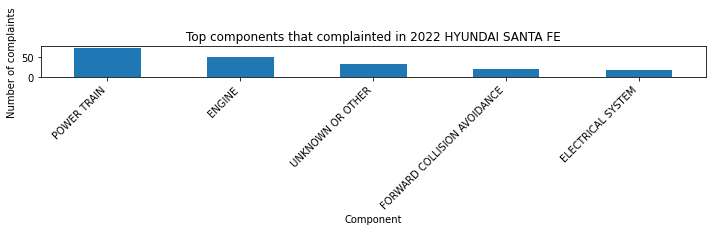

Top products that complainted in 2022 HYUNDAI PALISADE
Vehicle    442
Name: products_type, dtype: int64



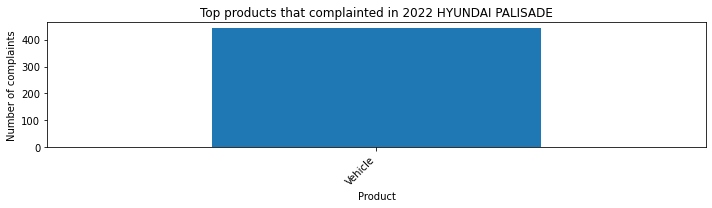

Top components that complainted in 2022 HYUNDAI PALISADE
SEAT BELTS          96
VISIBILITY/WIPER    46
UNKNOWN OR OTHER    40
VISIBILITY          30
SUSPENSION          24
Name: components, dtype: int64



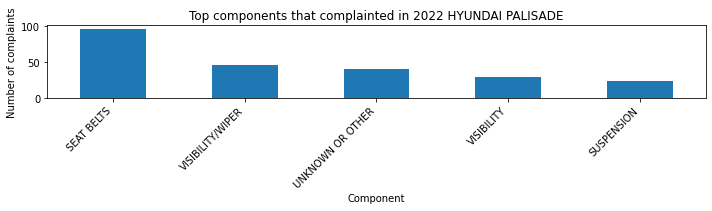

Top products that complainted in 2022 HYUNDAI SANTA CRUZ
Vehicle    336
Name: products_type, dtype: int64



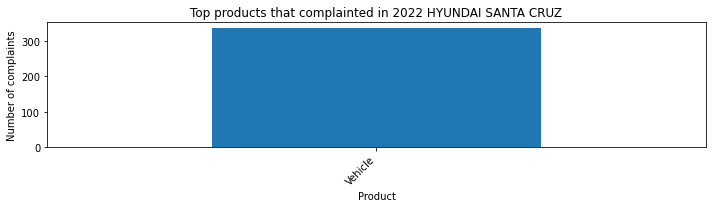

Top components that complainted in 2022 HYUNDAI SANTA CRUZ
POWER TRAIN           88
UNKNOWN OR OTHER      36
POWER TRAIN,ENGINE    28
ENGINE                24
EXTERIOR LIGHTING     14
Name: components, dtype: int64



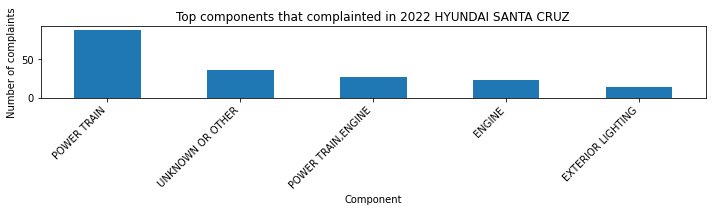

Top products that complainted in 2022 HYUNDAI KONA
Vehicle    164
Tire         2
Name: products_type, dtype: int64



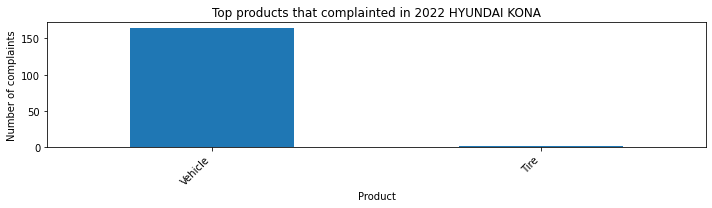

Top components that complainted in 2022 HYUNDAI KONA
ENGINE                                               34
UNKNOWN OR OTHER                                     20
ELECTRICAL SYSTEM                                    12
POWER TRAIN                                          10
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE     8
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


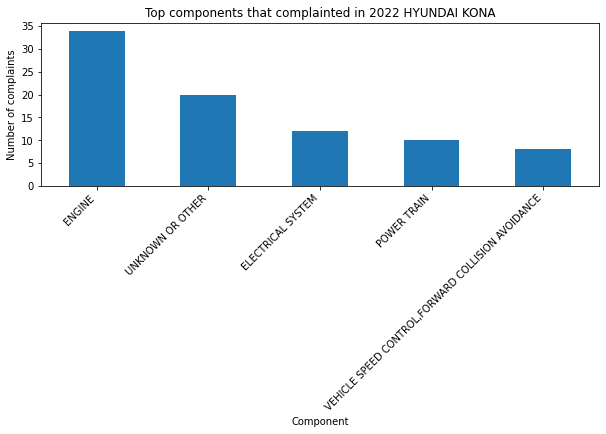

Top products that complainted in 2022 HYUNDAI ELANTRA
Vehicle    139
Name: products_type, dtype: int64



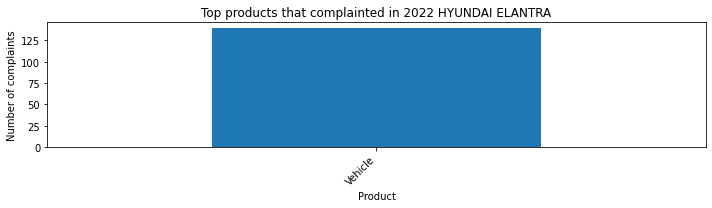

Top components that complainted in 2022 HYUNDAI ELANTRA
SEAT BELTS                     28
FORWARD COLLISION AVOIDANCE    11
UNKNOWN OR OTHER               10
ELECTRICAL SYSTEM              10
POWER TRAIN                     9
Name: components, dtype: int64



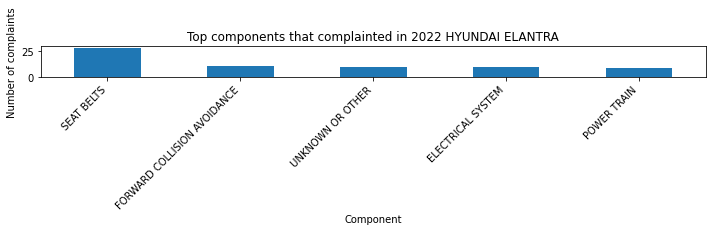

Top products that complainted in 2022 HYUNDAI SONATA
Vehicle    92
Tire        1
Name: products_type, dtype: int64



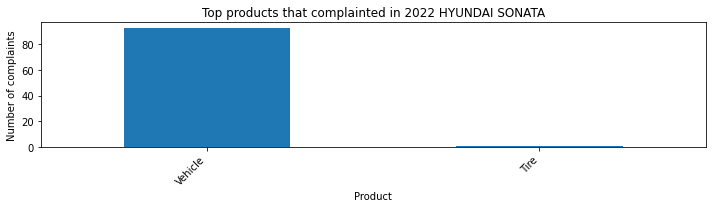

Top components that complainted in 2022 HYUNDAI SONATA
ELECTRICAL SYSTEM         12
UNKNOWN OR OTHER          10
POWER TRAIN                9
FUEL/PROPULSION SYSTEM     7
ENGINE                     5
Name: components, dtype: int64



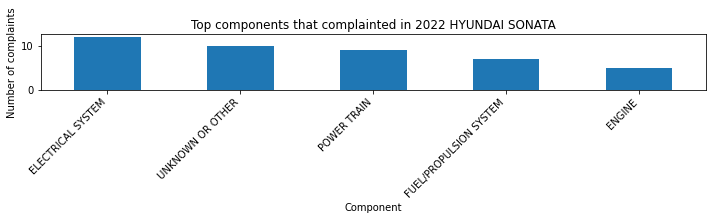

Top products that complainted in 2022 HYUNDAI ELANTRA HYBRID
Vehicle    65
Name: products_type, dtype: int64



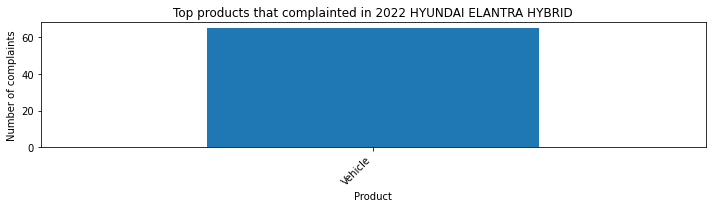

Top components that complainted in 2022 HYUNDAI ELANTRA HYBRID
POWER TRAIN                                   7
VEHICLE SPEED CONTROL                         6
SEAT BELTS                                    6
FORWARD COLLISION AVOIDANCE                   5
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE    4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


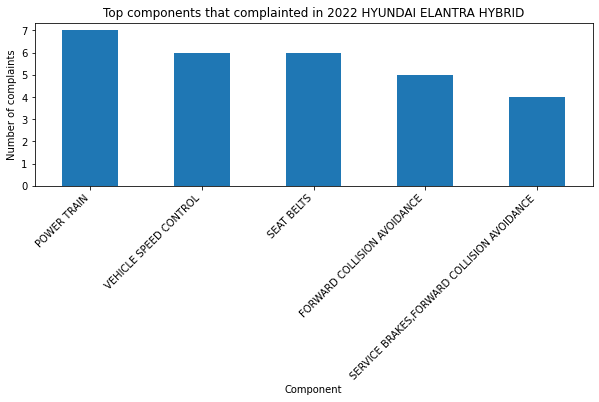


===================== Data Analysis for 2023 =====================


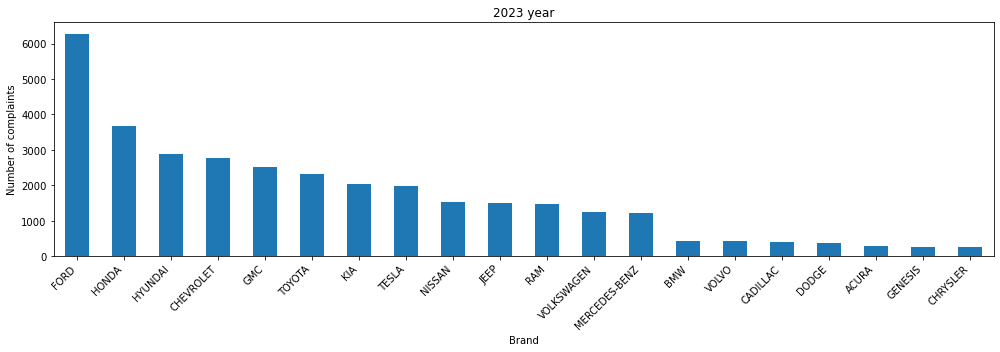

Top 5 Brands with the Most Complaints in 2023:
FORD         6282
HONDA        3683
HYUNDAI      2873
CHEVROLET    2773
GMC          2530
Name: make, dtype: int64


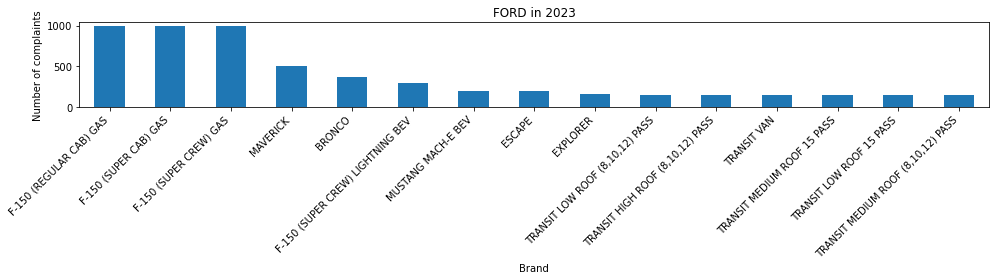

Top 10 models of FORD by number of complaints:
F-150 (REGULAR CAB) GAS             990
F-150 (SUPER CAB) GAS               990
F-150 (SUPER CREW) GAS              990
MAVERICK                            508
BRONCO                              366
F-150 (SUPER CREW) LIGHTNING BEV    297
MUSTANG MACH-E BEV                  198
ESCAPE                              196
EXPLORER                            160
TRANSIT LOW ROOF (8,10,12) PASS     148
Name: model, dtype: int64

Top products that complainted in 2023 FORD F-150 (REGULAR CAB) GAS
Vehicle    984
Tire         6
Name: products_type, dtype: int64



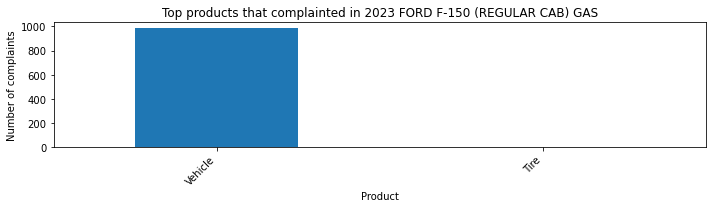

Top components that complainted in 2023 FORD F-150 (REGULAR CAB) GAS
POWER TRAIN                           146
ELECTRICAL SYSTEM                     132
UNKNOWN OR OTHER                       88
SERVICE BRAKES                         30
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     30
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


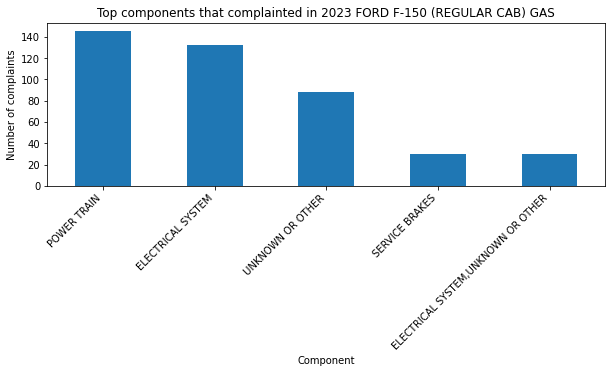

Top products that complainted in 2023 FORD F-150 (SUPER CAB) GAS
Vehicle    984
Tire         6
Name: products_type, dtype: int64



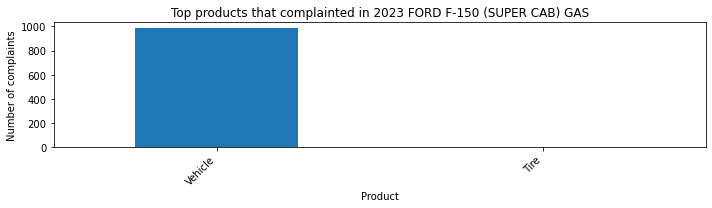

Top components that complainted in 2023 FORD F-150 (SUPER CAB) GAS
POWER TRAIN                           146
ELECTRICAL SYSTEM                     132
UNKNOWN OR OTHER                       88
SERVICE BRAKES                         30
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     30
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


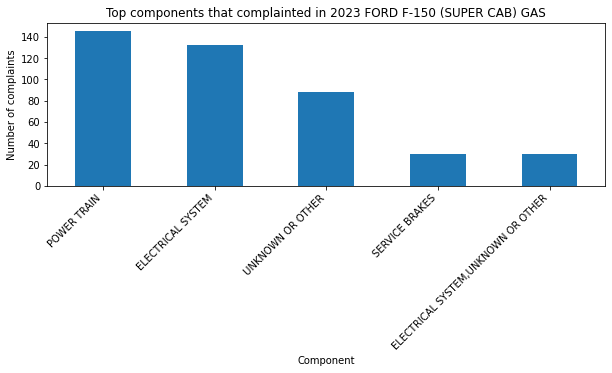

Top products that complainted in 2023 FORD F-150 (SUPER CREW) GAS
Vehicle    984
Tire         6
Name: products_type, dtype: int64



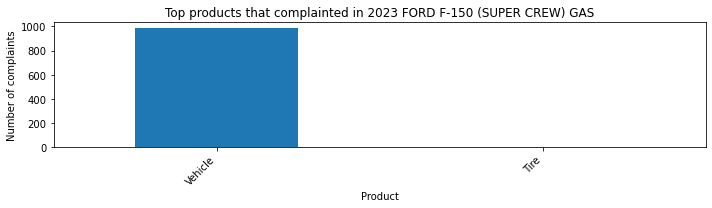

Top components that complainted in 2023 FORD F-150 (SUPER CREW) GAS
POWER TRAIN                           146
ELECTRICAL SYSTEM                     132
UNKNOWN OR OTHER                       88
SERVICE BRAKES                         30
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     30
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


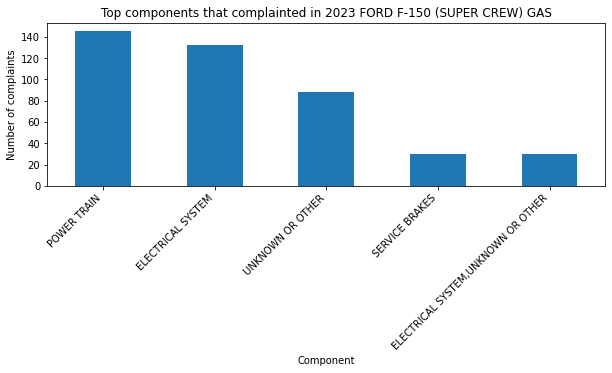

Top products that complainted in 2023 FORD MAVERICK
Vehicle    500
Tire         8
Name: products_type, dtype: int64



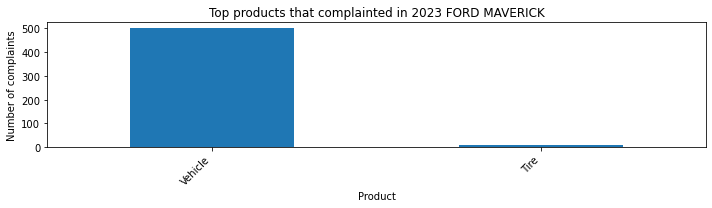

Top components that complainted in 2023 FORD MAVERICK
POWER TRAIN                             38
ELECTRICAL SYSTEM                       38
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE    32
SERVICE BRAKES                          28
UNKNOWN OR OTHER                        28
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


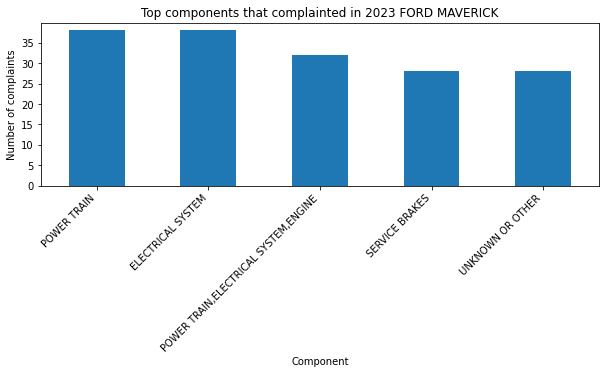

Top products that complainted in 2023 FORD BRONCO
Vehicle      362
Tire           2
Equipment      2
Name: products_type, dtype: int64



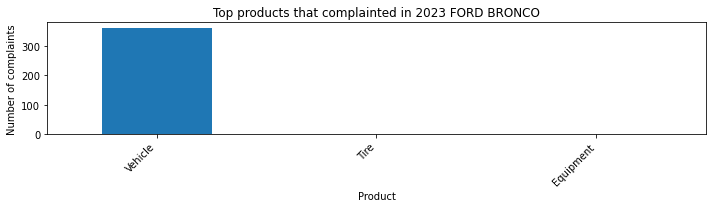

Top components that complainted in 2023 FORD BRONCO
VISIBILITY/WIPER    166
POWER TRAIN          22
SERVICE BRAKES       18
ENGINE               18
SUSPENSION           16
Name: components, dtype: int64



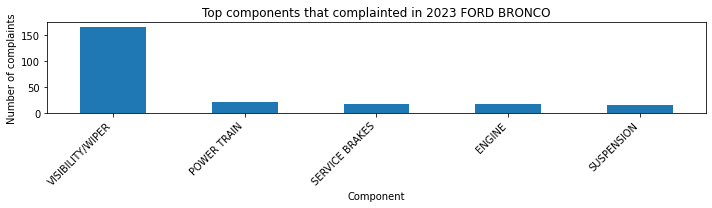

Top products that complainted in 2023 FORD F-150 (SUPER CREW) LIGHTNING BEV
Vehicle    297
Name: products_type, dtype: int64



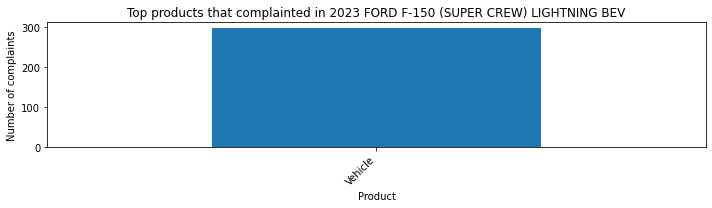

Top components that complainted in 2023 FORD F-150 (SUPER CREW) LIGHTNING BEV
ELECTRICAL SYSTEM                          54
POWER TRAIN                                31
UNKNOWN OR OTHER                           24
EXTERIOR LIGHTING                          20
ELECTRICAL SYSTEM,VEHICLE SPEED CONTROL    11
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


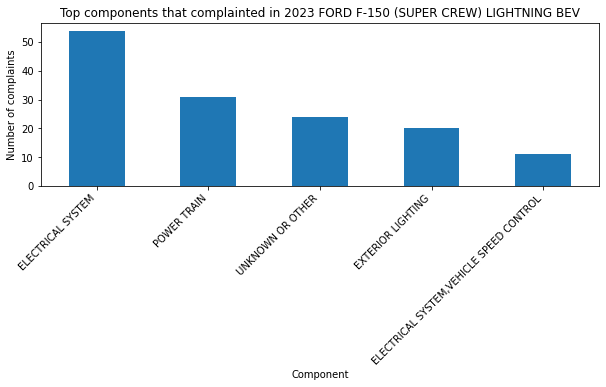

Top products that complainted in 2023 FORD MUSTANG MACH-E BEV
Vehicle    196
Tire         2
Name: products_type, dtype: int64



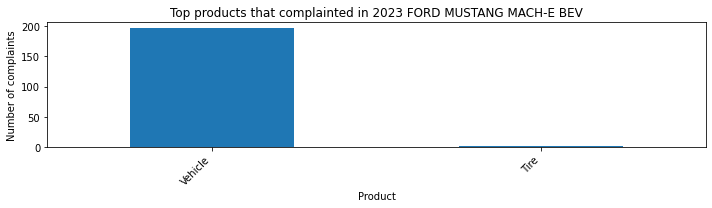

Top components that complainted in 2023 FORD MUSTANG MACH-E BEV
ELECTRICAL SYSTEM                26
UNKNOWN OR OTHER                 16
POWER TRAIN,ELECTRICAL SYSTEM    16
SERVICE BRAKES                   10
VEHICLE SPEED CONTROL             6
Name: components, dtype: int64



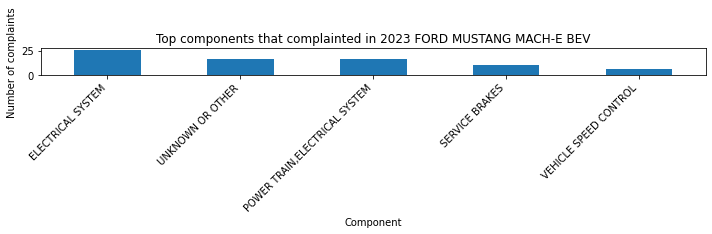

Top products that complainted in 2023 FORD ESCAPE
Vehicle    196
Name: products_type, dtype: int64



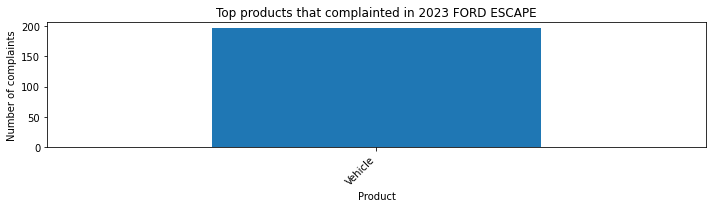

Top components that complainted in 2023 FORD ESCAPE
ELECTRICAL SYSTEM                             52
ENGINE                                        20
UNKNOWN OR OTHER                              16
SEATS                                          8
FORWARD COLLISION AVOIDANCE,LANE DEPARTURE     8
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


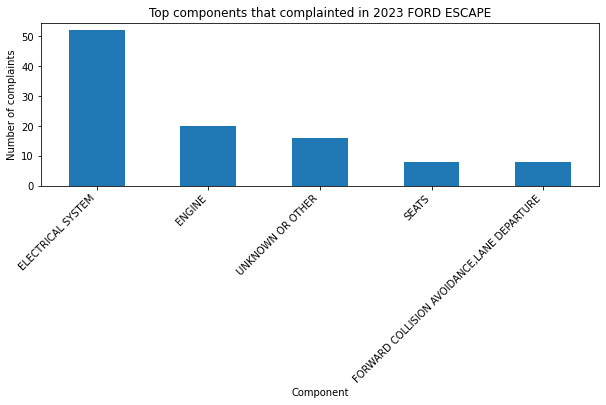

Top products that complainted in 2023 FORD EXPLORER
Vehicle       158
Child Seat      2
Name: products_type, dtype: int64



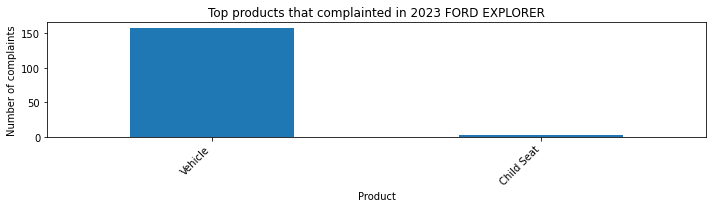

Top components that complainted in 2023 FORD EXPLORER
UNKNOWN OR OTHER        14
STRUCTURE               14
SEAT BELTS               8
BACK OVER PREVENTION     8
ELECTRICAL SYSTEM        8
Name: components, dtype: int64



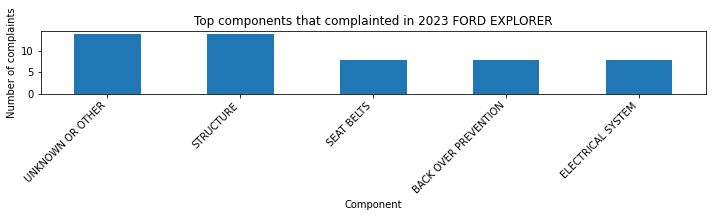

Top products that complainted in 2023 FORD TRANSIT LOW ROOF (8,10,12) PASS
Vehicle    144
Tire         4
Name: products_type, dtype: int64



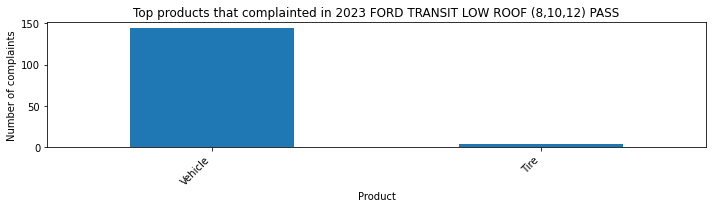

Top components that complainted in 2023 FORD TRANSIT LOW ROOF (8,10,12) PASS
ELECTRICAL SYSTEM       18
POWER TRAIN             18
BACK OVER PREVENTION    18
WHEELS                  12
UNKNOWN OR OTHER        10
Name: components, dtype: int64



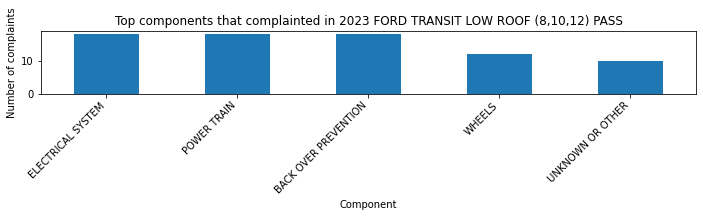

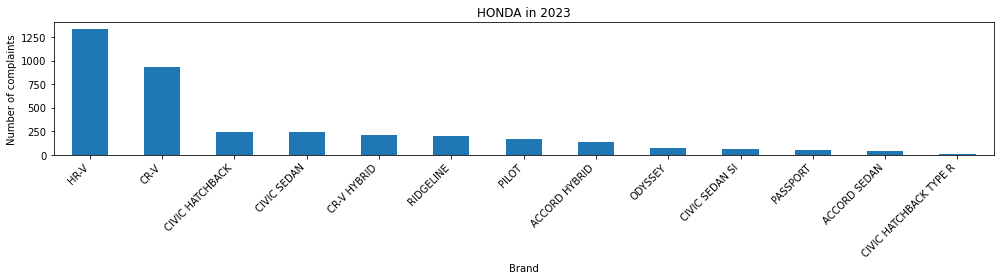

Top 10 models of HONDA by number of complaints:
HR-V               1338
CR-V                930
CIVIC HATCHBACK     240
CIVIC SEDAN         237
CR-V HYBRID         208
RIDGELINE           204
PILOT               164
ACCORD HYBRID       138
ODYSSEY              72
CIVIC SEDAN SI       57
Name: model, dtype: int64

Top products that complainted in 2023 HONDA HR-V
Vehicle    1334
Tire          4
Name: products_type, dtype: int64



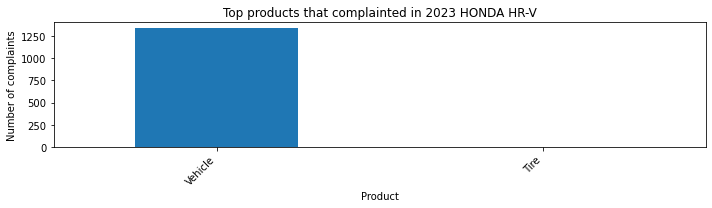

Top components that complainted in 2023 HONDA HR-V
VISIBILITY/WIPER                     502
UNKNOWN OR OTHER                     280
VISIBILITY                           158
STEERING                             118
UNKNOWN OR OTHER,VISIBILITY/WIPER     88
Name: components, dtype: int64



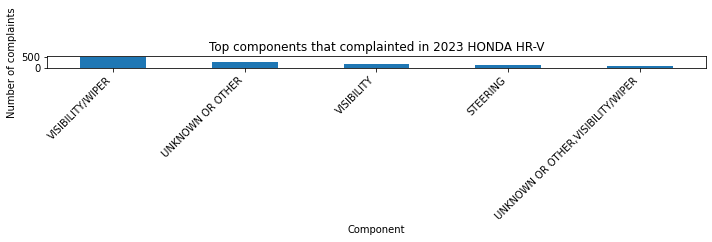

Top products that complainted in 2023 HONDA CR-V
Vehicle    930
Name: products_type, dtype: int64



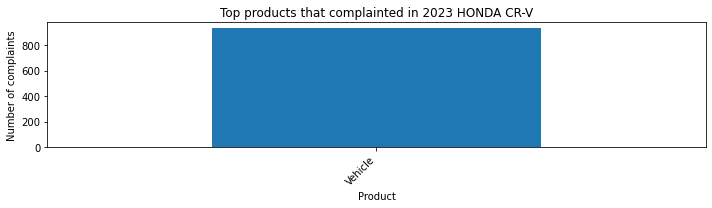

Top components that complainted in 2023 HONDA CR-V
STEERING                       554
VISIBILITY/WIPER                32
STRUCTURE                       28
STEERING,LANE DEPARTURE         26
FORWARD COLLISION AVOIDANCE     22
Name: components, dtype: int64



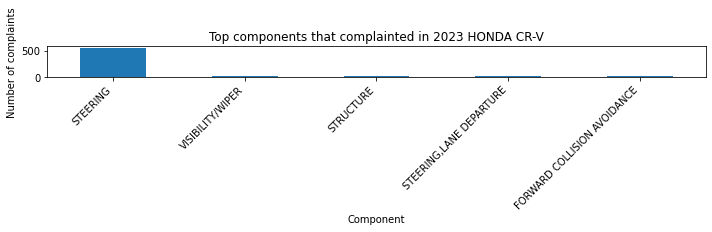

Top products that complainted in 2023 HONDA CIVIC HATCHBACK
Vehicle    238
Tire         2
Name: products_type, dtype: int64



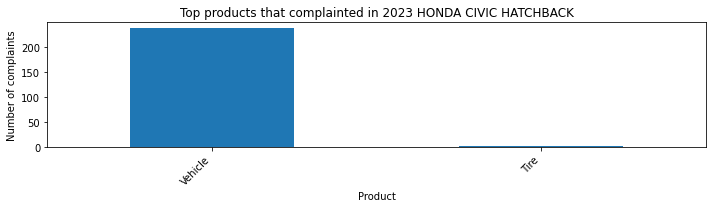

Top components that complainted in 2023 HONDA CIVIC HATCHBACK
STEERING                   163
STEERING,LANE DEPARTURE      8
UNKNOWN OR OTHER             5
TIRES                        4
ELECTRICAL SYSTEM            4
Name: components, dtype: int64



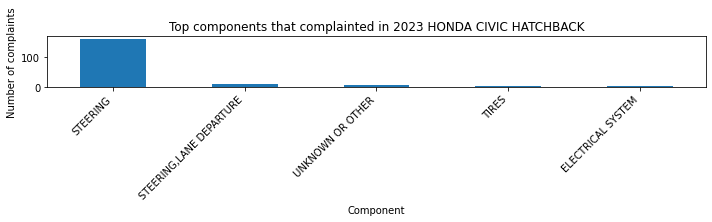

Top products that complainted in 2023 HONDA CIVIC SEDAN
Vehicle    235
Tire         2
Name: products_type, dtype: int64



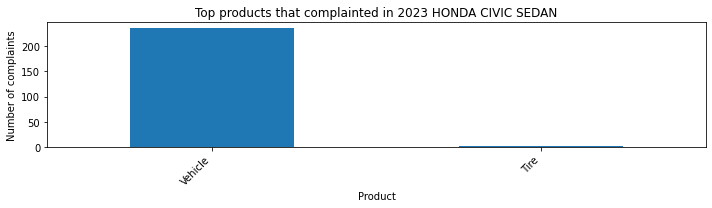

Top components that complainted in 2023 HONDA CIVIC SEDAN
STEERING                   161
STEERING,LANE DEPARTURE      8
UNKNOWN OR OTHER             5
TIRES                        4
ELECTRICAL SYSTEM            4
Name: components, dtype: int64



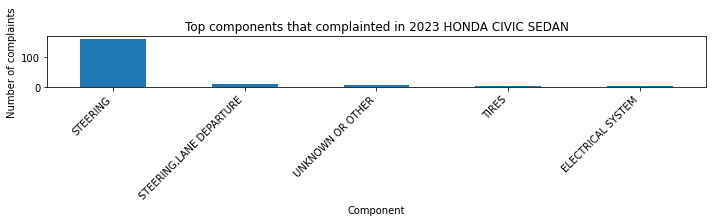

Top products that complainted in 2023 HONDA CR-V HYBRID
Vehicle    208
Name: products_type, dtype: int64



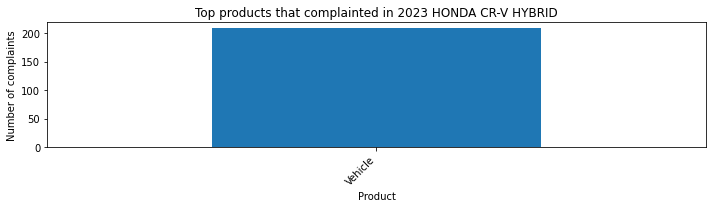

Top components that complainted in 2023 HONDA CR-V HYBRID
STEERING                          106
STEERING,LANE DEPARTURE            12
FUEL SYSTEM, GASOLINE              12
UNKNOWN OR OTHER                    8
STEERING,FUEL SYSTEM, GASOLINE      6
Name: components, dtype: int64



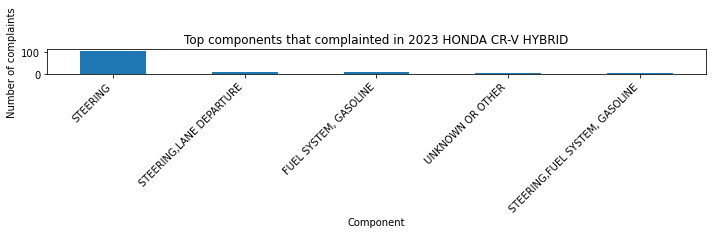

Top products that complainted in 2023 HONDA RIDGELINE
Vehicle    204
Name: products_type, dtype: int64



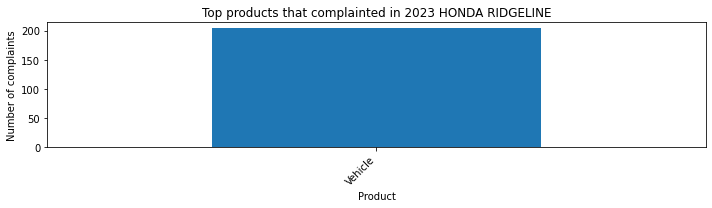

Top components that complainted in 2023 HONDA RIDGELINE
EXTERIOR LIGHTING       66
UNKNOWN OR OTHER        24
ELECTRICAL SYSTEM       22
ENGINE                  14
BACK OVER PREVENTION    12
Name: components, dtype: int64



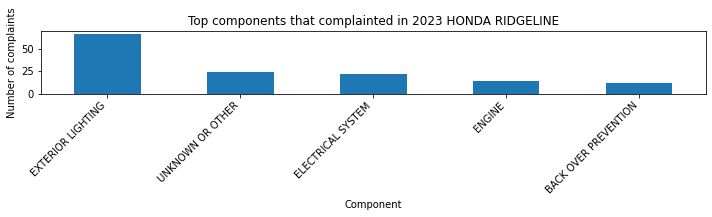

Top products that complainted in 2023 HONDA PILOT
Vehicle    164
Name: products_type, dtype: int64



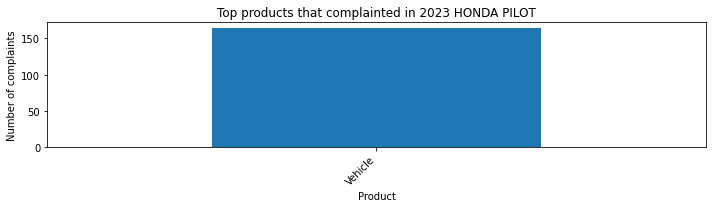

Top components that complainted in 2023 HONDA PILOT
ELECTRICAL SYSTEM                                               16
UNKNOWN OR OTHER                                                14
STEERING                                                        12
VISIBILITY                                                      10
ELECTRICAL SYSTEM,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


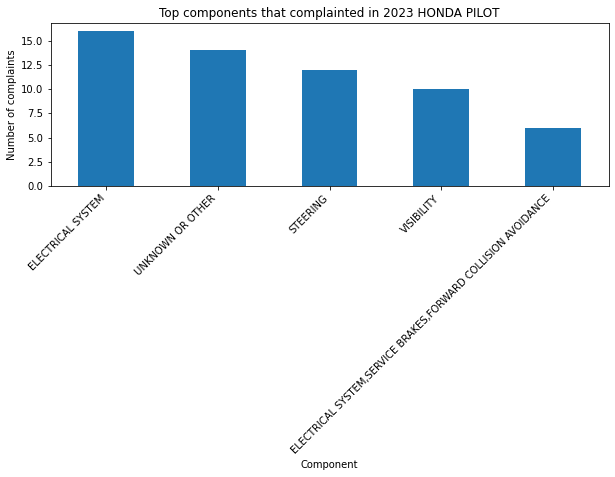

Top products that complainted in 2023 HONDA ACCORD HYBRID
Vehicle    137
Tire         1
Name: products_type, dtype: int64



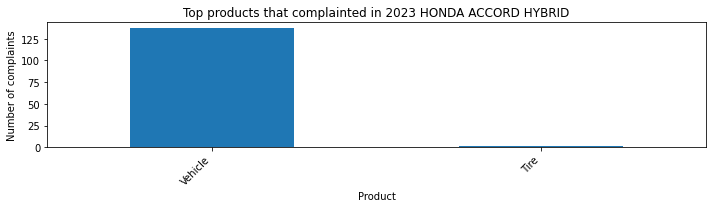

Top components that complainted in 2023 HONDA ACCORD HYBRID
UNKNOWN OR OTHER                              11
ELECTRICAL SYSTEM,SERVICE BRAKES,ENGINE        7
STEERING                                       7
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     6
SERVICE BRAKES                                 6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


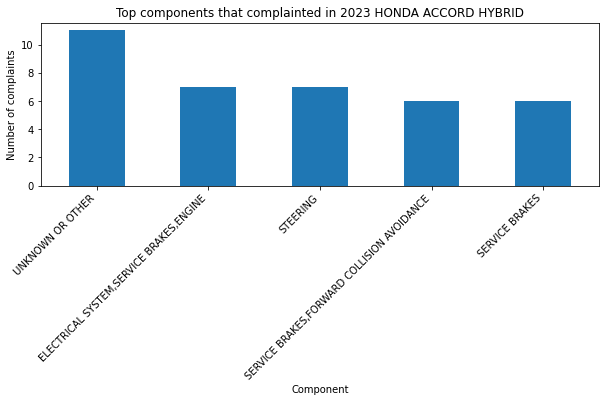

Top products that complainted in 2023 HONDA ODYSSEY
Vehicle       69
Child Seat     3
Name: products_type, dtype: int64



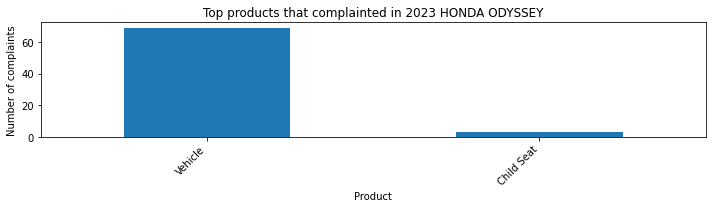

Top components that complainted in 2023 HONDA ODYSSEY
FORWARD COLLISION AVOIDANCE    10
ELECTRICAL SYSTEM               4
STRUCTURE                       4
UNKNOWN OR OTHER                4
SEAT BELTS                      3
Name: components, dtype: int64



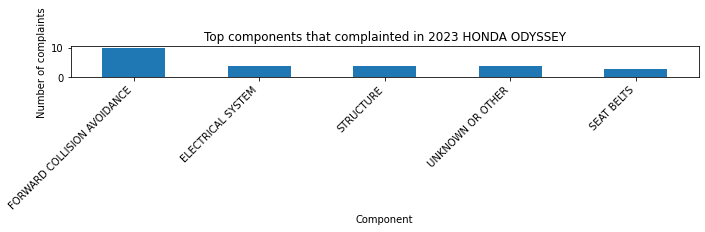

Top products that complainted in 2023 HONDA CIVIC SEDAN SI
Vehicle    57
Name: products_type, dtype: int64



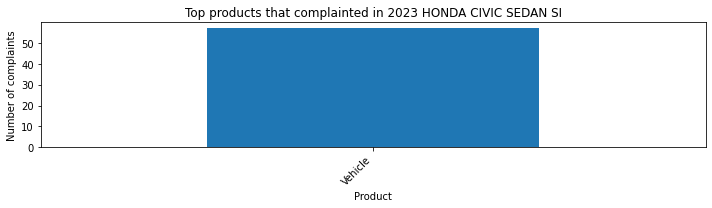

Top components that complainted in 2023 HONDA CIVIC SEDAN SI
STEERING                                49
STEERING,LANE DEPARTURE                  5
UNKNOWN OR OTHER                         1
STEERING,FORWARD COLLISION AVOIDANCE     1
WHEELS                                   1
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


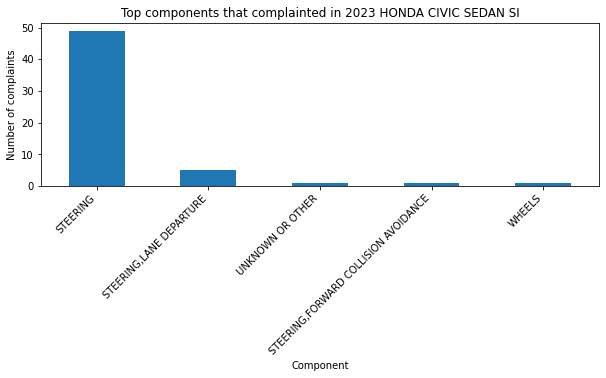

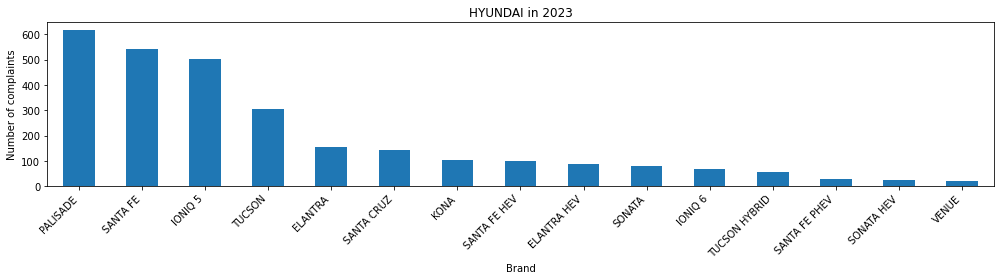

Top 10 models of HYUNDAI by number of complaints:
PALISADE        616
SANTA FE        540
IONIQ 5         504
TUCSON          306
ELANTRA         153
SANTA CRUZ      144
KONA            104
SANTA FE HEV    100
ELANTRA HEV      89
SONATA           81
Name: model, dtype: int64

Top products that complainted in 2023 HYUNDAI PALISADE
Vehicle       614
Child Seat      2
Name: products_type, dtype: int64



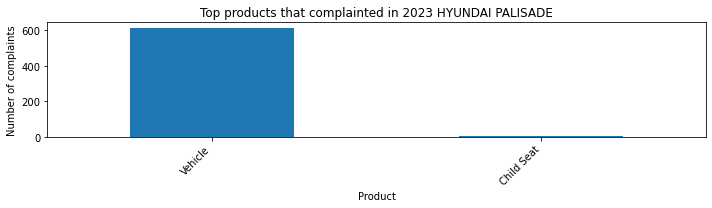

Top components that complainted in 2023 HYUNDAI PALISADE
SERVICE BRAKES      98
VISIBILITY/WIPER    80
UNKNOWN OR OTHER    58
SEAT BELTS          54
POWER TRAIN         30
Name: components, dtype: int64



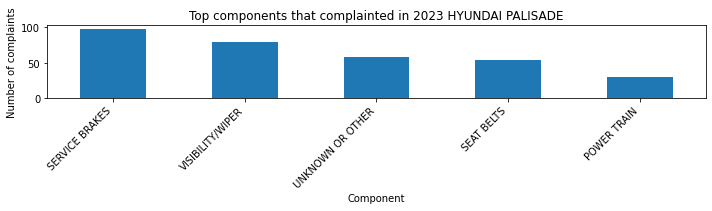

Top products that complainted in 2023 HYUNDAI SANTA FE
Vehicle       534
Tire            4
Child Seat      2
Name: products_type, dtype: int64



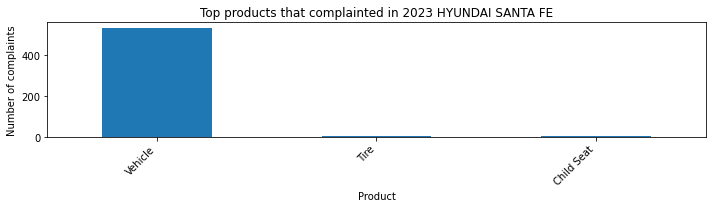

Top components that complainted in 2023 HYUNDAI SANTA FE
UNKNOWN OR OTHER                             68
POWER TRAIN                                  38
ENGINE                                       34
FORWARD COLLISION AVOIDANCE                  30
POWER TRAIN,ENGINE,FUEL/PROPULSION SYSTEM    22
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


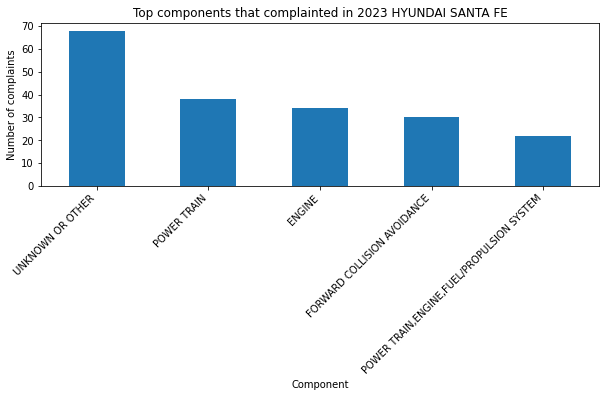

Top products that complainted in 2023 HYUNDAI IONIQ 5
Vehicle    492
Tire        12
Name: products_type, dtype: int64



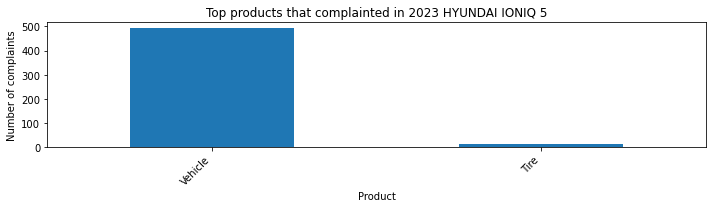

Top components that complainted in 2023 HYUNDAI IONIQ 5
ELECTRICAL SYSTEM                                       176
ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM                 38
UNKNOWN OR OTHER                                         28
TIRES                                                    24
POWER TRAIN,ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM     18
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


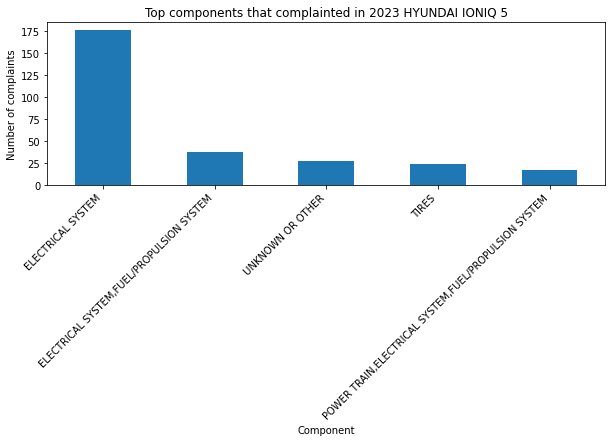

Top products that complainted in 2023 HYUNDAI TUCSON
Vehicle    306
Name: products_type, dtype: int64



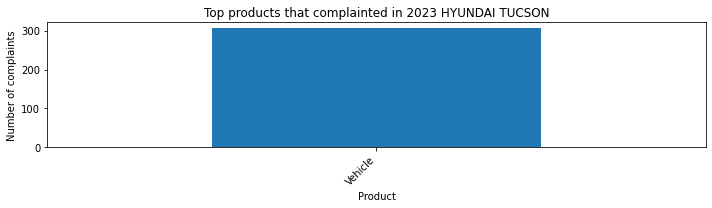

Top components that complainted in 2023 HYUNDAI TUCSON
UNKNOWN OR OTHER               30
ENGINE                         28
FORWARD COLLISION AVOIDANCE    20
FUEL/PROPULSION SYSTEM         20
ELECTRICAL SYSTEM              16
Name: components, dtype: int64



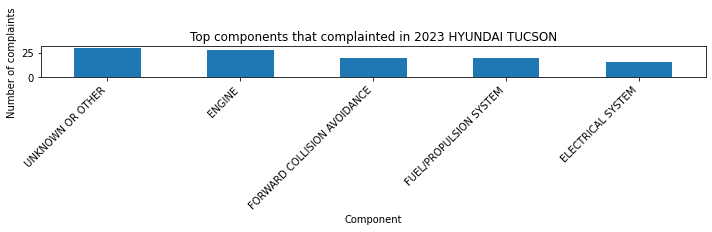

Top products that complainted in 2023 HYUNDAI ELANTRA
Vehicle    149
Tire         4
Name: products_type, dtype: int64



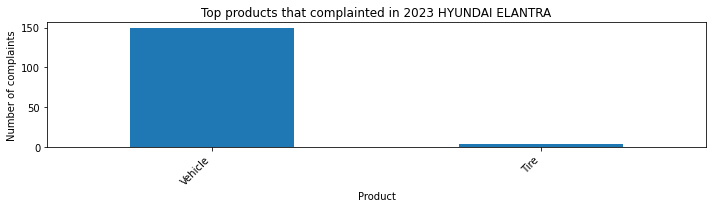

Top components that complainted in 2023 HYUNDAI ELANTRA
FORWARD COLLISION AVOIDANCE                   19
UNKNOWN OR OTHER                              15
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     9
ELECTRICAL SYSTEM                              9
ENGINE                                         8
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


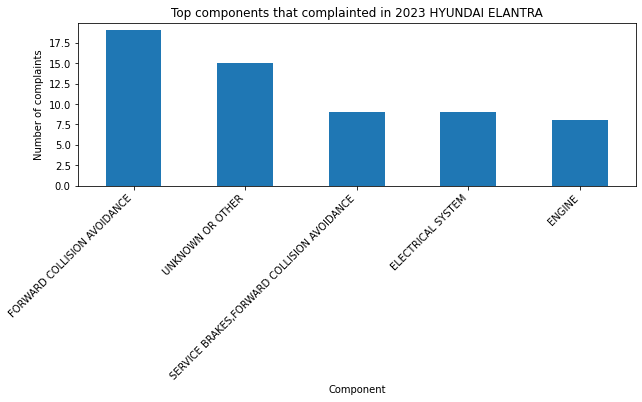

Top products that complainted in 2023 HYUNDAI SANTA CRUZ
Vehicle    142
Tire         2
Name: products_type, dtype: int64



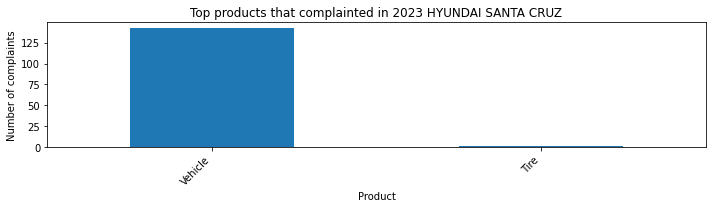

Top components that complainted in 2023 HYUNDAI SANTA CRUZ
POWER TRAIN           34
ENGINE                12
UNKNOWN OR OTHER       8
POWER TRAIN,ENGINE     6
TRAILER HITCHES        6
Name: components, dtype: int64



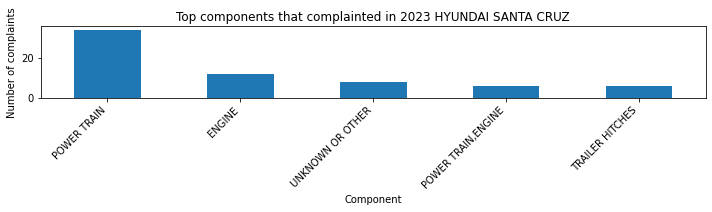

Top products that complainted in 2023 HYUNDAI KONA
Vehicle    102
Tire         2
Name: products_type, dtype: int64



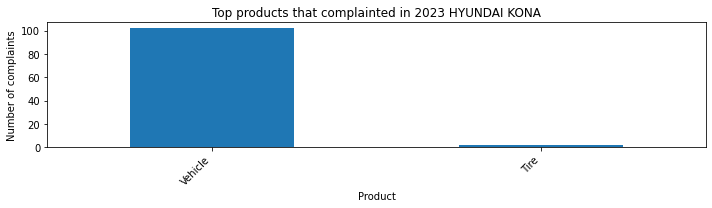

Top components that complainted in 2023 HYUNDAI KONA
ELECTRICAL SYSTEM                     20
UNKNOWN OR OTHER                      10
POWER TRAIN                            8
FORWARD COLLISION AVOIDANCE            6
ELECTRICAL SYSTEM,UNKNOWN OR OTHER     6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


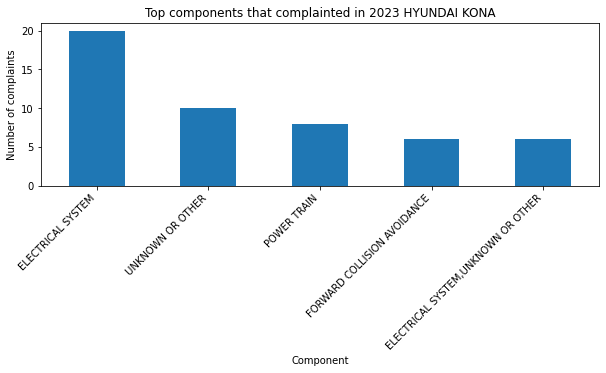

Top products that complainted in 2023 HYUNDAI SANTA FE HEV
Vehicle    99
Tire        1
Name: products_type, dtype: int64



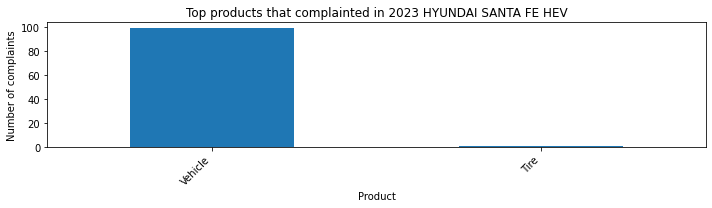

Top components that complainted in 2023 HYUNDAI SANTA FE HEV
UNKNOWN OR OTHER                             9
FORWARD COLLISION AVOIDANCE                  9
POWER TRAIN,ENGINE,FUEL/PROPULSION SYSTEM    6
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE         5
ENGINE                                       5
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


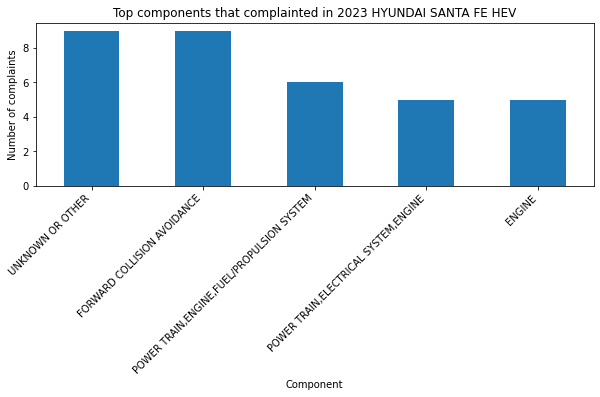

Top products that complainted in 2023 HYUNDAI ELANTRA HEV
Vehicle    89
Name: products_type, dtype: int64



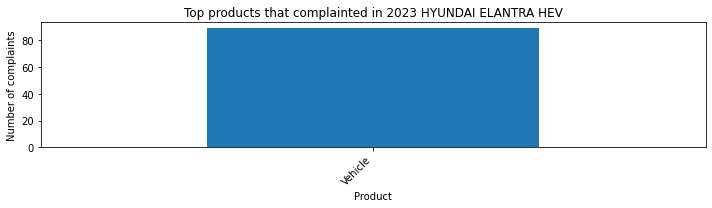

Top components that complainted in 2023 HYUNDAI ELANTRA HEV
FORWARD COLLISION AVOIDANCE                          14
UNKNOWN OR OTHER                                     10
ELECTRICAL SYSTEM                                     6
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE            6
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


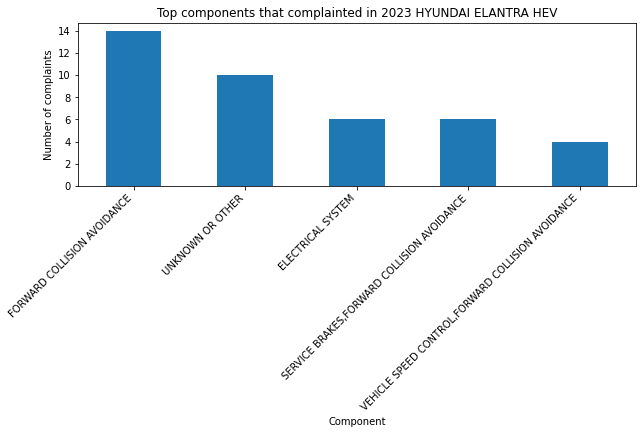

Top products that complainted in 2023 HYUNDAI SONATA
Vehicle    81
Name: products_type, dtype: int64



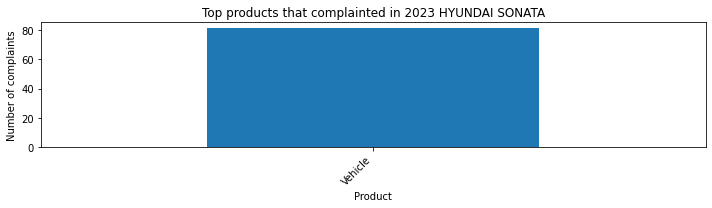

Top components that complainted in 2023 HYUNDAI SONATA
FUEL/PROPULSION SYSTEM         16
ENGINE                         10
POWER TRAIN                     6
FORWARD COLLISION AVOIDANCE     5
ELECTRICAL SYSTEM               3
Name: components, dtype: int64



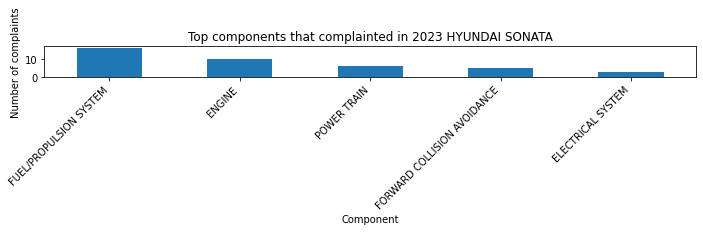

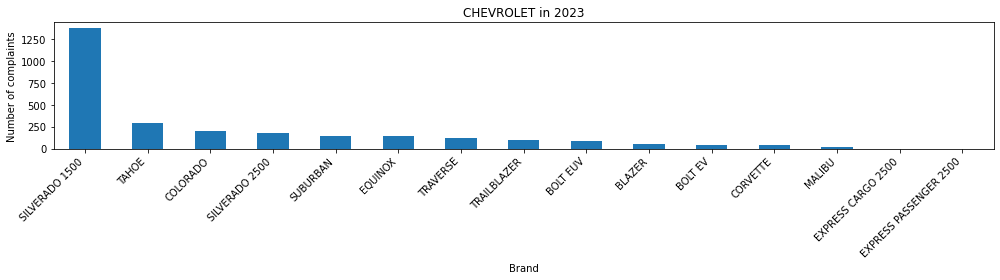

Top 10 models of CHEVROLET by number of complaints:
SILVERADO 1500    1368
TAHOE              288
COLORADO           202
SILVERADO 2500     174
SUBURBAN           146
EQUINOX            142
TRAVERSE           118
TRAILBLAZER         98
BOLT EUV            86
BLAZER              52
Name: model, dtype: int64

Top products that complainted in 2023 CHEVROLET SILVERADO 1500
Vehicle    1368
Name: products_type, dtype: int64



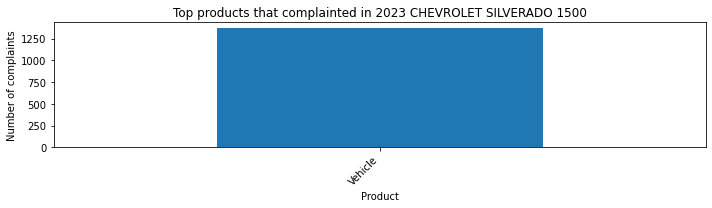

Top components that complainted in 2023 CHEVROLET SILVERADO 1500
ENGINE                       318
POWER TRAIN                  216
UNKNOWN OR OTHER             114
ENGINE AND ENGINE COOLING     78
ELECTRICAL SYSTEM             72
Name: components, dtype: int64



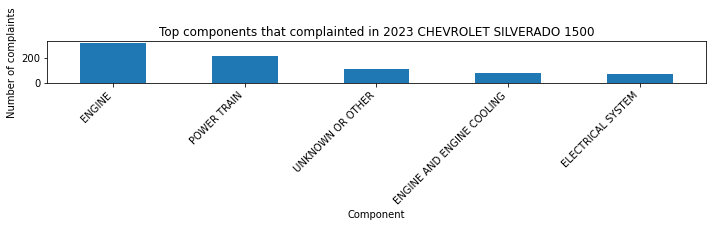

Top products that complainted in 2023 CHEVROLET TAHOE
Vehicle    286
Tire         2
Name: products_type, dtype: int64



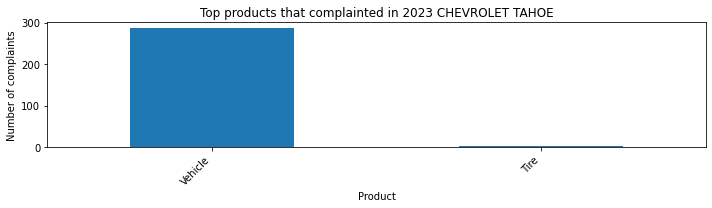

Top components that complainted in 2023 CHEVROLET TAHOE
ENGINE                       98
POWER TRAIN                  38
ENGINE AND ENGINE COOLING    20
ELECTRICAL SYSTEM,ENGINE     12
ELECTRICAL SYSTEM            12
Name: components, dtype: int64



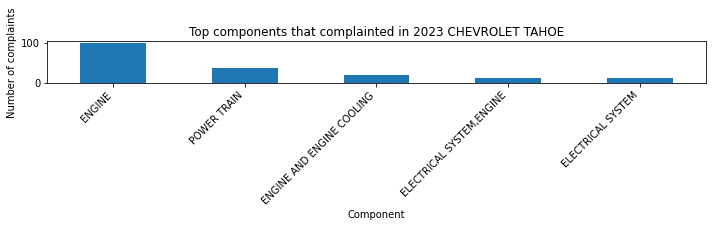

Top products that complainted in 2023 CHEVROLET COLORADO
Vehicle    202
Name: products_type, dtype: int64



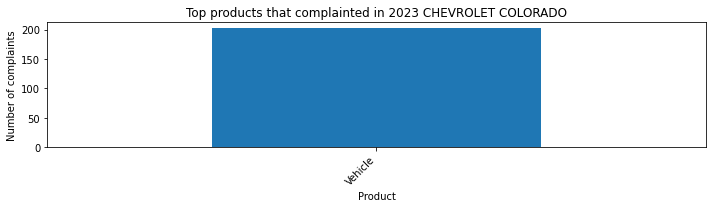

Top components that complainted in 2023 CHEVROLET COLORADO
FORWARD COLLISION AVOIDANCE                      36
ELECTRICAL SYSTEM,FORWARD COLLISION AVOIDANCE    20
ELECTRICAL SYSTEM                                18
SERVICE BRAKES                                   14
UNKNOWN OR OTHER                                 12
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


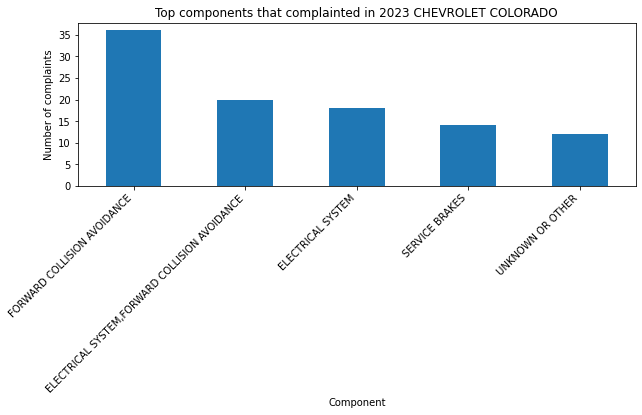

Top products that complainted in 2023 CHEVROLET SILVERADO 2500
Vehicle    174
Name: products_type, dtype: int64



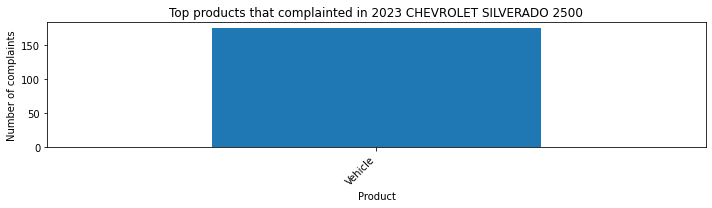

Top components that complainted in 2023 CHEVROLET SILVERADO 2500
POWER TRAIN                42
ELECTRICAL SYSTEM          24
LATCHES/LOCKS/LINKAGES     12
STRUCTURE                   6
UNKNOWN OR OTHER,ENGINE     6
Name: components, dtype: int64



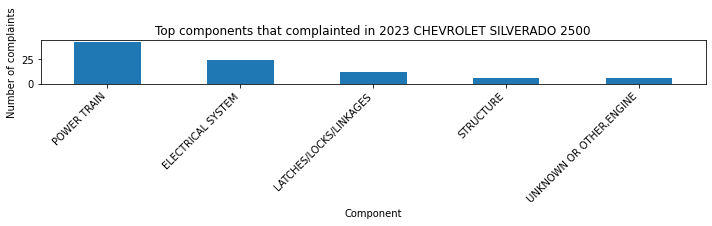

Top products that complainted in 2023 CHEVROLET SUBURBAN
Vehicle    144
Tire         2
Name: products_type, dtype: int64



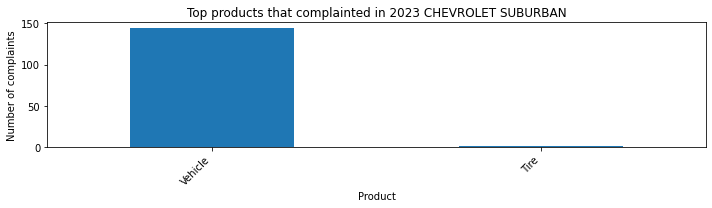

Top components that complainted in 2023 CHEVROLET SUBURBAN
ENGINE                66
UNKNOWN OR OTHER      12
POWER TRAIN,ENGINE     6
POWER TRAIN            6
ELECTRICAL SYSTEM      6
Name: components, dtype: int64



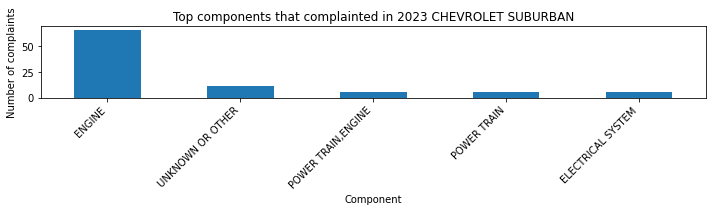

Top products that complainted in 2023 CHEVROLET EQUINOX
Vehicle    142
Name: products_type, dtype: int64



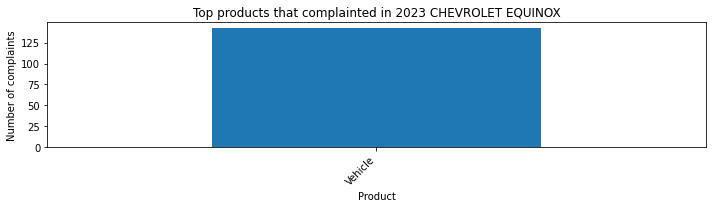

Top components that complainted in 2023 CHEVROLET EQUINOX
FUEL/PROPULSION SYSTEM     42
UNKNOWN OR OTHER           16
SERVICE BRAKES             14
ELECTRICAL SYSTEM          10
STEERING,SERVICE BRAKES     8
Name: components, dtype: int64



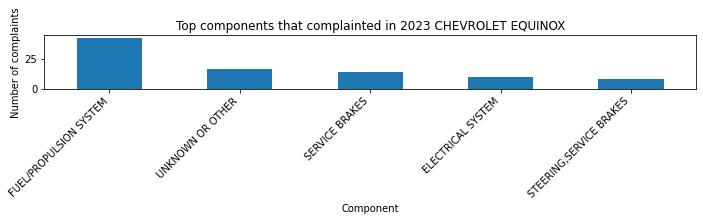

Top products that complainted in 2023 CHEVROLET TRAVERSE
Vehicle    118
Name: products_type, dtype: int64



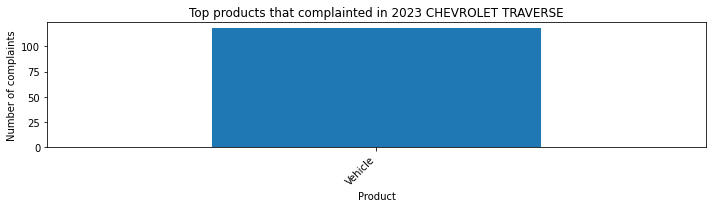

Top components that complainted in 2023 CHEVROLET TRAVERSE
POWER TRAIN          22
ENGINE               18
ELECTRICAL SYSTEM    12
UNKNOWN OR OTHER      8
EXTERIOR LIGHTING     6
Name: components, dtype: int64



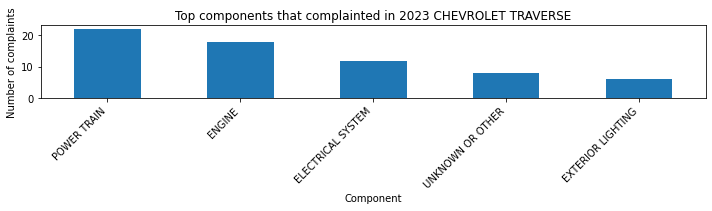

Top products that complainted in 2023 CHEVROLET TRAILBLAZER
Vehicle       96
Child Seat     2
Name: products_type, dtype: int64



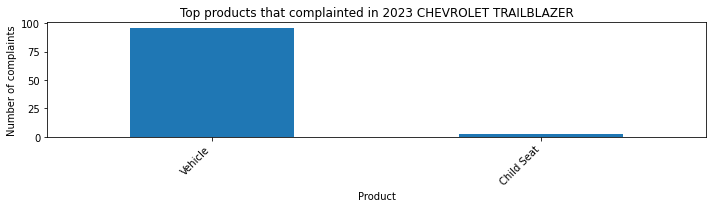

Top components that complainted in 2023 CHEVROLET TRAILBLAZER
SERVICE BRAKES       20
ENGINE               14
UNKNOWN OR OTHER     10
POWER TRAIN           8
ELECTRICAL SYSTEM     4
Name: components, dtype: int64



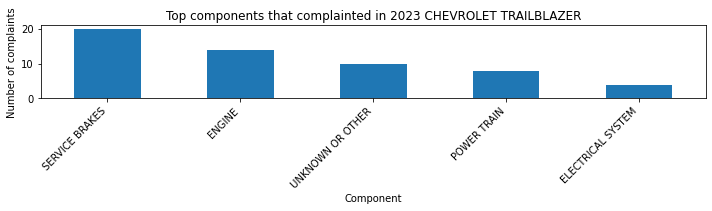

Top products that complainted in 2023 CHEVROLET BOLT EUV
Vehicle    86
Name: products_type, dtype: int64



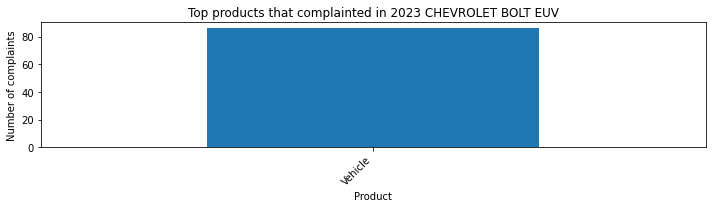

Top components that complainted in 2023 CHEVROLET BOLT EUV
FORWARD COLLISION AVOIDANCE    11
STEERING                        8
ELECTRICAL SYSTEM               8
EXTERIOR LIGHTING               7
UNKNOWN OR OTHER                5
Name: components, dtype: int64



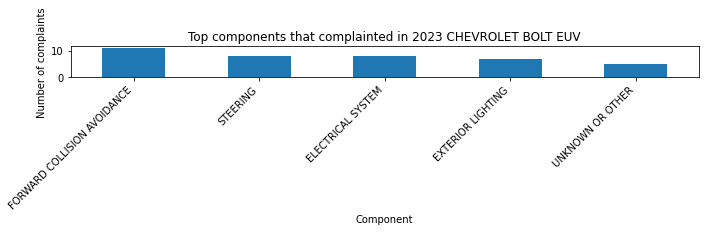

Top products that complainted in 2023 CHEVROLET BLAZER
Vehicle    52
Name: products_type, dtype: int64



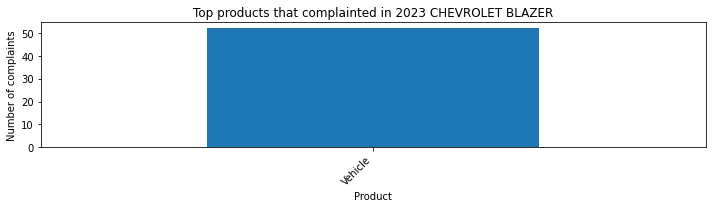

Top components that complainted in 2023 CHEVROLET BLAZER
POWER TRAIN                    10
EXTERIOR LIGHTING               6
ENGINE                          4
SERVICE BRAKES                  4
FORWARD COLLISION AVOIDANCE     4
Name: components, dtype: int64



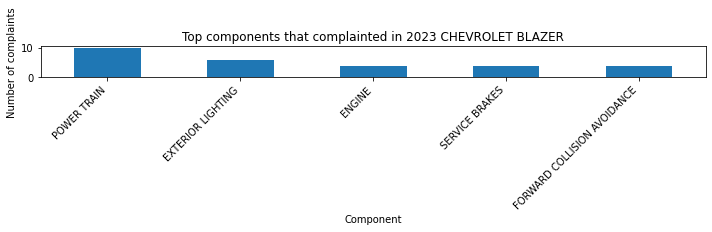

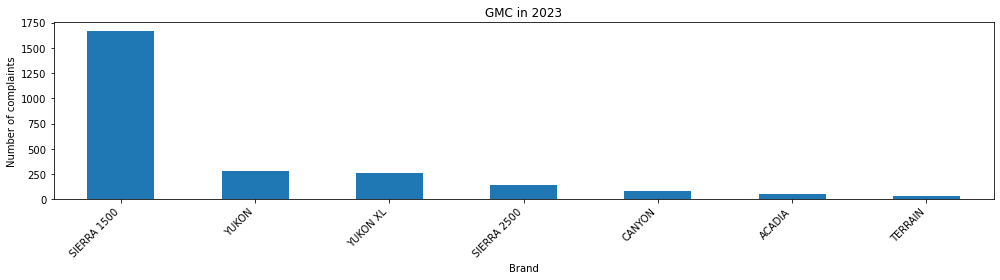

Top 10 models of GMC by number of complaints:
SIERRA 1500    1668
YUKON           280
YUKON XL        262
SIERRA 2500     144
CANYON           86
ACADIA           54
TERRAIN          36
Name: model, dtype: int64

Top products that complainted in 2023 GMC SIERRA 1500
Vehicle    1668
Name: products_type, dtype: int64



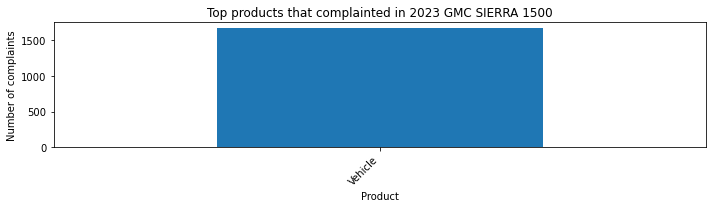

Top components that complainted in 2023 GMC SIERRA 1500
ENGINE                       534
POWER TRAIN                  168
STRUCTURE                    162
ENGINE AND ENGINE COOLING    108
UNKNOWN OR OTHER              96
Name: components, dtype: int64



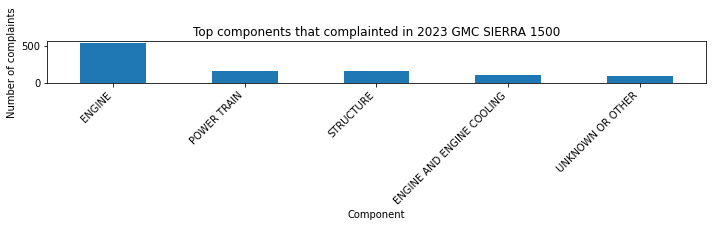

Top products that complainted in 2023 GMC YUKON
Vehicle       278
Child Seat      2
Name: products_type, dtype: int64



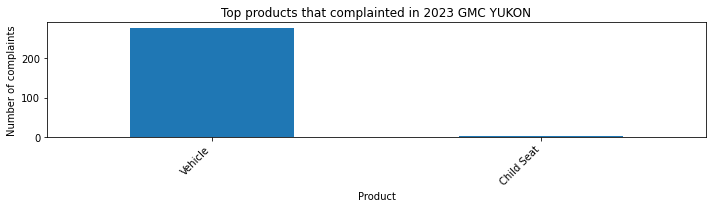

Top components that complainted in 2023 GMC YUKON
ENGINE                       138
POWER TRAIN                   20
ENGINE AND ENGINE COOLING     16
POWER TRAIN,ENGINE            12
ELECTRICAL SYSTEM             10
Name: components, dtype: int64



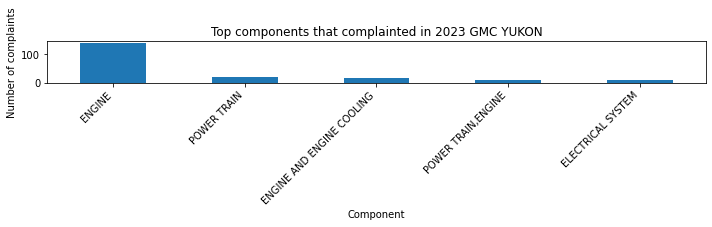

Top products that complainted in 2023 GMC YUKON XL
Vehicle       258
Equipment       2
Child Seat      2
Name: products_type, dtype: int64



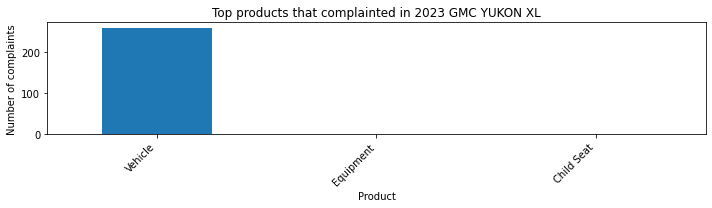

Top components that complainted in 2023 GMC YUKON XL
ENGINE                       112
ENGINE AND ENGINE COOLING     20
POWER TRAIN                   16
VISIBILITY/WIPER              10
UNKNOWN OR OTHER              10
Name: components, dtype: int64



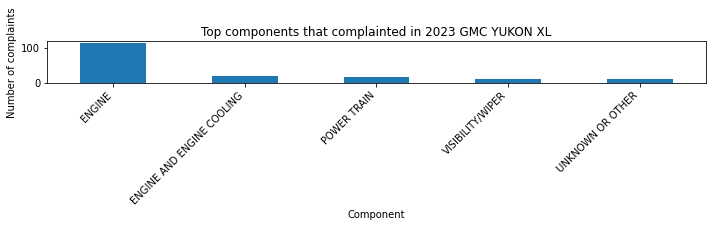

Top products that complainted in 2023 GMC SIERRA 2500
Vehicle    144
Name: products_type, dtype: int64



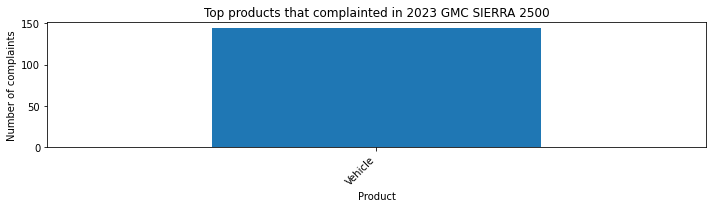

Top components that complainted in 2023 GMC SIERRA 2500
POWER TRAIN                             78
POWER TRAIN,VEHICLE SPEED CONTROL        6
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     6
SERVICE BRAKES                           6
POWER TRAIN,ELECTRICAL SYSTEM            6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


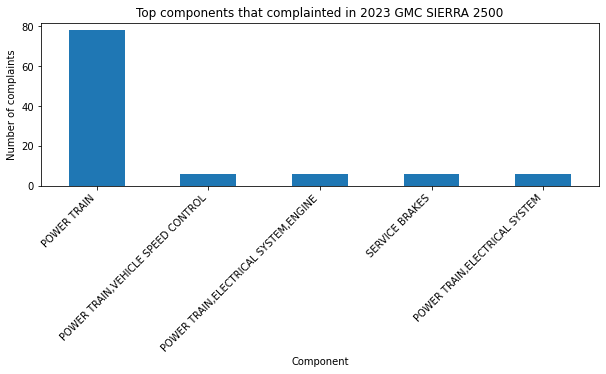

Top products that complainted in 2023 GMC CANYON
Vehicle    86
Name: products_type, dtype: int64



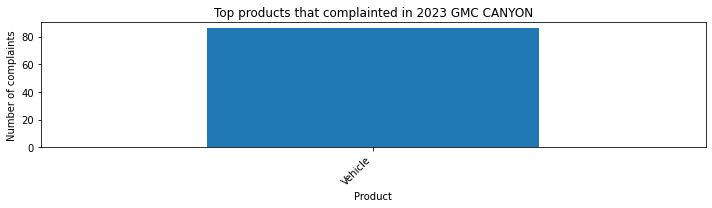

Top components that complainted in 2023 GMC CANYON
ELECTRICAL SYSTEM,FORWARD COLLISION AVOIDANCE    18
FORWARD COLLISION AVOIDANCE                       8
STRUCTURE                                         6
STEERING,VEHICLE SPEED CONTROL,SERVICE BRAKES     4
POWER TRAIN,ENGINE                                4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


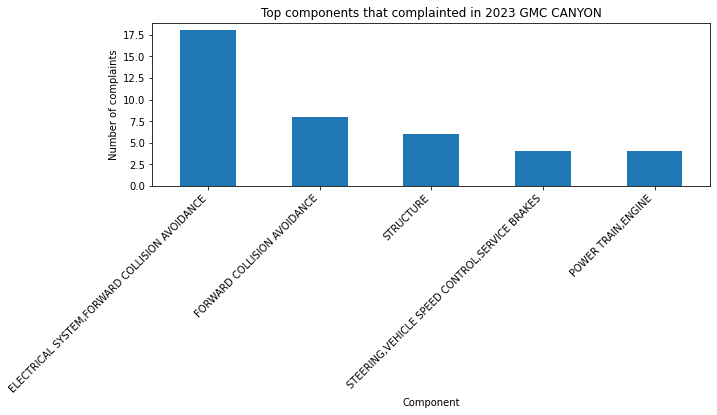

Top products that complainted in 2023 GMC ACADIA
Vehicle    54
Name: products_type, dtype: int64



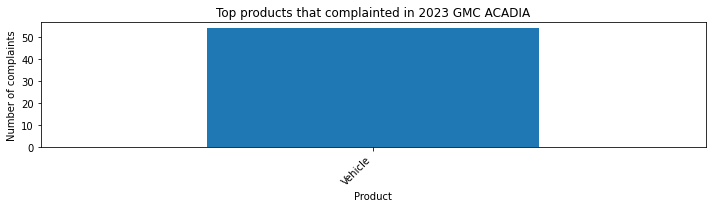

Top components that complainted in 2023 GMC ACADIA
POWER TRAIN                             8
ELECTRICAL SYSTEM                       4
UNKNOWN OR OTHER                        4
ENGINE                                  4
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE    2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


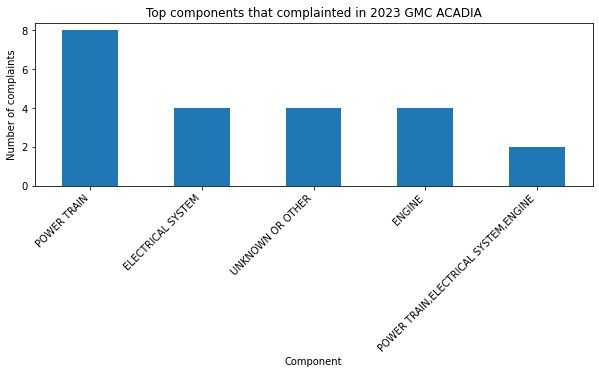

Top products that complainted in 2023 GMC TERRAIN
Vehicle    36
Name: products_type, dtype: int64



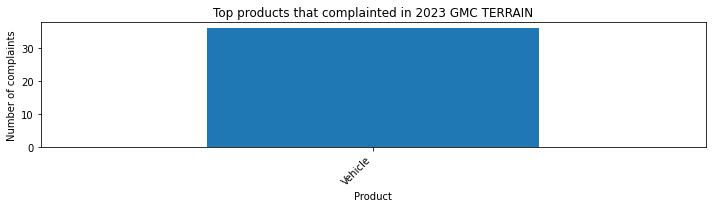

Top components that complainted in 2023 GMC TERRAIN
FUEL/PROPULSION SYSTEM                                    6
ELECTRICAL SYSTEM,ENGINE                                  2
FUEL SYSTEM, GASOLINE,POWER TRAIN                         2
STEERING,LANE DEPARTURE                                   2
ENGINE AND ENGINE COOLING,FUEL SYSTEM, GASOLINE,ENGINE    2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


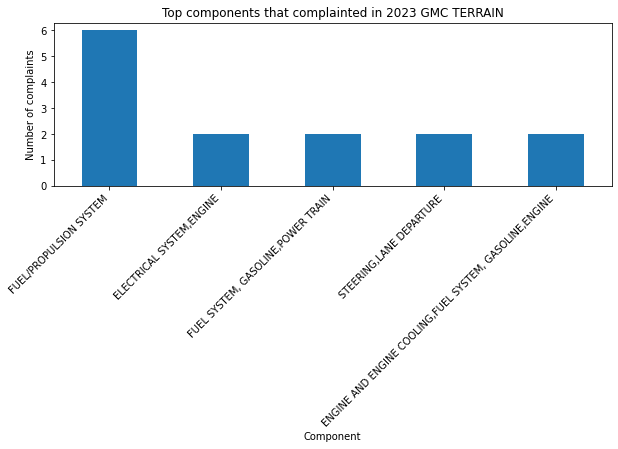


===================== Data Analysis for 2024 =====================


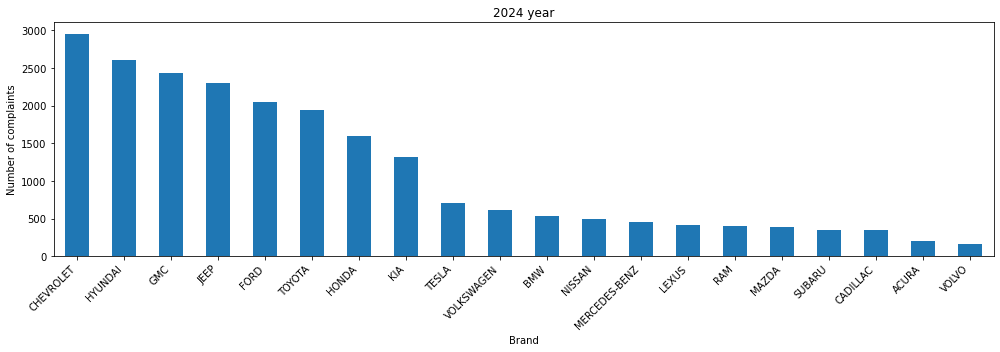

Top 5 Brands with the Most Complaints in 2024:
CHEVROLET    2955
HYUNDAI      2601
GMC          2428
JEEP         2295
FORD         2045
Name: make, dtype: int64


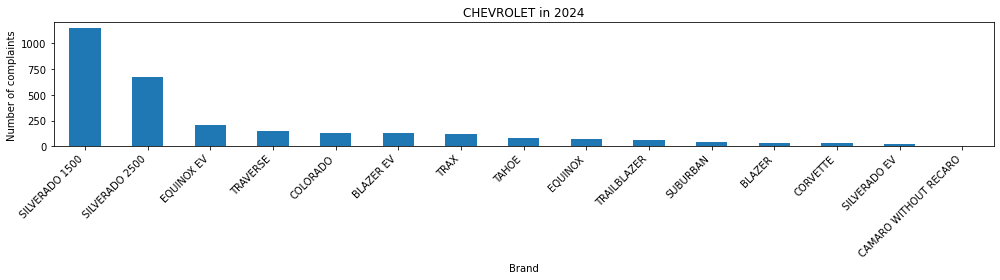

Top 10 models of CHEVROLET by number of complaints:
SILVERADO 1500    1146
SILVERADO 2500     672
EQUINOX EV         204
TRAVERSE           154
COLORADO           132
BLAZER EV          130
TRAX               117
TAHOE               86
EQUINOX             72
TRAILBLAZER         58
Name: model, dtype: int64

Top products that complainted in 2024 CHEVROLET SILVERADO 1500
Vehicle      1134
Equipment       6
Tire            6
Name: products_type, dtype: int64



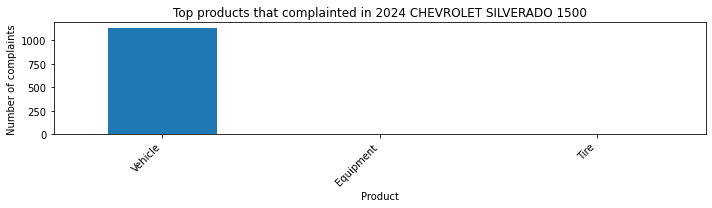

Top components that complainted in 2024 CHEVROLET SILVERADO 1500
ENGINE                       306
POWER TRAIN                  234
ENGINE AND ENGINE COOLING     84
ELECTRICAL SYSTEM             60
POWER TRAIN,ENGINE            42
Name: components, dtype: int64



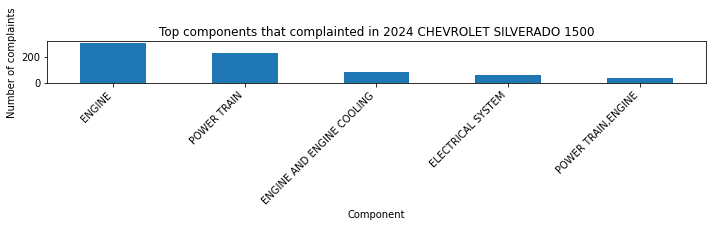

Top products that complainted in 2024 CHEVROLET SILVERADO 2500
Vehicle    660
Tire        12
Name: products_type, dtype: int64



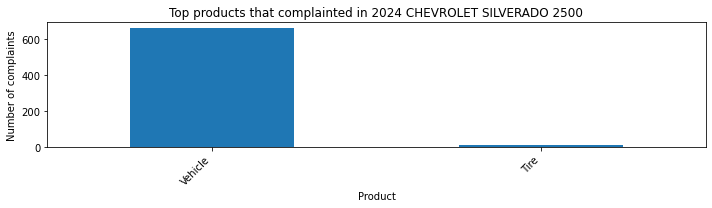

Top components that complainted in 2024 CHEVROLET SILVERADO 2500
ELECTRICAL SYSTEM,SERVICE BRAKES    126
POWER TRAIN                         120
ELECTRICAL SYSTEM                    84
SERVICE BRAKES                       72
UNKNOWN OR OTHER                     48
Name: components, dtype: int64



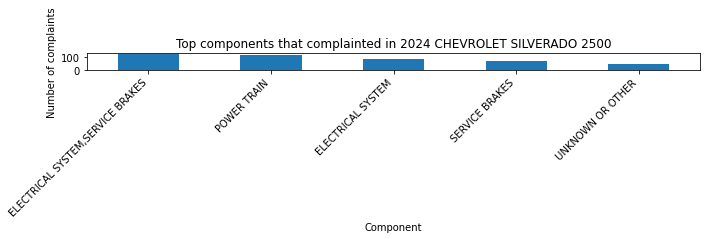

Top products that complainted in 2024 CHEVROLET EQUINOX EV
Vehicle    204
Name: products_type, dtype: int64



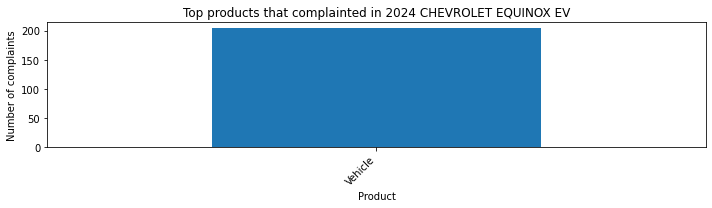

Top components that complainted in 2024 CHEVROLET EQUINOX EV
VISIBILITY/WIPER                              104
UNKNOWN OR OTHER                               18
FORWARD COLLISION AVOIDANCE                    16
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE      6
ELECTRICAL SYSTEM                               6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


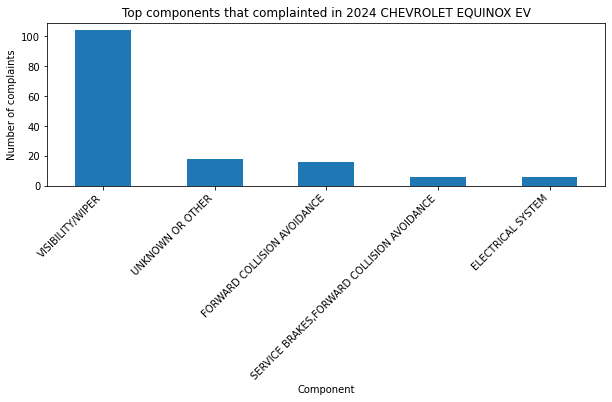

Top products that complainted in 2024 CHEVROLET TRAVERSE
Vehicle       152
Child Seat      2
Name: products_type, dtype: int64



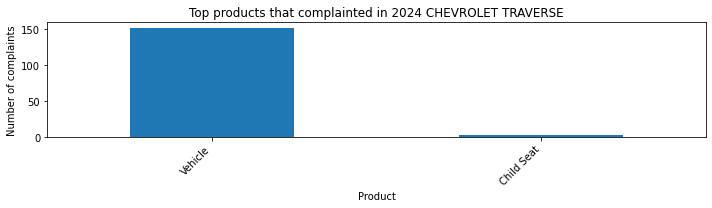

Top components that complainted in 2024 CHEVROLET TRAVERSE
SERVICE BRAKES      24
POWER TRAIN         20
SEATS               12
UNKNOWN OR OTHER     8
ENGINE               8
Name: components, dtype: int64



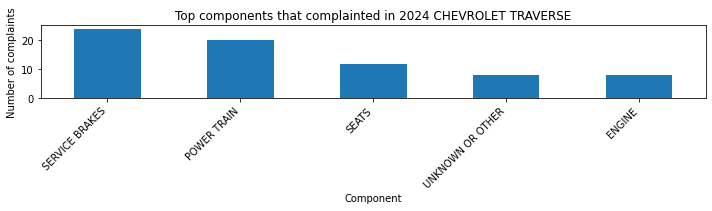

Top products that complainted in 2024 CHEVROLET COLORADO
Vehicle    132
Name: products_type, dtype: int64



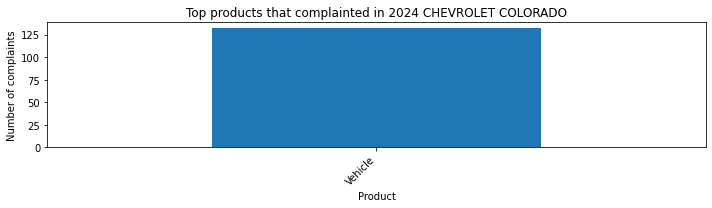

Top components that complainted in 2024 CHEVROLET COLORADO
ELECTRICAL SYSTEM                             16
SERVICE BRAKES                                12
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE    10
FORWARD COLLISION AVOIDANCE                   10
ENGINE                                        10
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


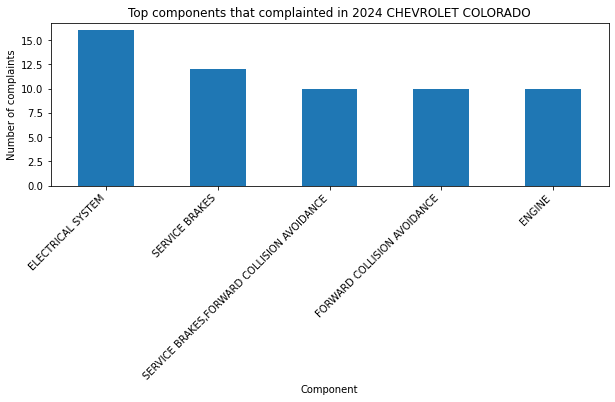

Top products that complainted in 2024 CHEVROLET BLAZER EV
Vehicle      128
Equipment      2
Name: products_type, dtype: int64



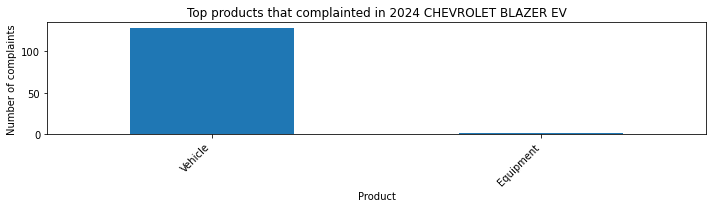

Top components that complainted in 2024 CHEVROLET BLAZER EV
VISIBILITY/WIPER                              16
SERVICE BRAKES                                12
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     8
UNKNOWN OR OTHER                               8
PARKING BRAKE                                  8
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


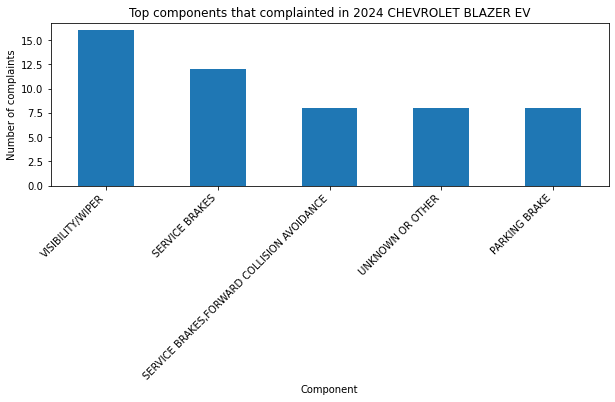

Top products that complainted in 2024 CHEVROLET TRAX
Vehicle    116
Tire         1
Name: products_type, dtype: int64



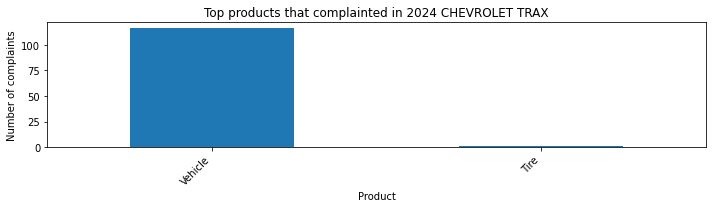

Top components that complainted in 2024 CHEVROLET TRAX
ELECTRICAL SYSTEM    20
UNKNOWN OR OTHER     16
ENGINE               15
VISIBILITY/WIPER      7
EXTERIOR LIGHTING     7
Name: components, dtype: int64



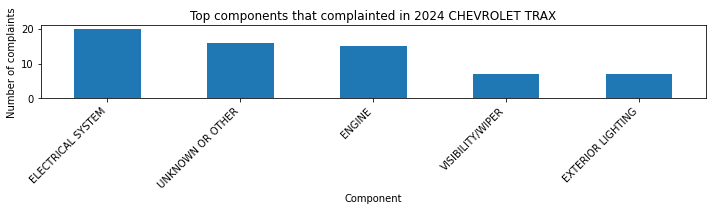

Top products that complainted in 2024 CHEVROLET TAHOE
Vehicle    86
Name: products_type, dtype: int64



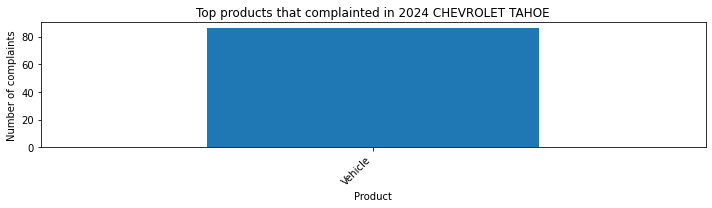

Top components that complainted in 2024 CHEVROLET TAHOE
ENGINE                                        16
ENGINE AND ENGINE COOLING                     16
SERVICE BRAKES                                 6
ELECTRICAL SYSTEM                              6
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


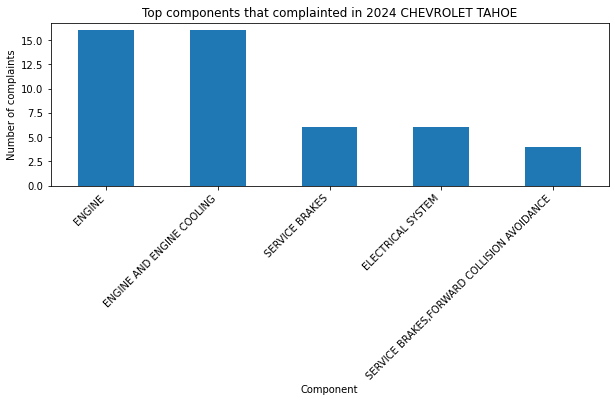

Top products that complainted in 2024 CHEVROLET EQUINOX
Vehicle    68
Tire        4
Name: products_type, dtype: int64



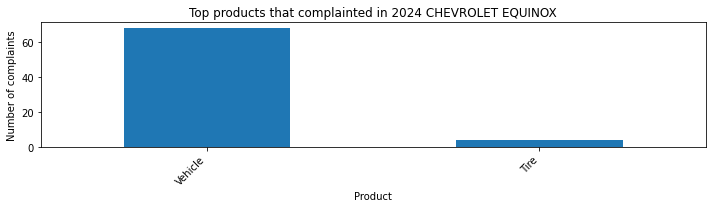

Top components that complainted in 2024 CHEVROLET EQUINOX
TIRES                                       8
SERVICE BRAKES                              8
POWER TRAIN,VEHICLE SPEED CONTROL,ENGINE    6
FUEL/PROPULSION SYSTEM                      6
ELECTRICAL SYSTEM                           6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


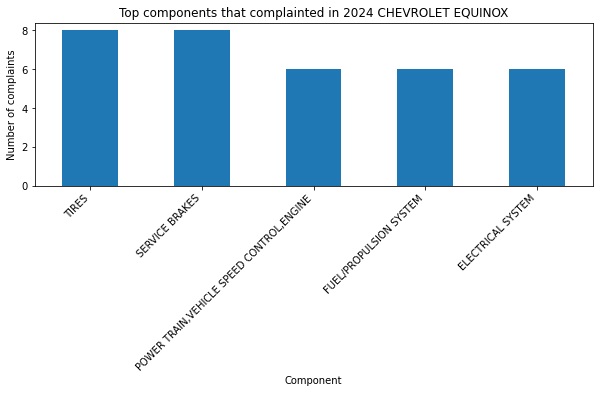

Top products that complainted in 2024 CHEVROLET TRAILBLAZER
Vehicle    58
Name: products_type, dtype: int64



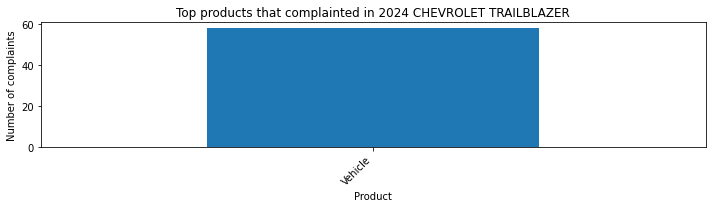

Top components that complainted in 2024 CHEVROLET TRAILBLAZER
UNKNOWN OR OTHER                        10
ENGINE                                   6
ELECTRICAL SYSTEM                        4
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     4
SERVICE BRAKES                           4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


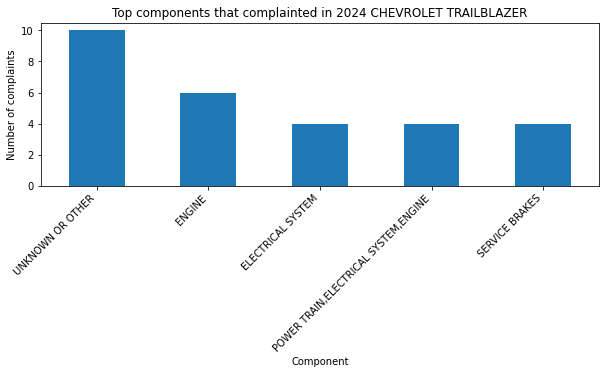

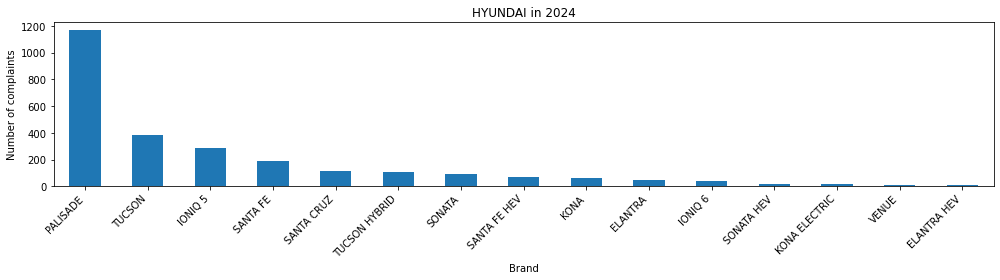

Top 10 models of HYUNDAI by number of complaints:
PALISADE         1168
TUCSON            380
IONIQ 5           284
SANTA FE          192
SANTA CRUZ        112
TUCSON HYBRID     104
SONATA             88
SANTA FE HEV       70
KONA               64
ELANTRA            46
Name: model, dtype: int64

Top products that complainted in 2024 HYUNDAI PALISADE
Vehicle       1164
Child Seat       4
Name: products_type, dtype: int64



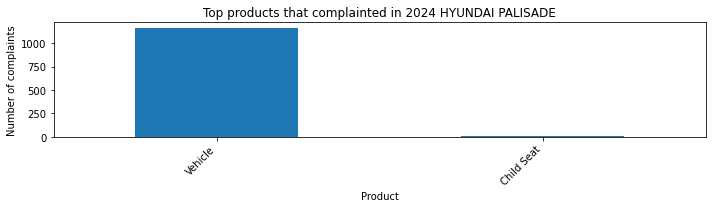

Top components that complainted in 2024 HYUNDAI PALISADE
SERVICE BRAKES                                560
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE    124
UNKNOWN OR OTHER                               56
SEAT BELTS                                     44
VISIBILITY/WIPER                               24
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


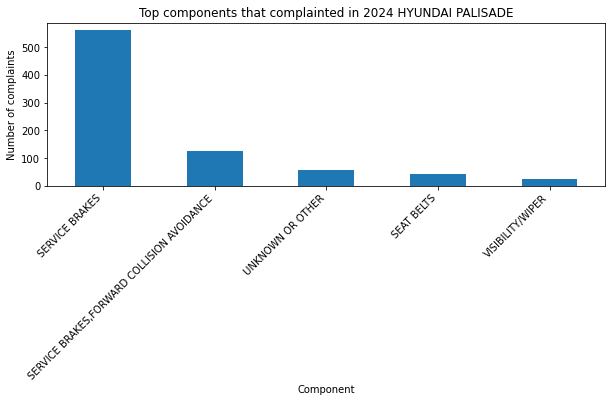

Top products that complainted in 2024 HYUNDAI TUCSON
Vehicle    380
Name: products_type, dtype: int64



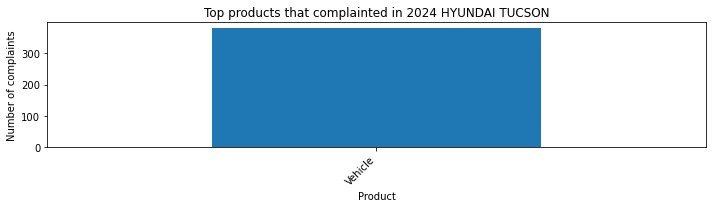

Top components that complainted in 2024 HYUNDAI TUCSON
FORWARD COLLISION AVOIDANCE                          68
UNKNOWN OR OTHER                                     60
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE           28
VEHICLE SPEED CONTROL                                20
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE    20
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


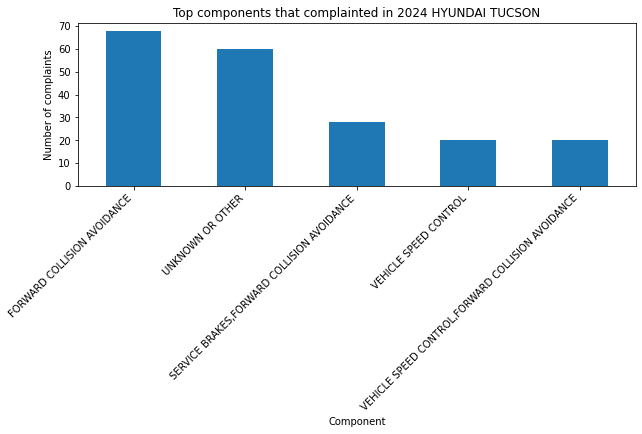

Top products that complainted in 2024 HYUNDAI IONIQ 5
Vehicle    284
Name: products_type, dtype: int64



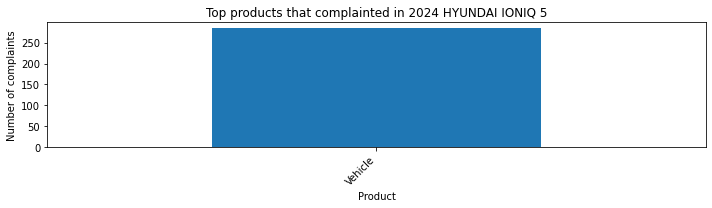

Top components that complainted in 2024 HYUNDAI IONIQ 5
ELECTRICAL SYSTEM                                       100
POWER TRAIN,ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM     20
VISIBILITY/WIPER                                         16
ELECTRICAL SYSTEM,FUEL/PROPULSION SYSTEM                 16
UNKNOWN OR OTHER                                         12
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


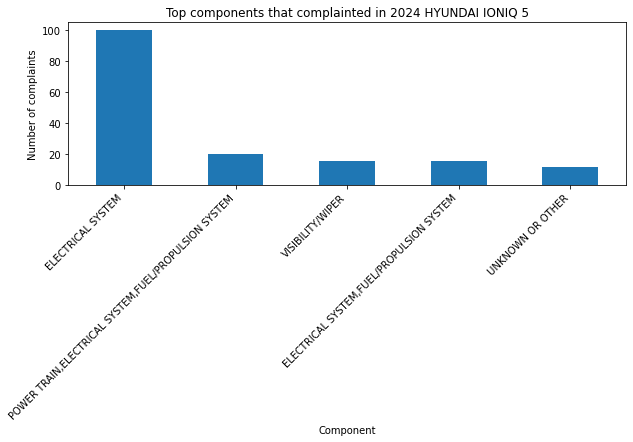

Top products that complainted in 2024 HYUNDAI SANTA FE
Vehicle    188
Tire         4
Name: products_type, dtype: int64



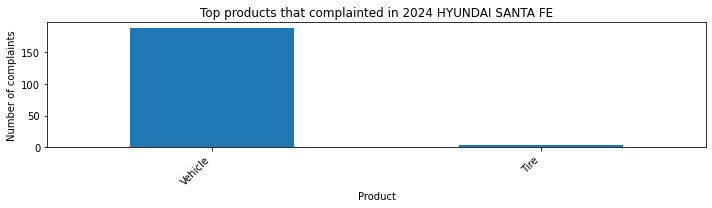

Top components that complainted in 2024 HYUNDAI SANTA FE
POWER TRAIN                                     30
UNKNOWN OR OTHER                                30
ELECTRICAL SYSTEM                               14
LANE DEPARTURE                                  10
UNKNOWN OR OTHER,FORWARD COLLISION AVOIDANCE    10
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


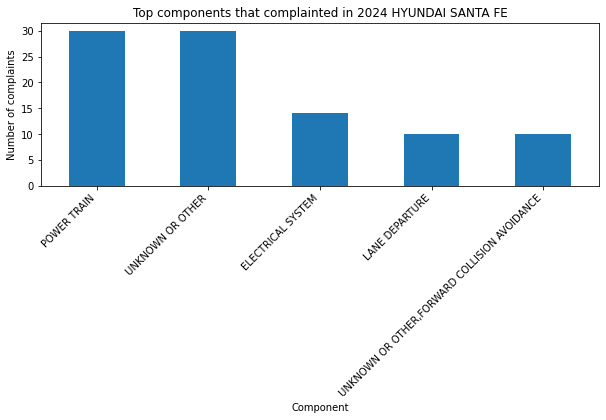

Top products that complainted in 2024 HYUNDAI SANTA CRUZ
Vehicle    108
Tire         4
Name: products_type, dtype: int64



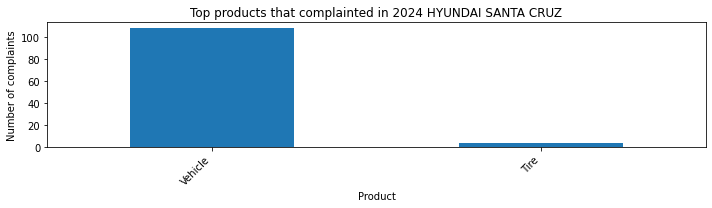

Top components that complainted in 2024 HYUNDAI SANTA CRUZ
POWER TRAIN                      16
UNKNOWN OR OTHER                 12
TIRES                             8
AIR BAGS                          8
ENGINE,FUEL/PROPULSION SYSTEM     4
Name: components, dtype: int64



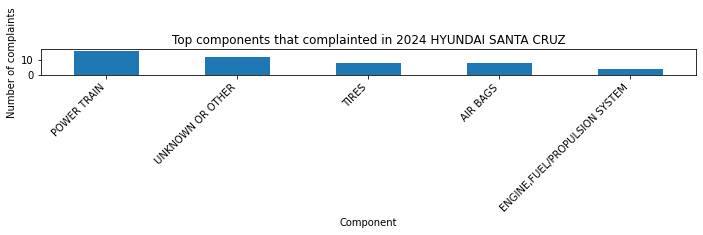

Top products that complainted in 2024 HYUNDAI TUCSON HYBRID
Vehicle    104
Name: products_type, dtype: int64



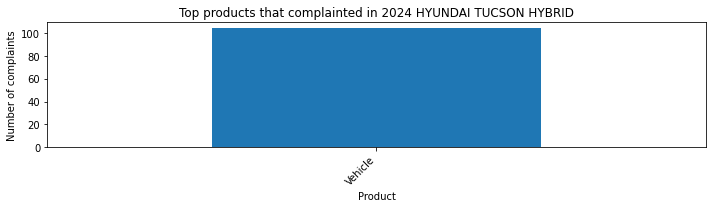

Top components that complainted in 2024 HYUNDAI TUCSON HYBRID
FORWARD COLLISION AVOIDANCE                          24
UNKNOWN OR OTHER                                     20
VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE     8
STRUCTURE,UNKNOWN OR OTHER                            4
EXTERIOR LIGHTING                                     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


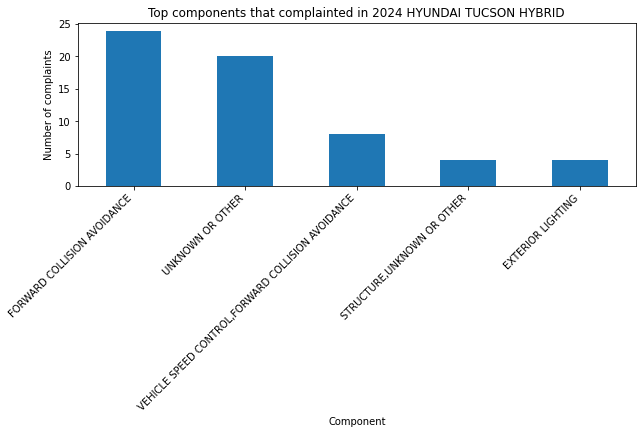

Top products that complainted in 2024 HYUNDAI SONATA
Vehicle    88
Name: products_type, dtype: int64



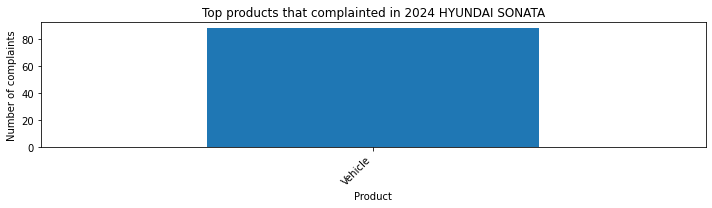

Top components that complainted in 2024 HYUNDAI SONATA
STRUCTURE                                 16
UNKNOWN OR OTHER                          10
EXTERIOR LIGHTING                          6
ELECTRICAL SYSTEM                          6
VEHICLE SPEED CONTROL,UNKNOWN OR OTHER     4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


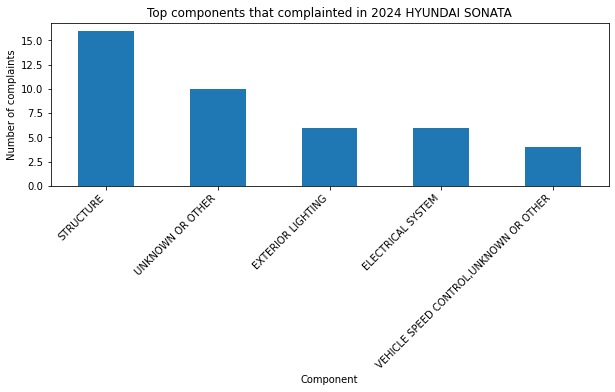

Top products that complainted in 2024 HYUNDAI SANTA FE HEV
Vehicle    70
Name: products_type, dtype: int64



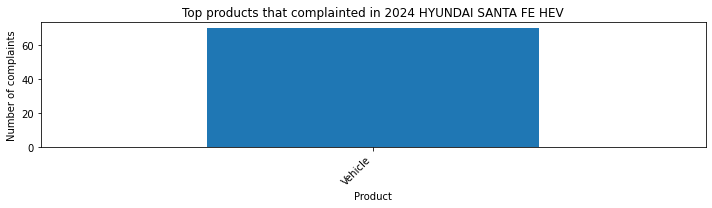

Top components that complainted in 2024 HYUNDAI SANTA FE HEV
UNKNOWN OR OTHER                                 12
LANE DEPARTURE                                    8
UNKNOWN OR OTHER,FORWARD COLLISION AVOIDANCE      4
STEERING,VEHICLE SPEED CONTROL,SERVICE BRAKES     4
STRUCTURE                                         4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


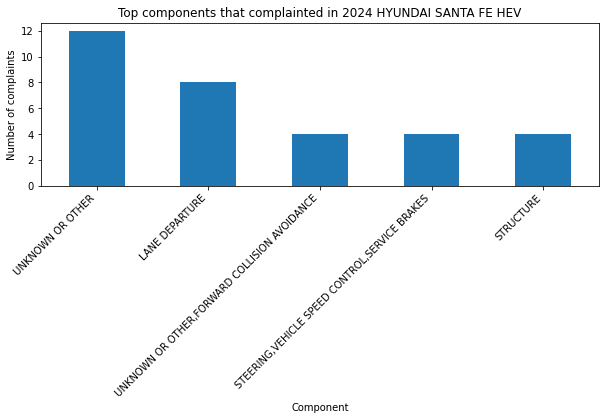

Top products that complainted in 2024 HYUNDAI KONA
Vehicle    64
Name: products_type, dtype: int64



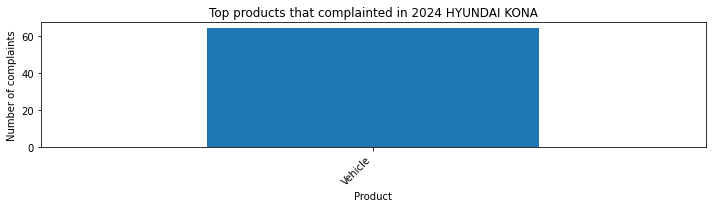

Top components that complainted in 2024 HYUNDAI KONA
ELECTRICAL SYSTEM                            22
STEERING,ELECTRICAL SYSTEM,SERVICE BRAKES     6
ELECTRICAL SYSTEM,ENGINE                      6
POWER TRAIN                                   6
ENGINE                                        6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


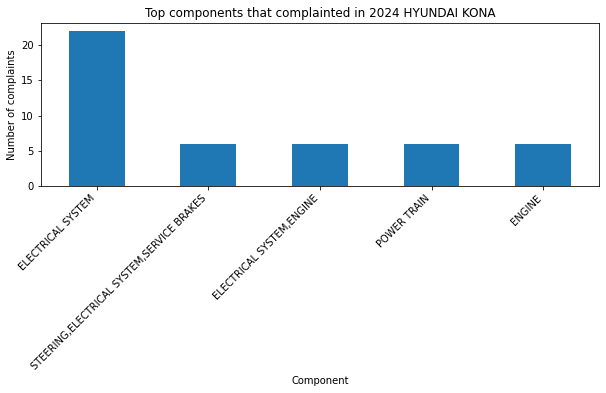

Top products that complainted in 2024 HYUNDAI ELANTRA
Vehicle    45
Tire        1
Name: products_type, dtype: int64



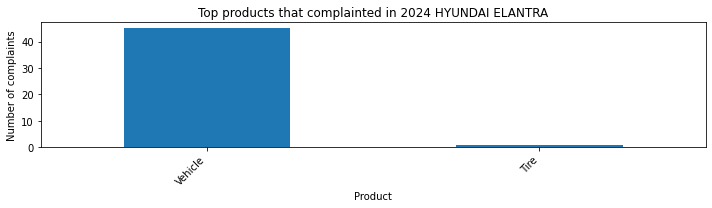

Top components that complainted in 2024 HYUNDAI ELANTRA
UNKNOWN OR OTHER                               8
ELECTRICAL SYSTEM                              6
ENGINE                                         4
LANE DEPARTURE                                 3
STEERING,ELECTRICAL SYSTEM,UNKNOWN OR OTHER    2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


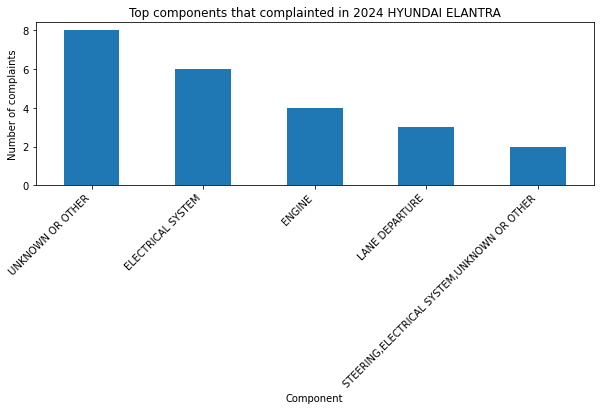

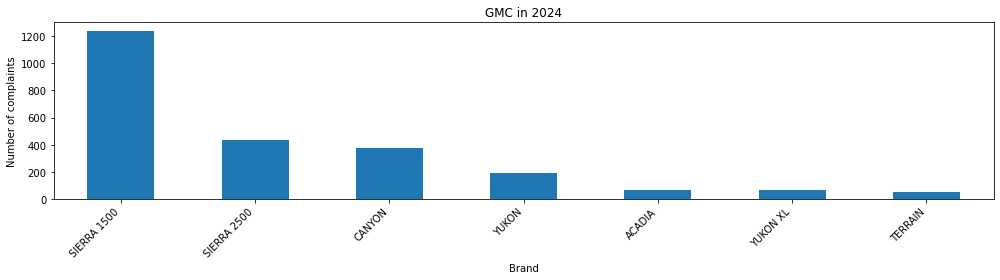

Top 10 models of GMC by number of complaints:
SIERRA 1500    1236
SIERRA 2500     432
CANYON          376
YUKON           192
ACADIA           70
YUKON XL         68
TERRAIN          54
Name: model, dtype: int64

Top products that complainted in 2024 GMC SIERRA 1500
Vehicle    1236
Name: products_type, dtype: int64



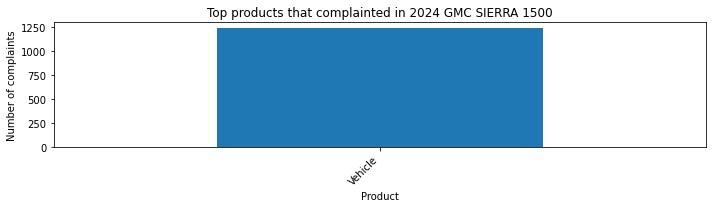

Top components that complainted in 2024 GMC SIERRA 1500
ENGINE                       378
POWER TRAIN                  150
ENGINE AND ENGINE COOLING    120
STRUCTURE                     66
UNKNOWN OR OTHER              54
Name: components, dtype: int64



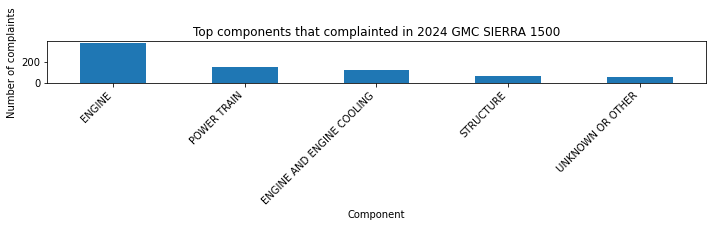

Top products that complainted in 2024 GMC SIERRA 2500
Vehicle    420
Tire        12
Name: products_type, dtype: int64



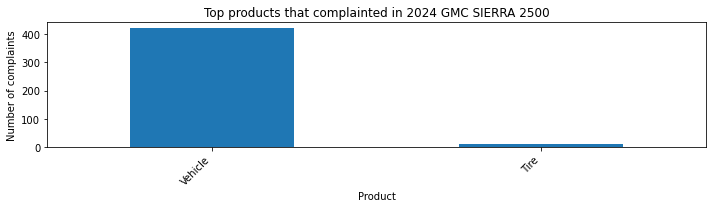

Top components that complainted in 2024 GMC SIERRA 2500
ELECTRICAL SYSTEM    78
POWER TRAIN          66
UNKNOWN OR OTHER     42
SERVICE BRAKES       30
TIRES                24
Name: components, dtype: int64



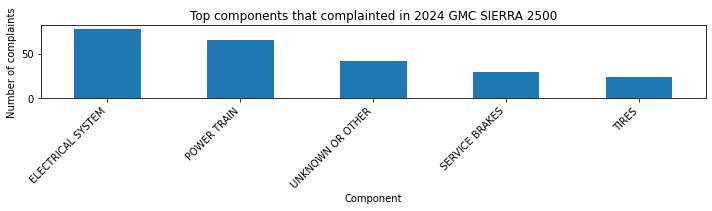

Top products that complainted in 2024 GMC CANYON
Vehicle    376
Name: products_type, dtype: int64



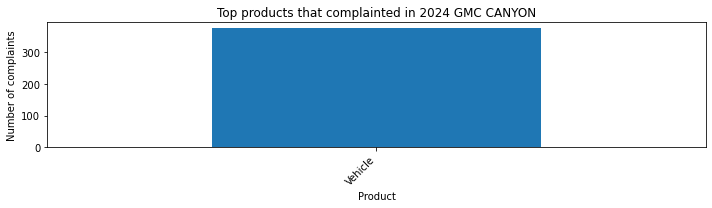

Top components that complainted in 2024 GMC CANYON
EXTERIOR LIGHTING                      272
ELECTRICAL SYSTEM,EXTERIOR LIGHTING     28
UNKNOWN OR OTHER                         6
ENGINE                                   6
FORWARD COLLISION AVOIDANCE              6
Name: components, dtype: int64



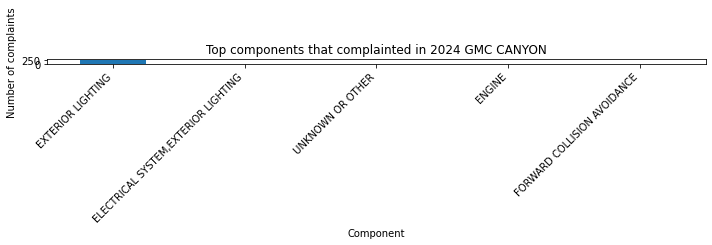

Top products that complainted in 2024 GMC YUKON
Vehicle    192
Name: products_type, dtype: int64



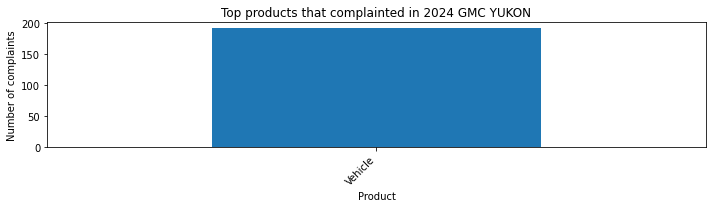

Top components that complainted in 2024 GMC YUKON
ENGINE                       82
ENGINE AND ENGINE COOLING    28
POWER TRAIN,ENGINE            6
ELECTRICAL SYSTEM,ENGINE      6
UNKNOWN OR OTHER              4
Name: components, dtype: int64



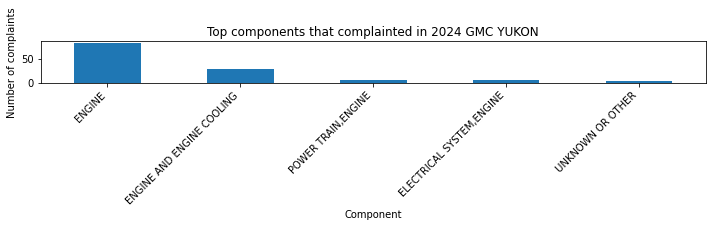

Top products that complainted in 2024 GMC ACADIA
Vehicle    70
Name: products_type, dtype: int64



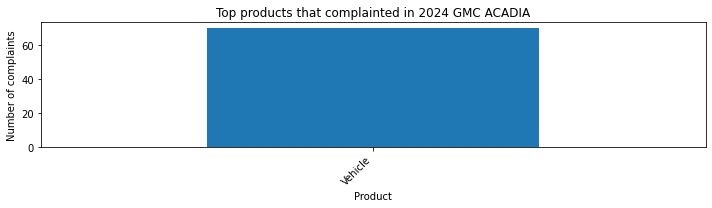

Top components that complainted in 2024 GMC ACADIA
SERVICE BRAKES                                12
FORWARD COLLISION AVOIDANCE                    6
POWER TRAIN                                    6
SEATS                                          6
SERVICE BRAKES,FORWARD COLLISION AVOIDANCE     6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


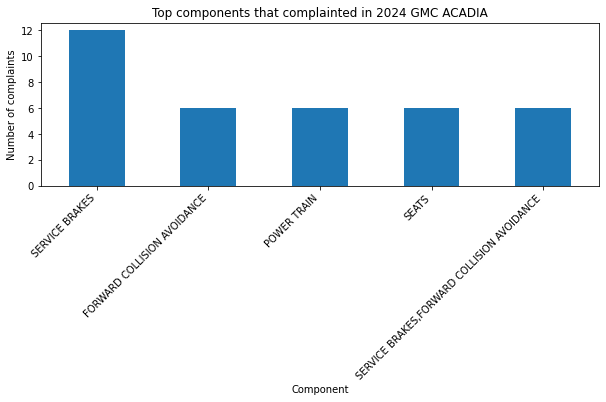

Top products that complainted in 2024 GMC YUKON XL
Vehicle    68
Name: products_type, dtype: int64



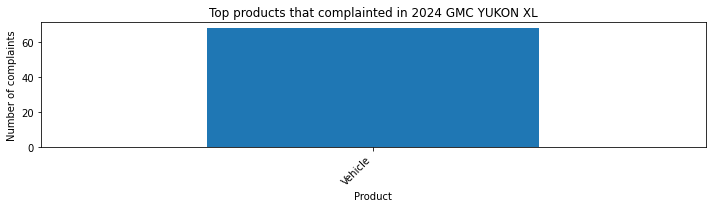

Top components that complainted in 2024 GMC YUKON XL
ENGINE                       30
ENGINE AND ENGINE COOLING     8
POWER TRAIN                   4
ELECTRICAL SYSTEM,ENGINE      4
EXTERIOR LIGHTING             2
Name: components, dtype: int64



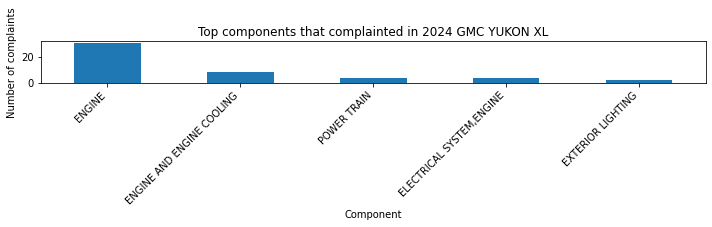

Top products that complainted in 2024 GMC TERRAIN
Vehicle    54
Name: products_type, dtype: int64



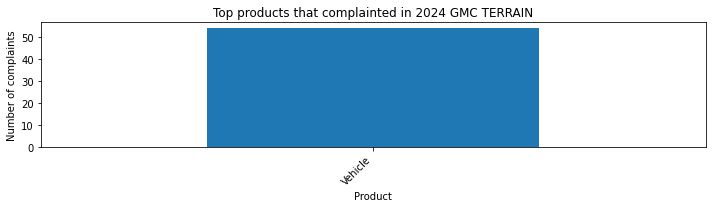

Top components that complainted in 2024 GMC TERRAIN
POWER TRAIN                          12
UNKNOWN OR OTHER                      8
FUEL/PROPULSION SYSTEM                4
POWER TRAIN,VEHICLE SPEED CONTROL     4
SERVICE BRAKES, HYDRAULIC,ENGINE      2
Name: components, dtype: int64



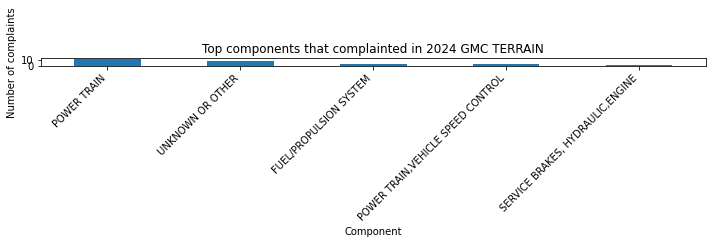

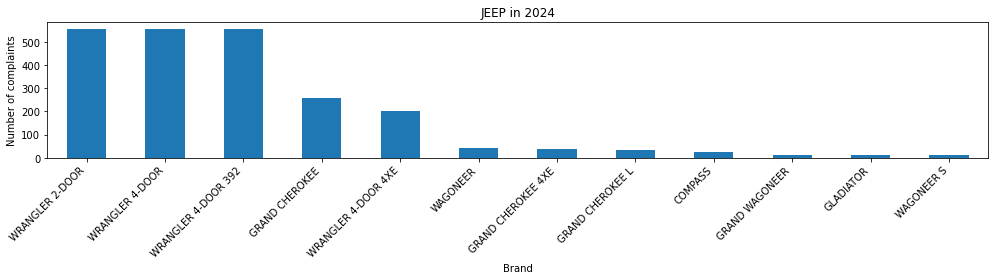

Top 10 models of JEEP by number of complaints:
WRANGLER 2-DOOR        556
WRANGLER 4-DOOR        556
WRANGLER 4-DOOR 392    556
GRAND CHEROKEE         256
WRANGLER 4-DOOR 4XE    200
WAGONEER                40
GRAND CHEROKEE 4XE      39
GRAND CHEROKEE L        34
COMPASS                 24
GRAND WAGONEER          14
Name: model, dtype: int64

Top products that complainted in 2024 JEEP WRANGLER 2-DOOR
Vehicle      547
Tire           8
Equipment      1
Name: products_type, dtype: int64



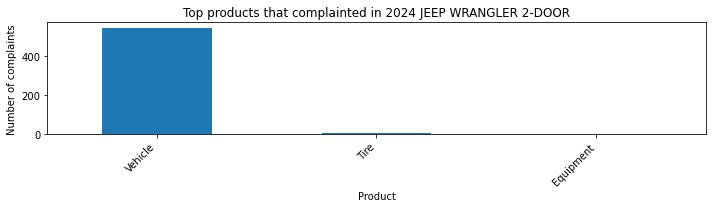

Top components that complainted in 2024 JEEP WRANGLER 2-DOOR
ELECTRICAL SYSTEM,ENGINE                           56
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE               47
ELECTRICAL SYSTEM                                  47
ELECTRICAL SYSTEM,ENGINE,FUEL/PROPULSION SYSTEM    46
ENGINE                                             41
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


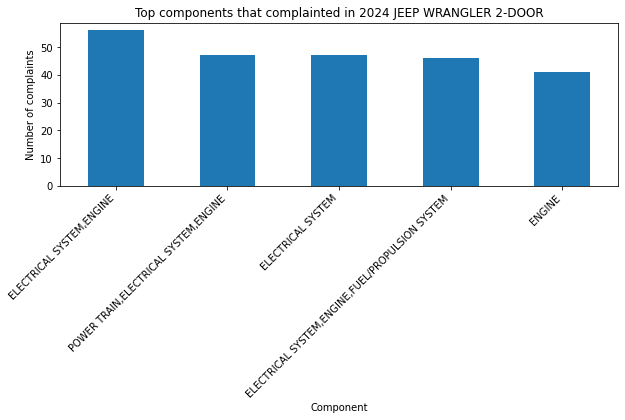

Top products that complainted in 2024 JEEP WRANGLER 4-DOOR
Vehicle      547
Tire           8
Equipment      1
Name: products_type, dtype: int64



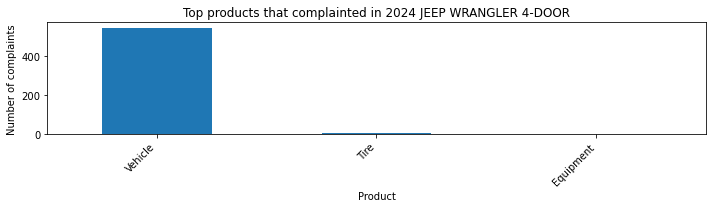

Top components that complainted in 2024 JEEP WRANGLER 4-DOOR
ELECTRICAL SYSTEM,ENGINE                           56
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE               47
ELECTRICAL SYSTEM                                  47
ELECTRICAL SYSTEM,ENGINE,FUEL/PROPULSION SYSTEM    46
ENGINE                                             41
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


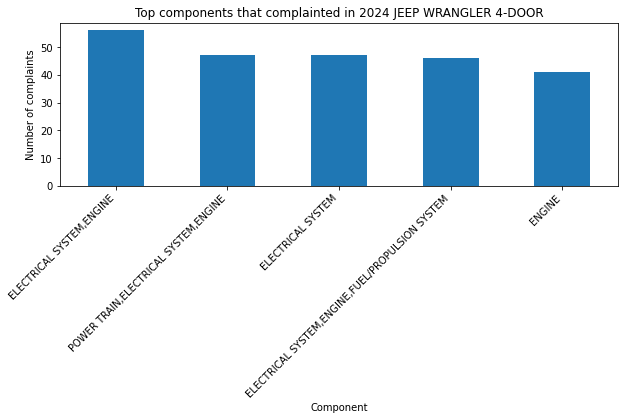

Top products that complainted in 2024 JEEP WRANGLER 4-DOOR 392
Vehicle      547
Tire           8
Equipment      1
Name: products_type, dtype: int64



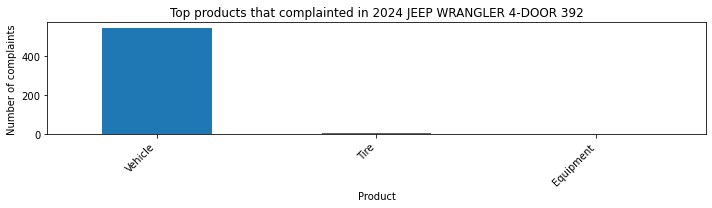

Top components that complainted in 2024 JEEP WRANGLER 4-DOOR 392
ELECTRICAL SYSTEM,ENGINE                           56
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE               47
ELECTRICAL SYSTEM                                  47
ELECTRICAL SYSTEM,ENGINE,FUEL/PROPULSION SYSTEM    46
ENGINE                                             41
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


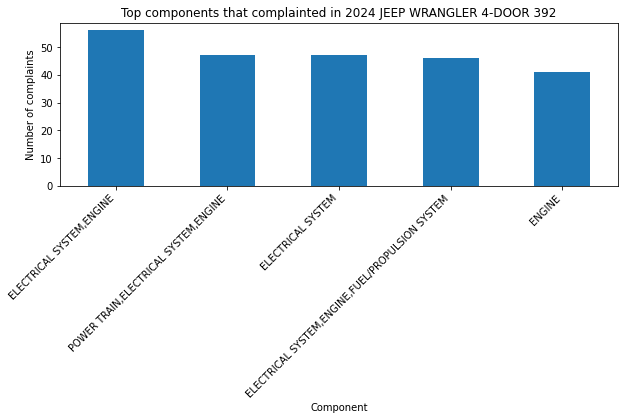

Top products that complainted in 2024 JEEP GRAND CHEROKEE
Vehicle    256
Name: products_type, dtype: int64



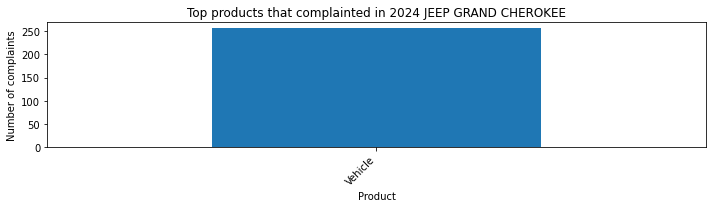

Top components that complainted in 2024 JEEP GRAND CHEROKEE
ELECTRICAL SYSTEM                                  26
EXTERIOR LIGHTING                                  22
UNKNOWN OR OTHER                                   20
ELECTRICAL SYSTEM,ENGINE,FUEL/PROPULSION SYSTEM    12
POWER TRAIN                                        12
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


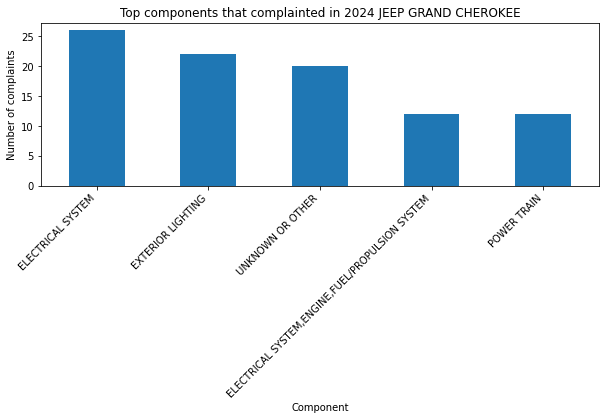

Top products that complainted in 2024 JEEP WRANGLER 4-DOOR 4XE
Vehicle    198
Tire         2
Name: products_type, dtype: int64



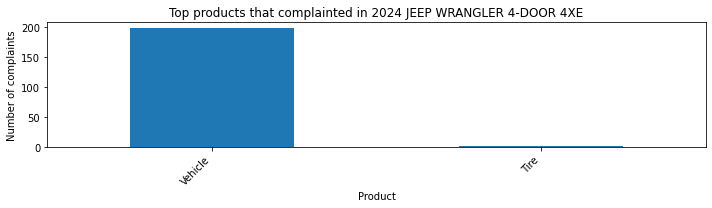

Top components that complainted in 2024 JEEP WRANGLER 4-DOOR 4XE
ELECTRICAL SYSTEM                       27
ELECTRICAL SYSTEM,ENGINE                25
ENGINE                                  22
UNKNOWN OR OTHER                        16
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE    12
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


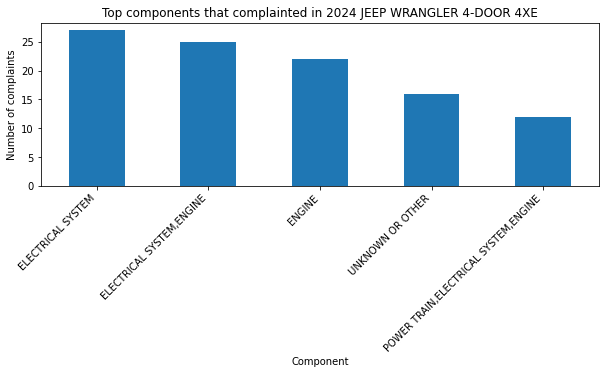

Top products that complainted in 2024 JEEP WAGONEER
Vehicle    38
Tire        2
Name: products_type, dtype: int64



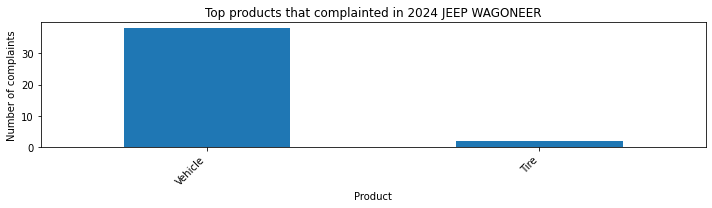

Top components that complainted in 2024 JEEP WAGONEER
ELECTRICAL SYSTEM,ENGINE,FUEL/PROPULSION SYSTEM    4
ELECTRICAL SYSTEM,UNKNOWN OR OTHER,ENGINE          4
TIRES                                              4
POWER TRAIN                                        4
ENGINE                                             2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


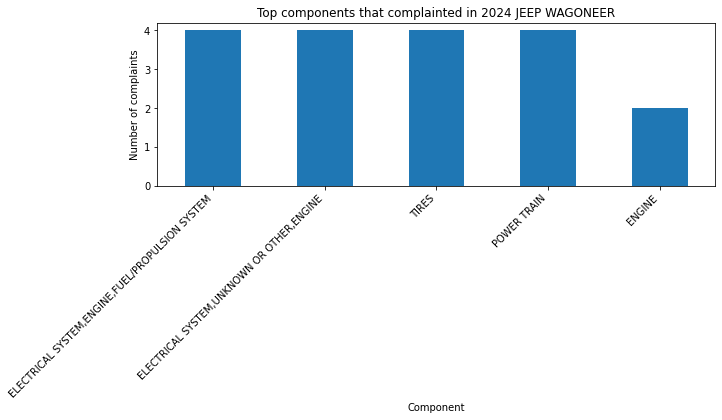

Top products that complainted in 2024 JEEP GRAND CHEROKEE 4XE
Vehicle    39
Name: products_type, dtype: int64



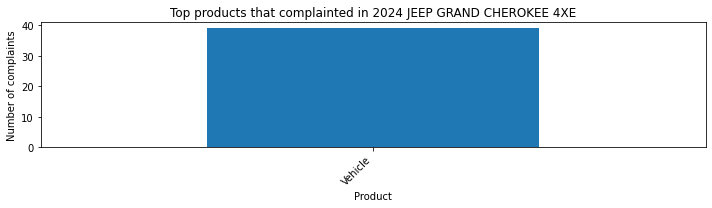

Top components that complainted in 2024 JEEP GRAND CHEROKEE 4XE
POWER TRAIN,UNKNOWN OR OTHER,ENGINE          4
ENGINE                                       4
ELECTRICAL SYSTEM,UNKNOWN OR OTHER,ENGINE    3
ELECTRICAL SYSTEM                            3
SERVICE BRAKES                               2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


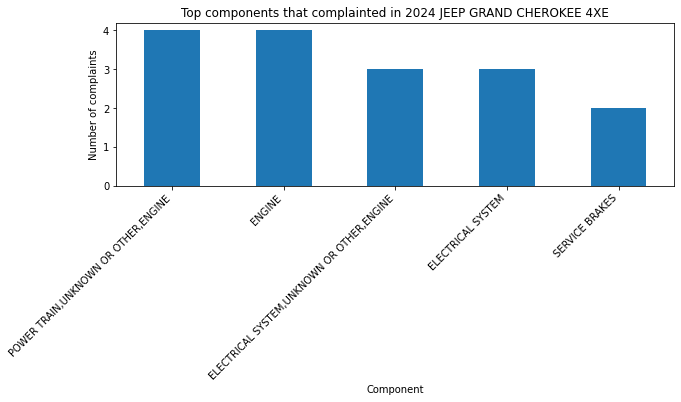

Top products that complainted in 2024 JEEP GRAND CHEROKEE L
Vehicle    34
Name: products_type, dtype: int64



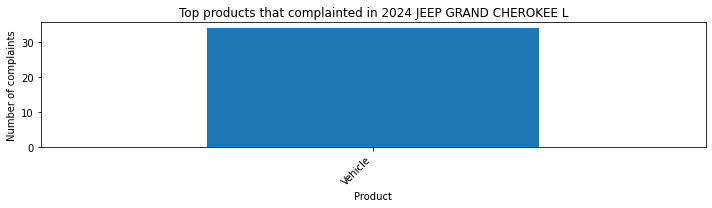

Top components that complainted in 2024 JEEP GRAND CHEROKEE L
ELECTRICAL SYSTEM,ENGINE                                               6
EXTERIOR LIGHTING                                                      4
ELECTRICAL SYSTEM,VEHICLE SPEED CONTROL,FORWARD COLLISION AVOIDANCE    2
SEATS                                                                  2
AIR BAGS,FORWARD COLLISION AVOIDANCE                                   2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


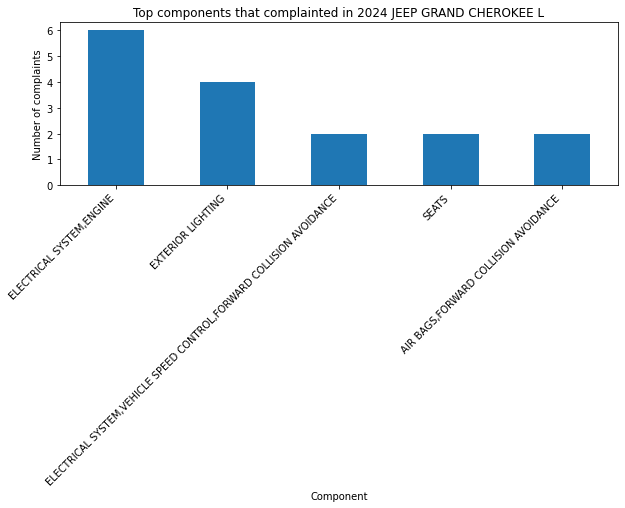

Top products that complainted in 2024 JEEP COMPASS
Vehicle    24
Name: products_type, dtype: int64



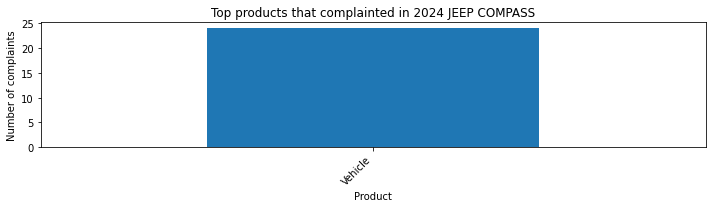

Top components that complainted in 2024 JEEP COMPASS
LANE DEPARTURE,FORWARD COLLISION AVOIDANCE                        2
ELECTRICAL SYSTEM,UNKNOWN OR OTHER,FORWARD COLLISION AVOIDANCE    1
SEAT BELTS                                                        1
STEERING,POWER TRAIN                                              1
ELECTRICAL SYSTEM,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE      1
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


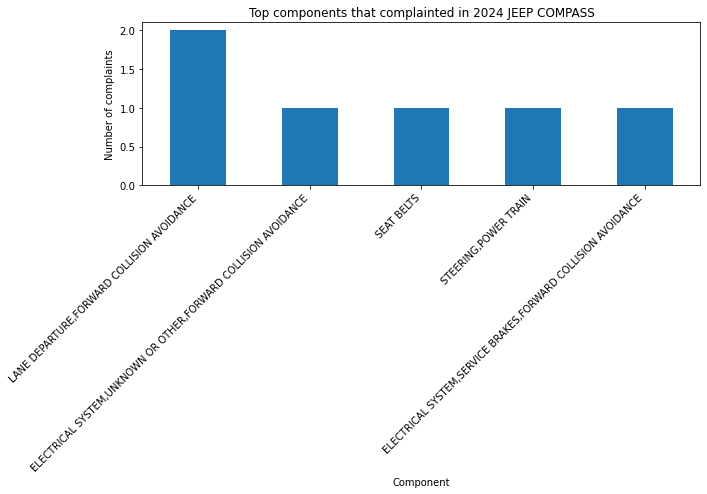

Top products that complainted in 2024 JEEP GRAND WAGONEER
Vehicle    14
Name: products_type, dtype: int64



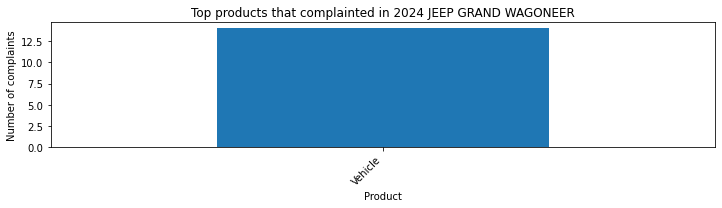

Top components that complainted in 2024 JEEP GRAND WAGONEER
ENGINE                                                          6
ELECTRICAL SYSTEM,ENGINE                                        4
ELECTRICAL SYSTEM,SERVICE BRAKES,FORWARD COLLISION AVOIDANCE    2
ELECTRICAL SYSTEM                                               2
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


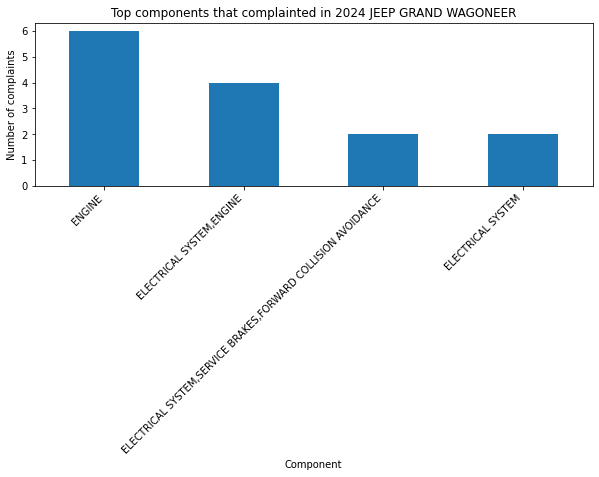

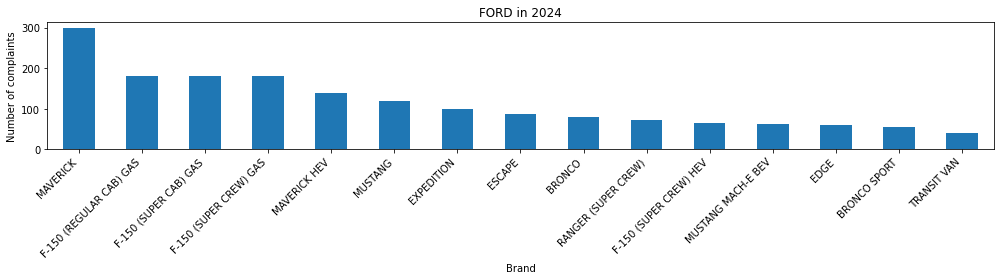

Top 10 models of FORD by number of complaints:
MAVERICK                   298
F-150 (REGULAR CAB) GAS    180
F-150 (SUPER CAB) GAS      180
F-150 (SUPER CREW) GAS     180
MAVERICK HEV               140
MUSTANG                    120
EXPEDITION                 100
ESCAPE                      86
BRONCO                      80
RANGER (SUPER CREW)         72
Name: model, dtype: int64

Top products that complainted in 2024 FORD MAVERICK
Vehicle      294
Equipment      2
Tire           2
Name: products_type, dtype: int64



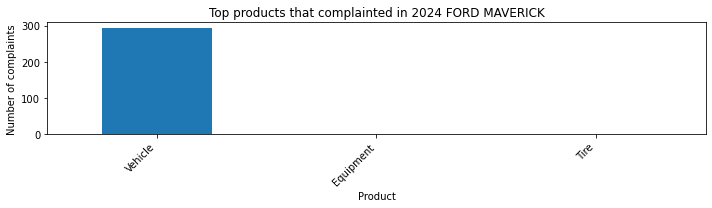

Top components that complainted in 2024 FORD MAVERICK
ELECTRICAL SYSTEM       44
UNKNOWN OR OTHER        30
POWER TRAIN             28
ENGINE                  26
BACK OVER PREVENTION    12
Name: components, dtype: int64



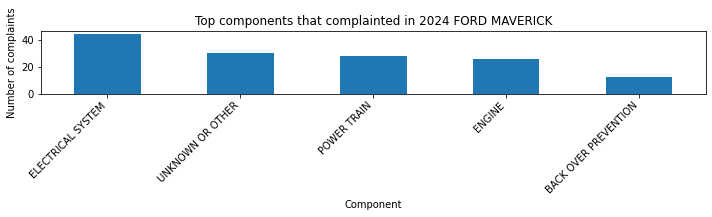

Top products that complainted in 2024 FORD F-150 (REGULAR CAB) GAS
Vehicle    178
Tire         2
Name: products_type, dtype: int64



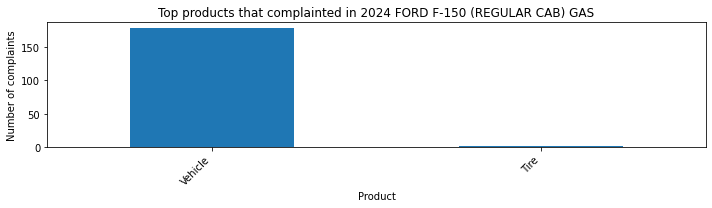

Top components that complainted in 2024 FORD F-150 (REGULAR CAB) GAS
POWER TRAIN                    30
ELECTRICAL SYSTEM              22
SERVICE BRAKES                 14
UNKNOWN OR OTHER               14
FORWARD COLLISION AVOIDANCE     6
Name: components, dtype: int64



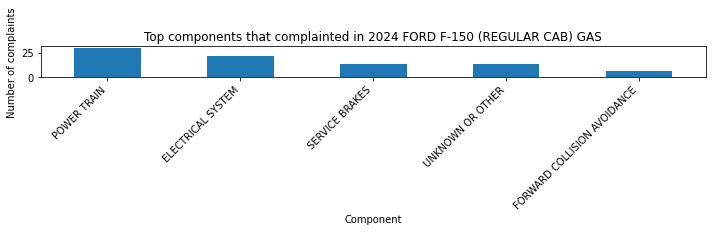

Top products that complainted in 2024 FORD F-150 (SUPER CAB) GAS
Vehicle    178
Tire         2
Name: products_type, dtype: int64



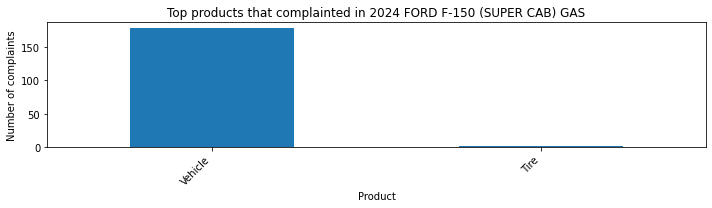

Top components that complainted in 2024 FORD F-150 (SUPER CAB) GAS
POWER TRAIN                    30
ELECTRICAL SYSTEM              22
SERVICE BRAKES                 14
UNKNOWN OR OTHER               14
FORWARD COLLISION AVOIDANCE     6
Name: components, dtype: int64



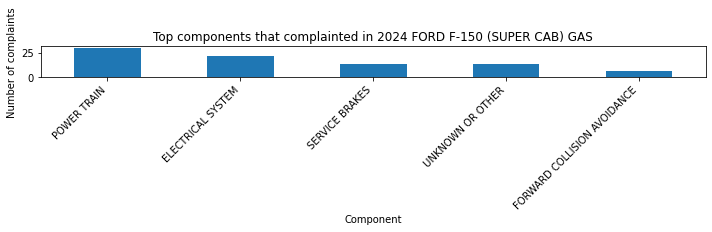

Top products that complainted in 2024 FORD F-150 (SUPER CREW) GAS
Vehicle    178
Tire         2
Name: products_type, dtype: int64



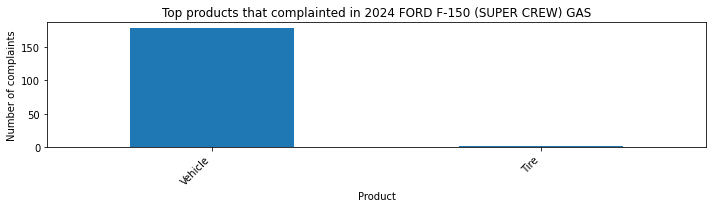

Top components that complainted in 2024 FORD F-150 (SUPER CREW) GAS
POWER TRAIN                    30
ELECTRICAL SYSTEM              22
SERVICE BRAKES                 14
UNKNOWN OR OTHER               14
FORWARD COLLISION AVOIDANCE     6
Name: components, dtype: int64



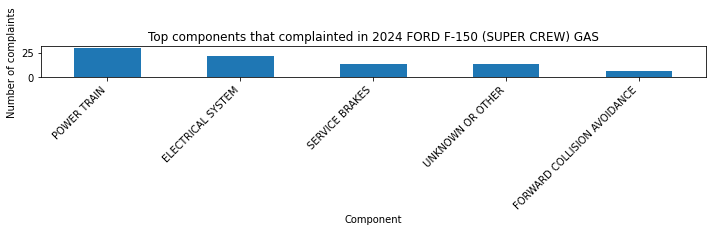

Top products that complainted in 2024 FORD MAVERICK HEV
Vehicle      139
Equipment      1
Name: products_type, dtype: int64



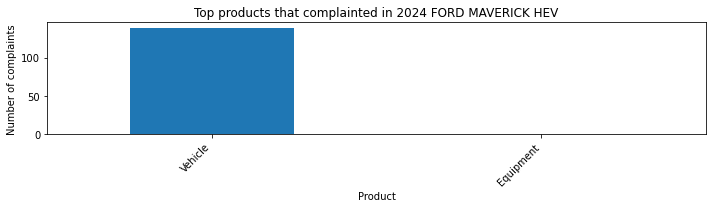

Top components that complainted in 2024 FORD MAVERICK HEV
ELECTRICAL SYSTEM                       22
UNKNOWN OR OTHER                        12
ENGINE                                  12
POWER TRAIN                             12
POWER TRAIN,ELECTRICAL SYSTEM,ENGINE     5
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


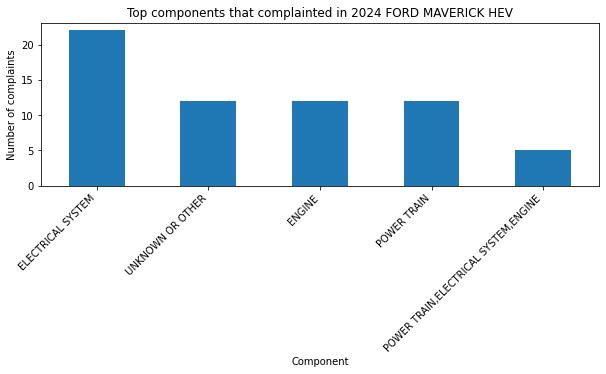

Top products that complainted in 2024 FORD MUSTANG
Vehicle    120
Name: products_type, dtype: int64



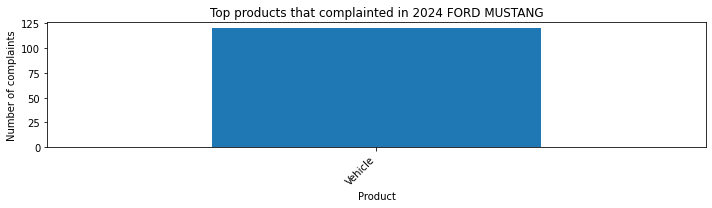

Top components that complainted in 2024 FORD MUSTANG
ELECTRICAL SYSTEM                         28
UNKNOWN OR OTHER                          10
ENGINE                                     8
ELECTRICAL SYSTEM,UNKNOWN OR OTHER         6
ELECTRICAL SYSTEM,BACK OVER PREVENTION     6
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


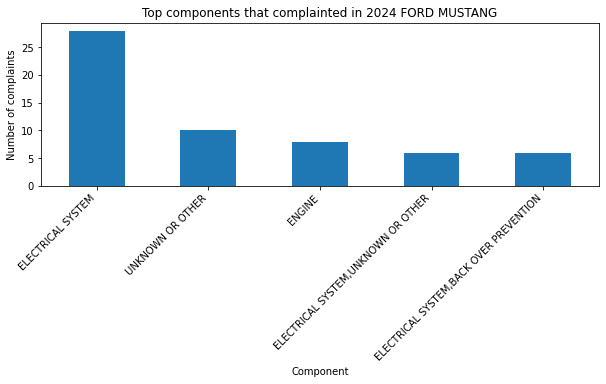

Top products that complainted in 2024 FORD EXPEDITION
Vehicle    100
Name: products_type, dtype: int64



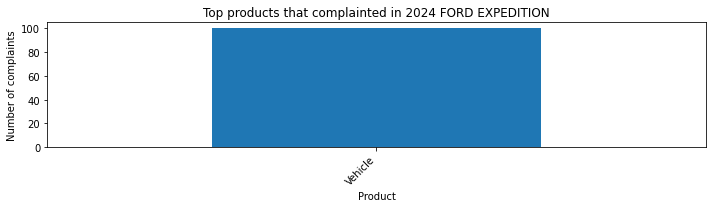

Top components that complainted in 2024 FORD EXPEDITION
ELECTRICAL SYSTEM        14
UNKNOWN OR OTHER         10
SERVICE BRAKES            8
VISIBILITY/WIPER          8
VEHICLE SPEED CONTROL     8
Name: components, dtype: int64



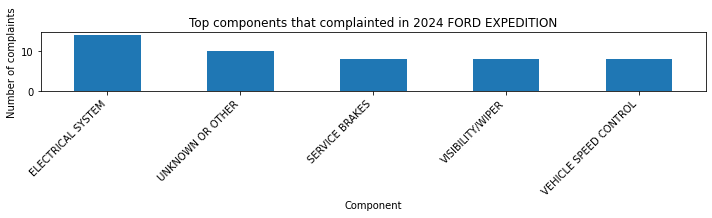

Top products that complainted in 2024 FORD ESCAPE
Vehicle    86
Name: products_type, dtype: int64



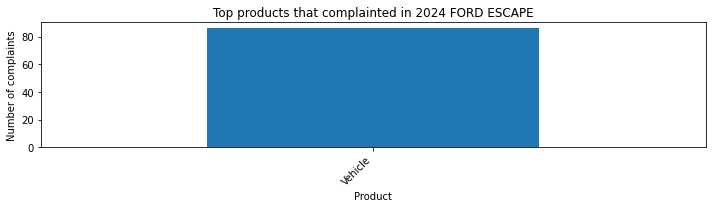

Top components that complainted in 2024 FORD ESCAPE
ENGINE                                        10
UNKNOWN OR OTHER                               8
ELECTRICAL SYSTEM                              6
FORWARD COLLISION AVOIDANCE,LANE DEPARTURE     6
SERVICE BRAKES, HYDRAULIC                      4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


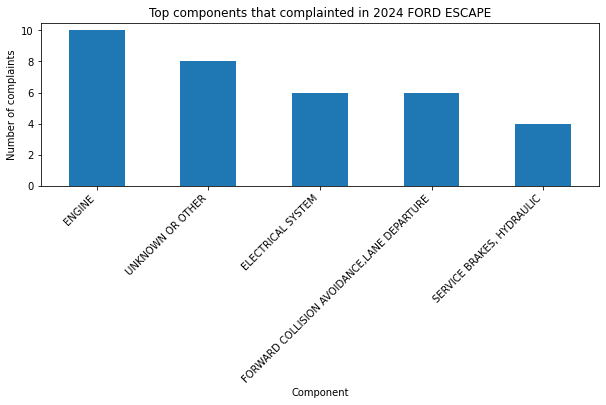

Top products that complainted in 2024 FORD BRONCO
Vehicle    80
Name: products_type, dtype: int64



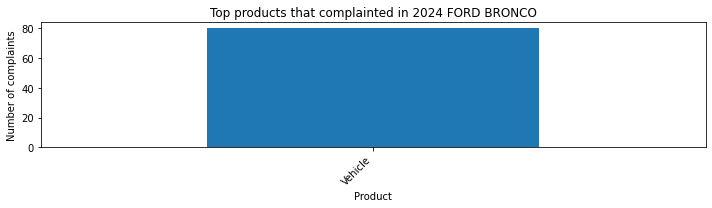

Top components that complainted in 2024 FORD BRONCO
UNKNOWN OR OTHER                             18
STRUCTURE                                    10
STEERING,ELECTRICAL SYSTEM,LANE DEPARTURE     4
SUSPENSION                                    4
EXTERIOR LIGHTING                             4
Name: components, dtype: int64



C:\Users\YINGHA~1\AppData\Local\Temp/ipykernel_13856/2719972303.py:70: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


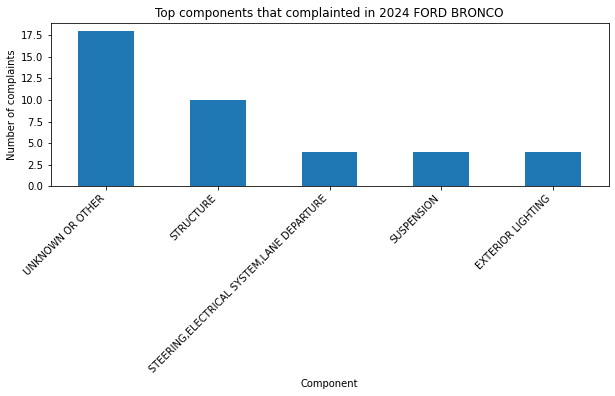

Top products that complainted in 2024 FORD RANGER (SUPER CREW)
Vehicle    72
Name: products_type, dtype: int64



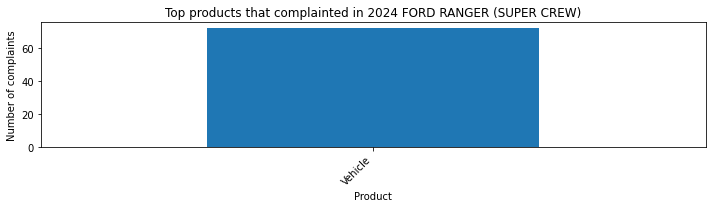

Top components that complainted in 2024 FORD RANGER (SUPER CREW)
POWER TRAIN                      12
STRUCTURE                         6
AIR BAGS                          4
SERVICE BRAKES                    4
POWER TRAIN,ELECTRICAL SYSTEM     4
Name: components, dtype: int64



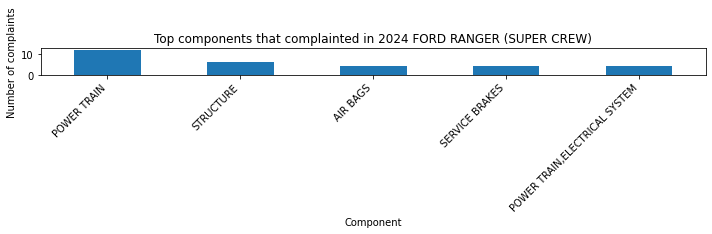

In [9]:
for year, filename in files.items():
    print(f"\n===================== Data Analysis for {year} =====================")
    filepath = os.path.join(base_path, filename)

    df = pd.read_csv(filepath, encoding="latin1", low_memory=False)

    brand_counts = df["make"].value_counts().sort_values(ascending=False)
    top_brands = brand_counts.head(20)

    plt.figure(figsize=(14, 5))
    top_brands.plot(kind="bar")
    plt.title(f"{year} year")
    plt.xlabel("Brand")
    plt.ylabel("Number of complaints")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    print(f"Top 5 Brands with the Most Complaints in {year}:")
    print(top_brands.head(5))

    top_brand_list = top_brands.head(5).index

    for b in top_brand_list:
        subset = df[df["make"] == b]
        model_counts = subset["model"].value_counts().sort_values(ascending=False)

        plt.figure(figsize=(14, 4))
        model_counts.head(15).plot(kind="bar")
        plt.title(f"{b} in {year}")
        plt.xlabel("Brand")
        plt.ylabel("Number of complaints")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        plt.show()

        print(f"Top 10 models of {b} by number of complaints:")
        print(model_counts.head(10))
        print()
        top_models_list = model_counts.head(10).index

        for m in top_models_list:
            subset_model = subset[subset["model"] == m]

            prod_counts = subset_model["products_type"].value_counts().sort_values(ascending=False)
            print(f"Top products that complainted in {year} {b} {m}")
            print(prod_counts.head(5))
            print()

            plt.figure(figsize=(10, 3))
            prod_counts.head(5).plot(kind="bar")
            plt.title(f"Top products that complainted in {year} {b} {m}")
            plt.xlabel("Product")
            plt.ylabel("Number of complaints")
            plt.xticks(rotation=45, ha="right")
            plt.tight_layout()
            plt.show()

            comp_counts = subset_model["components"].value_counts().sort_values(ascending=False)
            print(f"Top components that complainted in {year} {b} {m}")
            print(comp_counts.head(5))
            print()

            plt.figure(figsize=(10, 3))
            comp_counts.head(5).plot(kind="bar")
            plt.title(f"Top components that complainted in {year} {b} {m}")
            plt.xlabel("Component")
            plt.ylabel("Number of complaints")
            plt.xticks(rotation=45, ha="right")
            plt.tight_layout()
            plt.show()

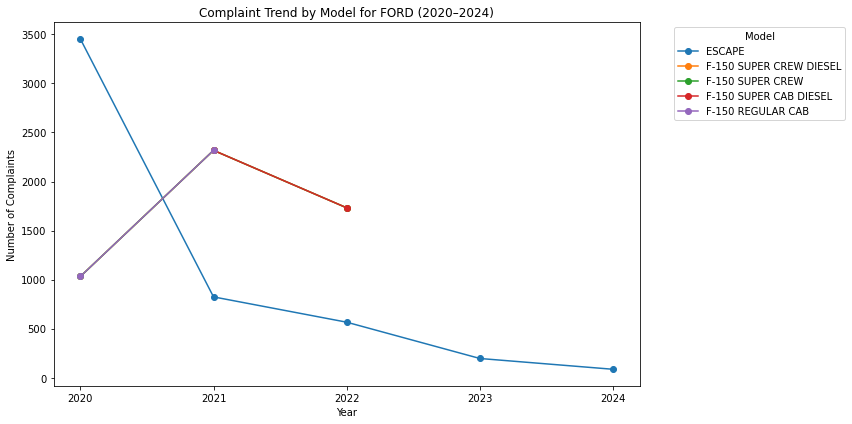

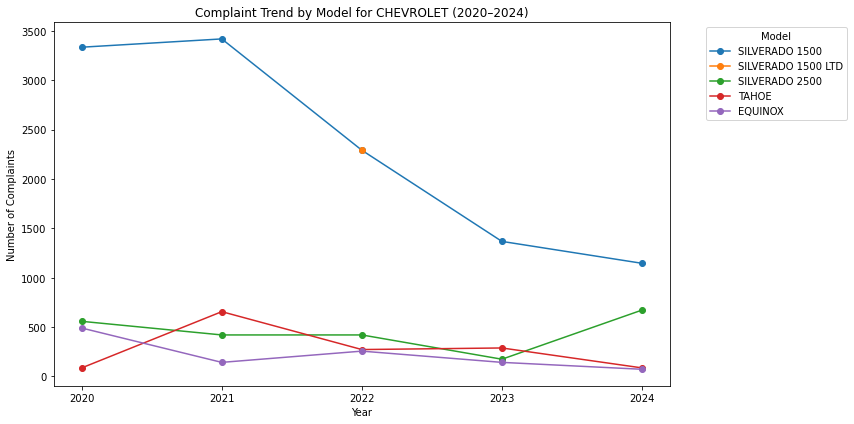

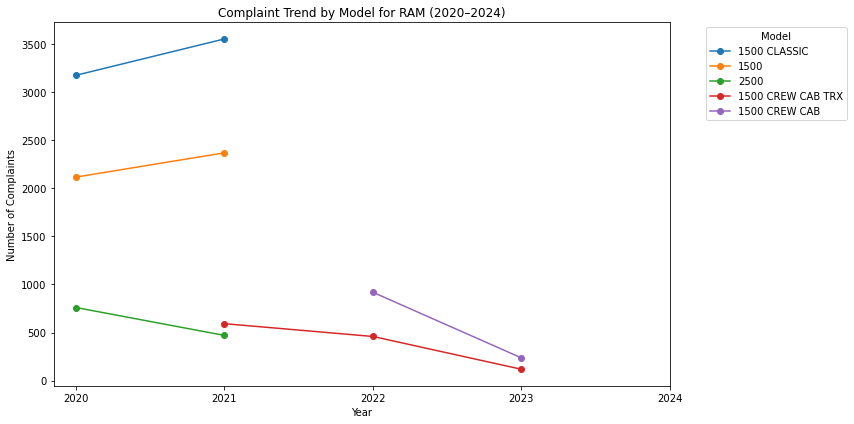

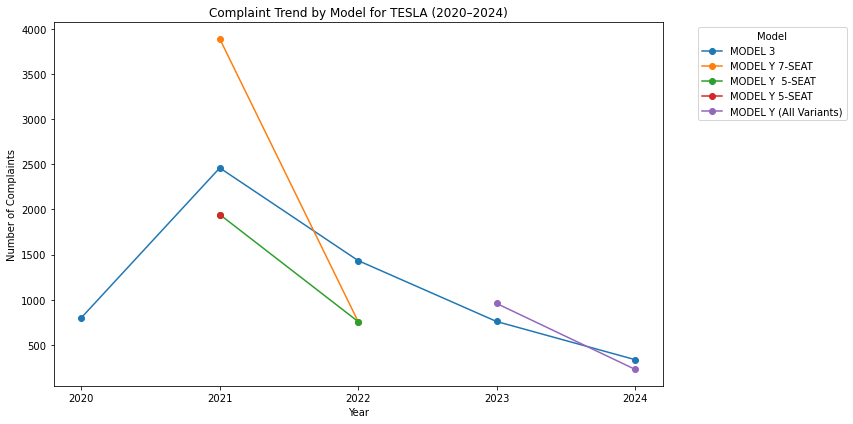

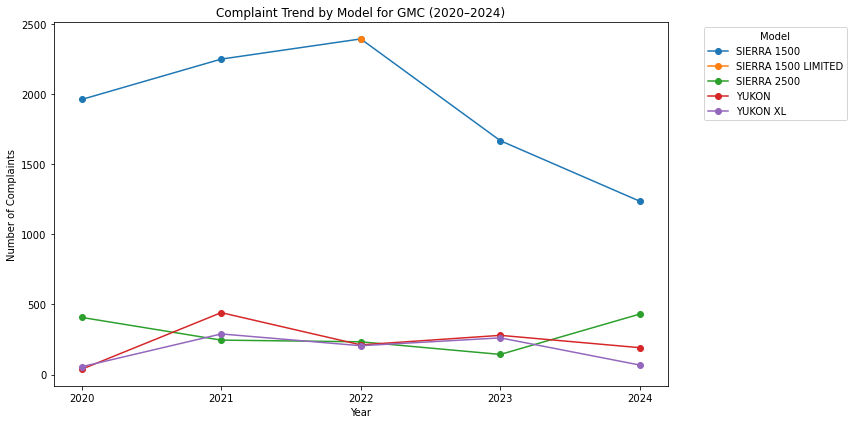

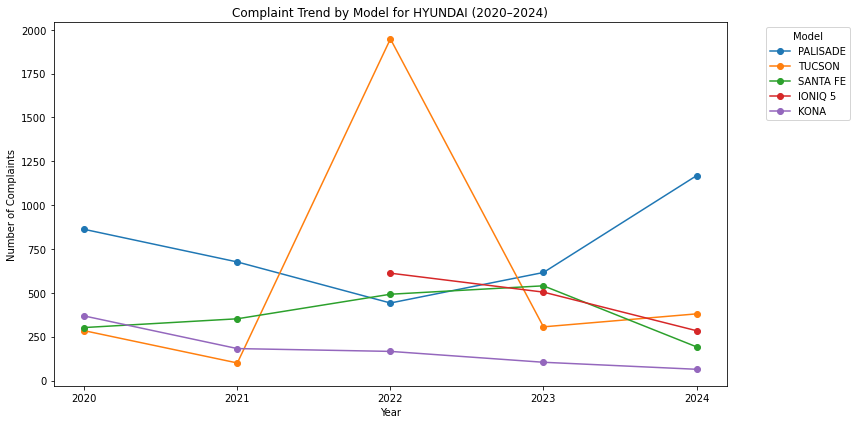

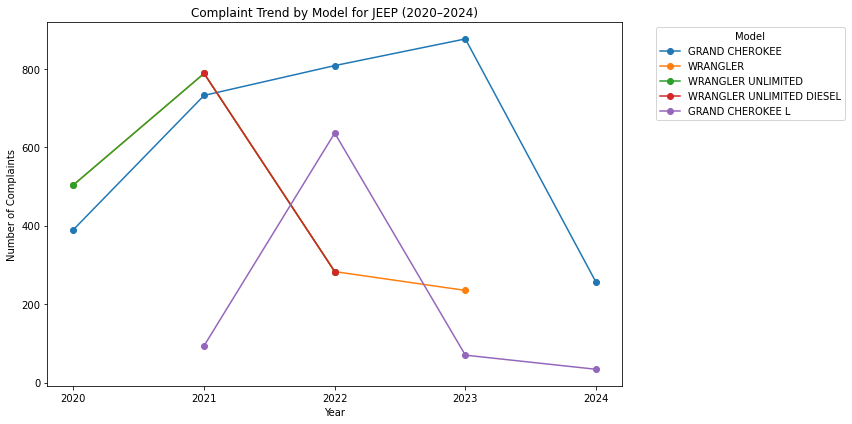

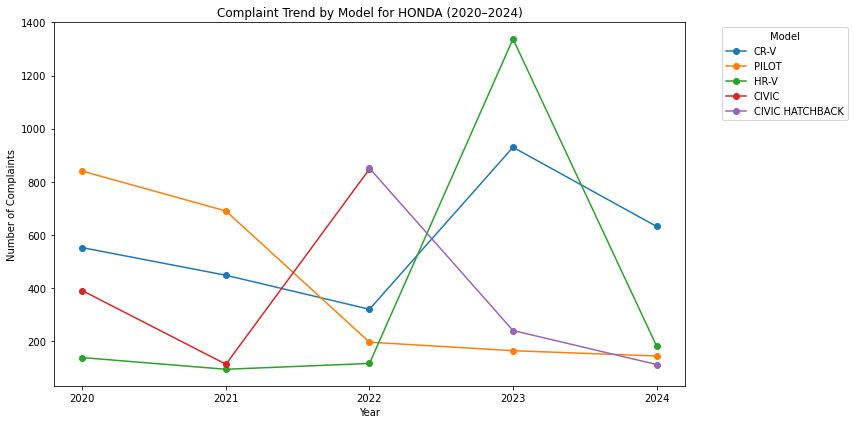

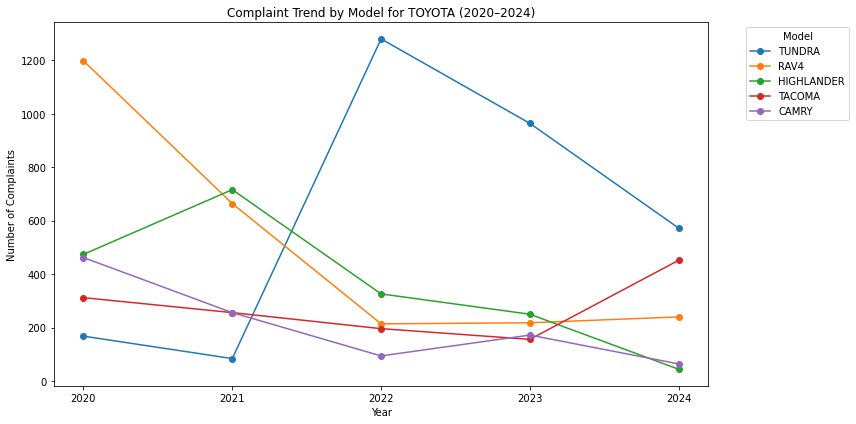

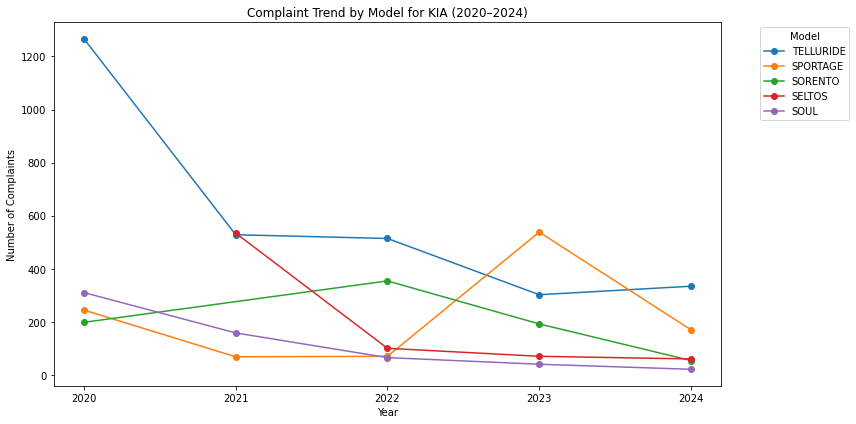

In [11]:
model_trend_df = pd.DataFrame(model_year_data, columns=["year", "make", "model", "count"])
for make in top_brands_overall:
    temp = model_trend_df[model_trend_df["make"] == make]
    top_models = (
        temp.groupby("model")["count"]
            .sum()
            .sort_values(ascending=False)
            .head(5)
            .index
    )
    plt.figure(figsize=(12, 6))
    for m in top_models:
        tmp_m = temp[temp["model"] == m]
        plt.plot(tmp_m["year"], tmp_m["count"], marker="o", label=m)
    plt.xticks([2020, 2021, 2022, 2023, 2024])
    plt.title(f"Complaint Trend by Model for {make} (2020–2024)")
    plt.xlabel("Year")
    plt.ylabel("Number of Complaints")
    plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()